In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import pickle
import cv2
import os
import glob
import time
from helperfunctions import *
from svmclassifier import *

In [2]:
# Read training data 
# Car
cars_files    = glob.glob('C://big/p5/vehicles/**/*.png', recursive=True)
# Not Car
notcars_files = glob.glob('C://big/p5/non-vehicles/**/*.png', recursive=True)

# store filenames in cars,notcars
cars=[]
notcars=[]
# search through readed data 
# read every third image to split time-series of images
for n in range(len(cars_files)):
    if n % 1 == 0:
        cars.append(cars_files[n])
#print(cars)

# Do the same for non-car data
for n in range(len(notcars_files)):
    if n % 1 == 0:
        notcars.append(notcars_files[n])
        
print('Cars size is: ',np.shape(cars))
print('Not-Cars size is: ',np.shape(notcars))

Cars size is:  (8792,)
Not-Cars size is:  (8968,)


In [3]:
# Testing functions above - pickle_extracted_features()
cspace ='YCrCb'
orient = 9
pix_per_cell = 4
cell_per_block = 2 
hog_channel = 'ALL'

# Extract the features, then save a pickle file
fname = 'X_scaler_scaled_X_y.p'
if os.path.isfile(fname) == False:
    print('Already Extracted, got my pickle')
    pass
else:
    pickle_extracted_features('X_scaler_scaled_X_y.p',cars,notcars,cspace,orient,
                          pix_per_cell,cell_per_block,hog_channel)

# Test training_with_SVM()
training_with_SVM('X_scaler_scaled_X_y.p')

pickle ext cspace is  YCrCb
extract feat cspace is YCrCb


C:\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


extract feat cspace is YCrCb
 Seconds to extract features:  193.79
The input was: cspace = YCrCb, orient = 9,    pix_per_cell = 4, cell_per_block = 2
Extracted features are stored in pickled file:X_scaler_scaled_X_y.p
10.4 Seconds to train SVC
Test Accuracy of SVC =  0.9908
Model saved as [ svc.pickle ] file
My SVC predictions: 
 [ 0.  0.  0.  1.  1.  0.  1.  0.  0.  1.]
For  10 labels: 
 [ 0.  0.  0.  1.  1.  0.  1.  0.  0.  1.]


In [4]:
cars[1]

'C://big/p5/vehicles\\GTI_Far\\image0001.png'

mean of img is:  117.350178675
converted to YC
find cars cspace is  YCrCb


C:\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


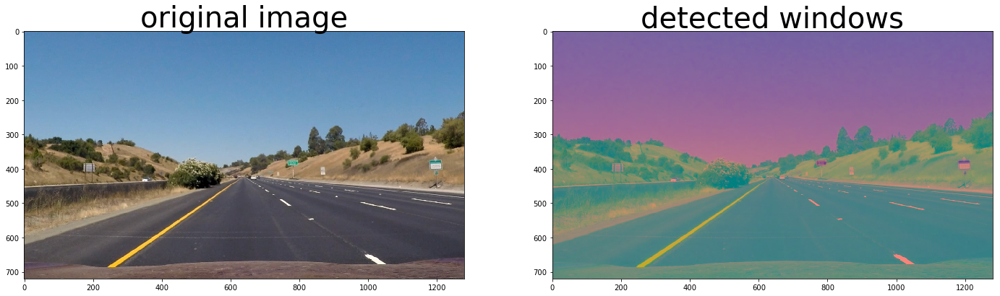

mean of img is:  107.373849826
converted to YC
find cars cspace is  YCrCb


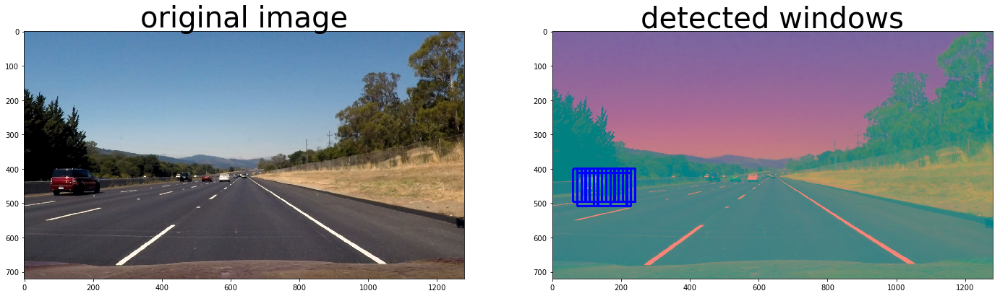

mean of img is:  127.244626736
converted to YC
find cars cspace is  YCrCb


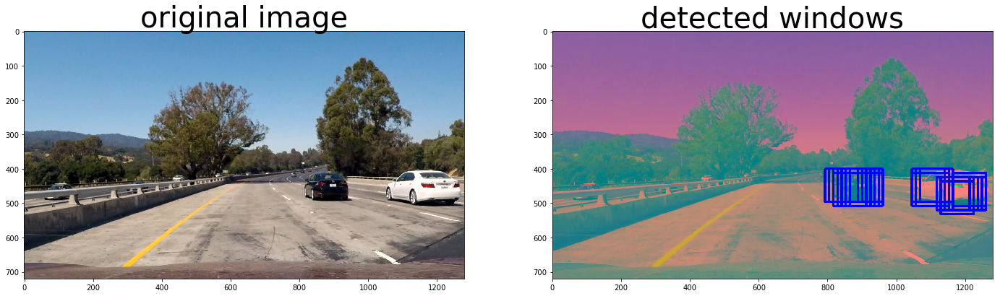

mean of img is:  114.273209635
converted to YC
find cars cspace is  YCrCb


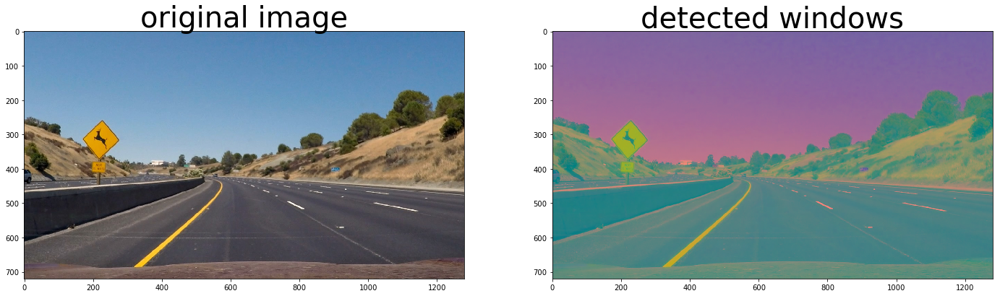

mean of img is:  115.685383753
converted to YC
find cars cspace is  YCrCb


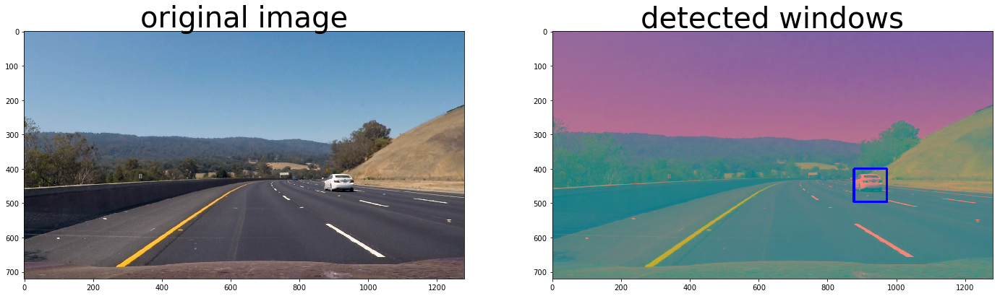

mean of img is:  121.923516348
converted to YC
find cars cspace is  YCrCb


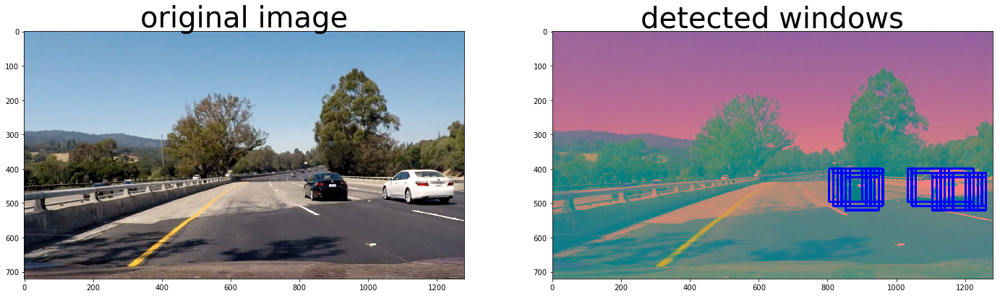

mean of img is:  89.1842570891
converted to YC
find cars cspace is  YCrCb


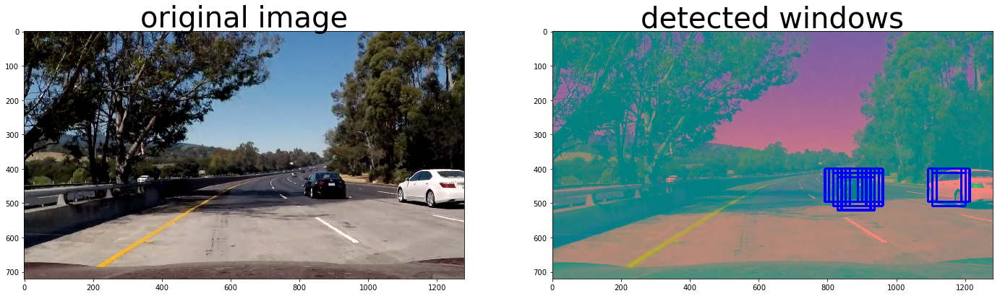

mean of img is:  102.510925564
converted to YC
find cars cspace is  YCrCb


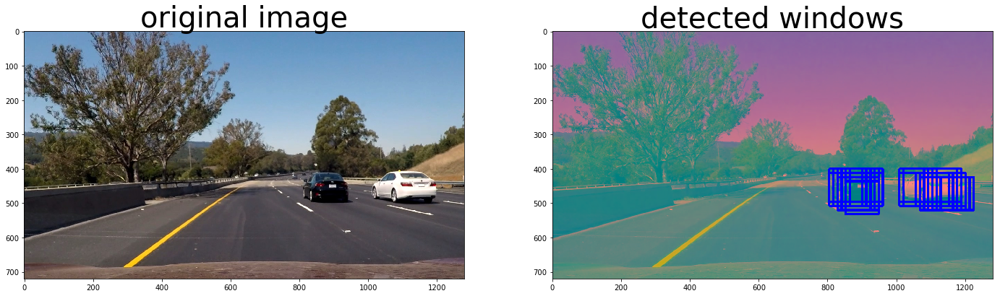

done
[((804, 400), (900, 496)), ((804, 412), (900, 508)), ((816, 400), (912, 496)), ((816, 412), (912, 508)), ((828, 400), (924, 496)), ((828, 412), (924, 508)), ((828, 424), (924, 520)), ((840, 400), (936, 496)), ((840, 412), (936, 508)), ((840, 424), (936, 520)), ((852, 400), (948, 496)), ((852, 412), (948, 508)), ((852, 424), (948, 520)), ((852, 436), (948, 532)), ((864, 400), (960, 496)), ((864, 412), (960, 508)), ((1008, 400), (1104, 496)), ((1008, 412), (1104, 508)), ((1020, 400), (1116, 496)), ((1020, 412), (1116, 508)), ((1056, 412), (1152, 508)), ((1068, 412), (1164, 508)), ((1068, 424), (1164, 520)), ((1080, 400), (1176, 496)), ((1080, 412), (1176, 508)), ((1080, 424), (1176, 520)), ((1092, 400), (1188, 496)), ((1092, 412), (1188, 508)), ((1092, 424), (1188, 520)), ((1104, 412), (1200, 508)), ((1104, 424), (1200, 520)), ((1116, 424), (1212, 520)), ((1128, 424), (1224, 520))]


In [5]:
# Pull in test Image
image = mpimg.imread('media/test_images/test3.jpg')

# Load the data and trained model weights
scaled_data = pickle.load(open(fname,'rb'))
svc = pickle.load(open('svc.pickle','rb'))    
X_scaler = scaled_data["X_scaler"]

ystart = 400
ystop = 700
scale = 1.5

input_directory = 'media/test_images/'
files = os.listdir(input_directory)
for file in files:
    filename,ext = os.path.splitext(file)
    if ext == '.jpg':
        image = mpimg.imread(input_directory + file)    

        win,img = find_cars(image, ystart, ystop, scale, svc, X_scaler,cspace, orient, 
                            pix_per_cell, cell_per_block)

    f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
    ax1.imshow(image)
    ax1.set_title('original image', fontsize=40)
    ax2.imshow(img)
    ax2.set_title('detected windows', fontsize=40)
    plt.show()
print("done")
print(win)



In [6]:
# test function above - find_cars
image = mpimg.imread('media/test_images/test3.jpg')

y_half = image.shape[0] // 2
y_end = image.shape[0] #- (y_half % 64)
ystart = [y_half,y_half+100]
ystop = [y_end-100, y_end]
scale = [1.2,2.5]
#ystart = [400]
#ystop = [700]
#scale = [1.5]
point_scale_data = np.vstack((ystart,ystop,scale))
print(point_scale_data)
windows = search_with_multiscale_windows(image, cspace, orient, pix_per_cell, cell_per_block, 
                                         point_scale_data)


print(windows)
print(len(windows))

[[ 360.   460. ]
 [ 620.   720. ]
 [   1.2    2.5]]
search_with_multiscale cspace is  YCrCb
mean of img is:  115.685383753
converted to YC
find cars cspace is  YCrCb


C:\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


mean of img is:  115.685383753
converted to YC
find cars cspace is  YCrCb
[((873, 398), (949, 474)), ((873, 408), (949, 484)), ((883, 398), (959, 474)), ((883, 408), (959, 484)), ((892, 408), (968, 484)), ((892, 417), (968, 493))]
6


search_with_multiscale cspace is  YCrCb
mean of img is:  117.350178675
converted to YC
find cars cspace is  YCrCb


C:\Anaconda3\envs\tensorflow-gpu\lib\site-packages\skimage\feature\_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


mean of img is:  117.350178675
converted to YC
find cars cspace is  YCrCb
No windows found


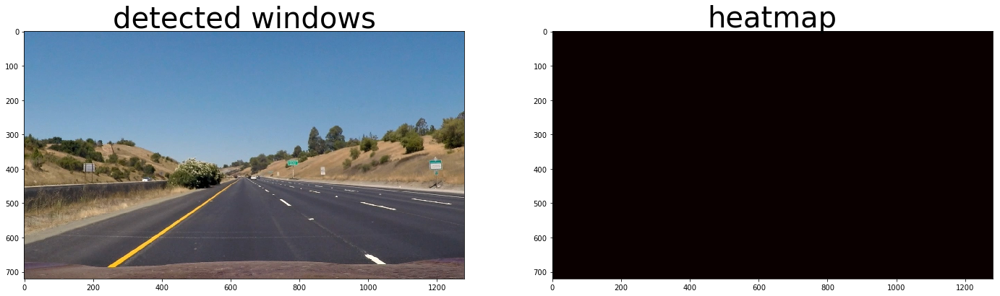

search_with_multiscale cspace is  YCrCb
mean of img is:  107.373849826
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.373849826
converted to YC
find cars cspace is  YCrCb


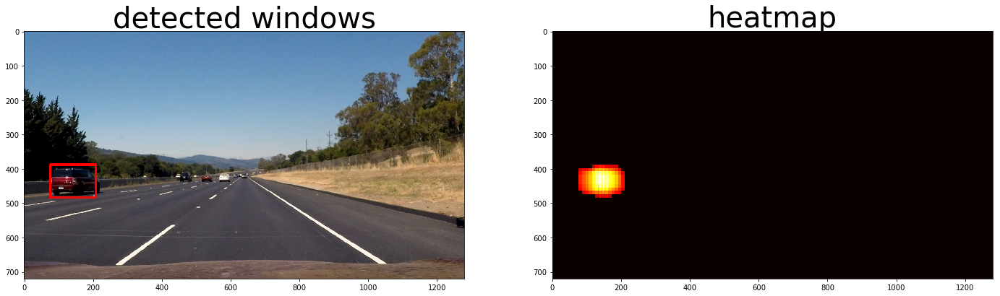

search_with_multiscale cspace is  YCrCb
mean of img is:  127.244626736
converted to YC
find cars cspace is  YCrCb
mean of img is:  127.244626736
converted to YC
find cars cspace is  YCrCb


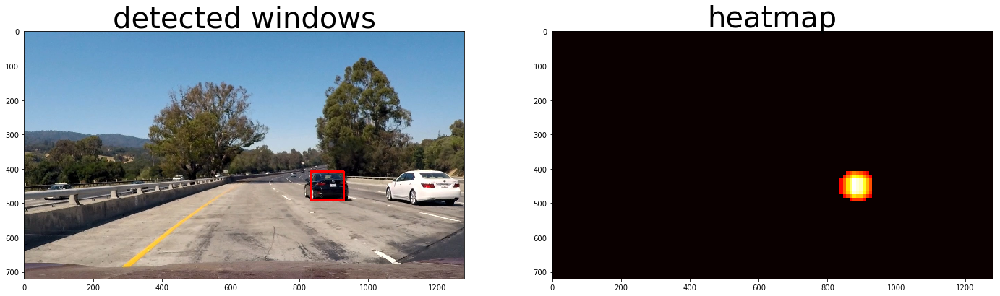

search_with_multiscale cspace is  YCrCb
mean of img is:  114.273209635
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.273209635
converted to YC
find cars cspace is  YCrCb
No windows found


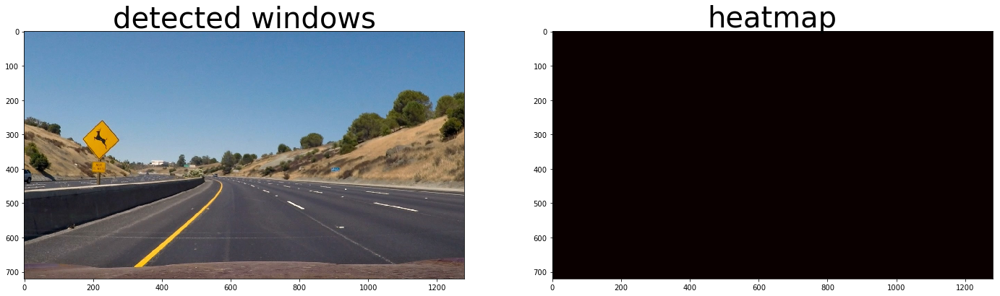

search_with_multiscale cspace is  YCrCb
mean of img is:  115.685383753
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.685383753
converted to YC
find cars cspace is  YCrCb


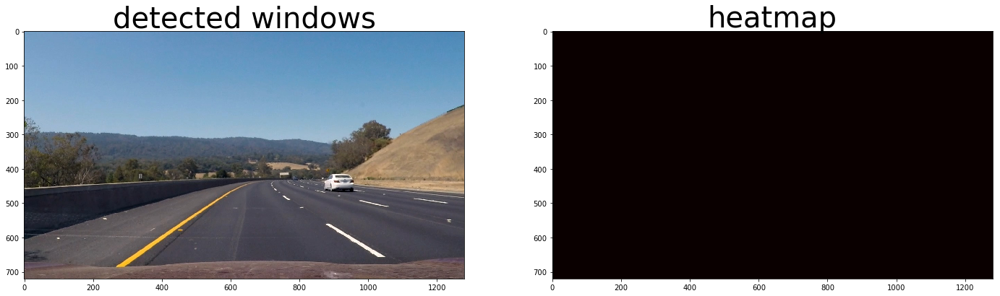

search_with_multiscale cspace is  YCrCb
mean of img is:  121.923516348
converted to YC
find cars cspace is  YCrCb
mean of img is:  121.923516348
converted to YC
find cars cspace is  YCrCb


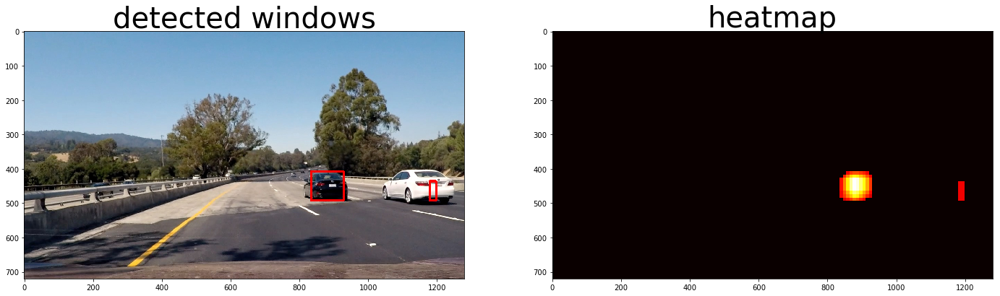

search_with_multiscale cspace is  YCrCb
mean of img is:  89.1842570891
converted to YC
find cars cspace is  YCrCb
mean of img is:  89.1842570891
converted to YC
find cars cspace is  YCrCb


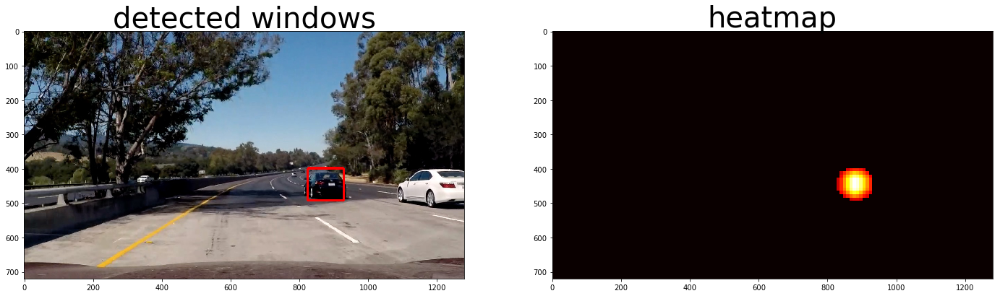

search_with_multiscale cspace is  YCrCb
mean of img is:  102.510925564
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.510925564
converted to YC
find cars cspace is  YCrCb


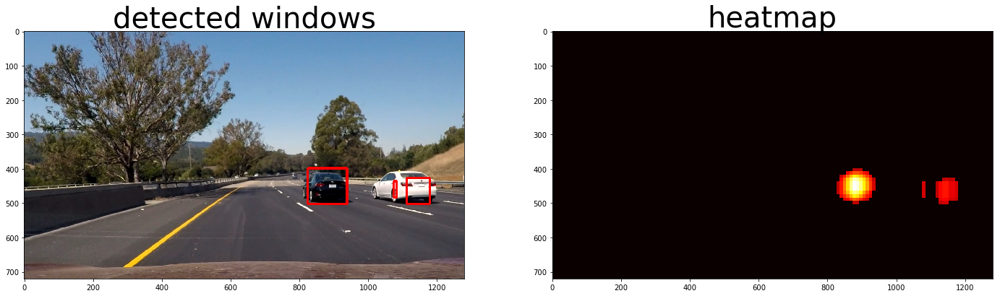

done


In [7]:
def draw_labeled_windows(img, labels):
    # Iterate through all detected cars
    for car_num in range(1, labels[1]+1):
        # Find pixels with each car_num label value
        nonzero = (labels[0] == car_num).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        win = ((np.min(nonzerox),np.min(nonzeroy)),(np.max(nonzerox),np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, win[0], win[1], (255,0,0), 6)

    # Return image
    return img


def test_image(image,cspace,orient,pix_per_cell,cell_per_block,point_scale_data):
    img = np.copy(image)
    windows = search_with_multiscale_windows(image, cspace, orient, pix_per_cell, 
                                             cell_per_block,point_scale_data)
    
    if len(windows) > 0:
        heat = np.zeros_like(image[:,:,0]).astype(np.float)
        heat = add_heat(heat, windows)
        # Lower value increases likelyhood of drawing box
        heat = apply_threshold(heat,8)
        heatmap = np.clip(heat, 0, 255)
        labels = label(heatmap)
        draw_img = draw_labeled_windows(img, labels)
    else:
        print("No windows found")
        draw_img = image
        heatmap = np.zeros_like(image[:,:,0]).astype(np.float)
        
    return draw_img,heatmap


def search_with_multiscale_windows(img, cspace, orient, pix_per_cell, cell_per_block, 
                                   point_scale_data, spatial_size=(32,32), hist_bins=32):
    print('search_with_multiscale cspace is ',cspace)

    # Define array to store recent windows
    windows = []
    origin = np.copy(img)
    svc = pickle.load(open('svc.pickle','rb'))
    
    scal_data = pickle.load(open('X_scaler_scaled_X_y.p','rb'))
    X_scaler = scal_data["X_scaler"]
    
    ystart=point_scale_data[0]
    ystop=point_scale_data[1]
    scale=point_scale_data[2]
    #print(ystart,ystop,scale)
    
    for y_start,y_end, scales in zip(ystart,ystop,scale):
        win_list, draw_img = find_cars(img, int(y_start), int(y_end), scales, svc, 
                                       X_scaler, cspace,orient,pix_per_cell, cell_per_block)
        
        windows = windows + win_list
    
    return windows




# test multiscale window search and heatmap
cspace = "YCrCb"
input_directory = 'media/test_images/'
files = os.listdir(input_directory)
for file in files:
    filename,ext = os.path.splitext(file)
    if ext == '.jpg':
        image = mpimg.imread(input_directory + file)    

        # When moving function to outside script, had to pass all the arguments
        # Not sure what side effects this caused
        img,heat = test_image(image,cspace,orient,pix_per_cell,cell_per_block,point_scale_data)

    f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
    ax1.imshow(img)
    ax1.set_title('detected windows', fontsize=40)
    ax2.imshow(heat, cmap='hot')
    ax2.set_title('heatmap', fontsize=40)
    plt.show()
print("done")



In [8]:
from collections import deque
from moviepy.editor import VideoFileClip

iteration = 1

# keep current heatmaps
heatmaps = deque(maxlen=15)
def process_video(image):
    cimg = np.copy(image)
    windows = search_with_multiscale_windows(image, cspace, orient, pix_per_cell, cell_per_block,
                                             point_scale_data)

    #print("iterations: ",iteration)
    global iteration, heatmaps
    if len(windows) > 0:
        heat = np.zeros_like(image[:,:,0]).astype(np.float)
        heat = add_heat(heat, windows)
        heatmaps.append(heat)
        #print(len(heatmaps))
        # take recent 10 heatmaps and average them
        if len(heatmaps) == 10:
            avg_heat = sum(heatmaps)/len(heatmaps)
            heat = avg_heat
        heat = apply_threshold(heat,2)
        heatmap = np.clip(heat, 0, 255)
        #heatmaps.append(heatmap)
        #if iteration % 10 == 0:
        #    heatmap = avg_heatmaps
        labels = label(heatmap)
        draw_img = draw_labeled_windows(cimg, labels)
    else:
        # pass the image itself if nothing was detected
        draw_img = cimg
    iteration += 1
    return draw_img

# test on short video
output_name = 'testing_video_thresh_v2.mp4'
clip0 = VideoFileClip("media/project_video.mp4")
#clip0 = VideoFileClip("media/project_video.mp4").subclip(25,30)
clipping = clip0.fl_image(process_video)
%time clipping.write_videofile(output_name, audio=False)

search_with_multiscale cspace is  YCrCb
mean of img is:  115.237972367
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.237972367
converted to YC
find cars cspace is  YCrCb
[MoviePy] >>>> Building video testing_video_thresh_v2.mp4
[MoviePy] Writing video testing_video_thresh_v2.mp4


  0%|                                                                                         | 0/1261 [00:00<?, ?it/s]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.237972367
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.237972367
converted to YC
find cars cspace is  YCrCb


  0%|                                                                               | 1/1261 [00:06<2:24:51,  6.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.665230035
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.665230035
converted to YC
find cars cspace is  YCrCb


  0%|▏                                                                              | 2/1261 [00:13<2:25:48,  6.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.644311343
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.644311343
converted to YC
find cars cspace is  YCrCb


  0%|▏                                                                              | 3/1261 [00:21<2:26:36,  6.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.031249638
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.031249638
converted to YC
find cars cspace is  YCrCb


  0%|▎                                                                              | 4/1261 [00:28<2:27:02,  7.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.297001591
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.297001591
converted to YC
find cars cspace is  YCrCb


  0%|▎                                                                              | 5/1261 [00:35<2:27:20,  7.04s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.39701208
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.39701208
converted to YC
find cars cspace is  YCrCb


  0%|▍                                                                              | 6/1261 [00:42<2:25:47,  6.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.266188874
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.266188874
converted to YC
find cars cspace is  YCrCb


  1%|▍                                                                              | 7/1261 [00:48<2:25:21,  6.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.067706887
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.067706887
converted to YC
find cars cspace is  YCrCb


  1%|▌                                                                              | 8/1261 [00:55<2:24:57,  6.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.719474465
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.719474465
converted to YC
find cars cspace is  YCrCb


  1%|▌                                                                              | 9/1261 [01:02<2:24:31,  6.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.621252894
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.621252894
converted to YC
find cars cspace is  YCrCb


  1%|▌                                                                             | 10/1261 [01:09<2:25:09,  6.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.549210431
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.549210431
converted to YC
find cars cspace is  YCrCb


  1%|▋                                                                             | 11/1261 [01:16<2:25:07,  6.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.36929796
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.36929796
converted to YC
find cars cspace is  YCrCb


  1%|▋                                                                             | 12/1261 [01:23<2:25:23,  6.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.581168981
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.581168981
converted to YC
find cars cspace is  YCrCb


  1%|▊                                                                             | 13/1261 [01:30<2:25:34,  7.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.766868851
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.766868851
converted to YC
find cars cspace is  YCrCb


  1%|▊                                                                             | 14/1261 [01:37<2:25:59,  7.02s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.009276259
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.009276259
converted to YC
find cars cspace is  YCrCb


  1%|▉                                                                             | 15/1261 [01:44<2:24:32,  6.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.518543475
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.518543475
converted to YC
find cars cspace is  YCrCb


  1%|▉                                                                             | 16/1261 [01:51<2:23:55,  6.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.686454355
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.686454355
converted to YC
find cars cspace is  YCrCb


  1%|█                                                                             | 17/1261 [01:58<2:23:10,  6.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.721155237
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.721155237
converted to YC
find cars cspace is  YCrCb


  1%|█                                                                             | 18/1261 [02:05<2:22:33,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.861740813
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.861740813
converted to YC
find cars cspace is  YCrCb


  2%|█▏                                                                            | 19/1261 [02:12<2:22:22,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.984048032
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.984048032
converted to YC
find cars cspace is  YCrCb


  2%|█▏                                                                            | 20/1261 [02:19<2:22:18,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.342928241
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.342928241
converted to YC
find cars cspace is  YCrCb


  2%|█▎                                                                            | 21/1261 [02:26<2:22:54,  6.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.867934389
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.867934389
converted to YC
find cars cspace is  YCrCb


  2%|█▎                                                                            | 22/1261 [02:32<2:21:59,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  118.214555122
converted to YC
find cars cspace is  YCrCb
mean of img is:  118.214555122
converted to YC
find cars cspace is  YCrCb


  2%|█▍                                                                            | 23/1261 [02:39<2:21:54,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.892952474
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.892952474
converted to YC
find cars cspace is  YCrCb


  2%|█▍                                                                            | 24/1261 [02:46<2:22:48,  6.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.655373264
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.655373264
converted to YC
find cars cspace is  YCrCb


  2%|█▌                                                                            | 25/1261 [02:53<2:24:21,  7.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.753922526
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.753922526
converted to YC
find cars cspace is  YCrCb


  2%|█▌                                                                            | 26/1261 [03:00<2:23:51,  6.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.047398003
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.047398003
converted to YC
find cars cspace is  YCrCb


  2%|█▋                                                                            | 27/1261 [03:07<2:22:31,  6.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.134037543
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.134037543
converted to YC
find cars cspace is  YCrCb


  2%|█▋                                                                            | 28/1261 [03:14<2:20:15,  6.83s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.156240958
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.156240958
converted to YC
find cars cspace is  YCrCb


  2%|█▊                                                                            | 29/1261 [03:21<2:21:42,  6.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.005024595
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.005024595
converted to YC
find cars cspace is  YCrCb


  2%|█▊                                                                            | 30/1261 [03:27<2:19:20,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.943518519
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.943518519
converted to YC
find cars cspace is  YCrCb


  2%|█▉                                                                            | 31/1261 [03:34<2:17:29,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.033337312
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.033337312
converted to YC
find cars cspace is  YCrCb


  3%|█▉                                                                            | 32/1261 [03:40<2:16:54,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.88965748
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.88965748
converted to YC
find cars cspace is  YCrCb


  3%|██                                                                            | 33/1261 [03:47<2:16:50,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.948596282
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.948596282
converted to YC
find cars cspace is  YCrCb


  3%|██                                                                            | 34/1261 [03:54<2:17:19,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.109858941
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.109858941
converted to YC
find cars cspace is  YCrCb


  3%|██▏                                                                           | 35/1261 [04:01<2:17:13,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.297221137
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.297221137
converted to YC
find cars cspace is  YCrCb


  3%|██▏                                                                           | 36/1261 [04:07<2:15:57,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.706922381
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.706922381
converted to YC
find cars cspace is  YCrCb


  3%|██▎                                                                           | 37/1261 [04:14<2:15:27,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.811163918
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.811163918
converted to YC
find cars cspace is  YCrCb


  3%|██▎                                                                           | 38/1261 [04:20<2:15:03,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.903693576
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.903693576
converted to YC
find cars cspace is  YCrCb


  3%|██▍                                                                           | 39/1261 [04:27<2:15:46,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.990760995
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.990760995
converted to YC
find cars cspace is  YCrCb


  3%|██▍                                                                           | 40/1261 [04:34<2:18:17,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.140673466
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.140673466
converted to YC
find cars cspace is  YCrCb


  3%|██▌                                                                           | 41/1261 [04:41<2:18:08,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.303644748
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.303644748
converted to YC
find cars cspace is  YCrCb


  3%|██▌                                                                           | 42/1261 [04:48<2:19:02,  6.84s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.265141782
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.265141782
converted to YC
find cars cspace is  YCrCb


  3%|██▋                                                                           | 43/1261 [04:55<2:17:43,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.875780165
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.875780165
converted to YC
find cars cspace is  YCrCb


  3%|██▋                                                                           | 44/1261 [05:01<2:16:53,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.811631944
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.811631944
converted to YC
find cars cspace is  YCrCb


  4%|██▊                                                                           | 45/1261 [05:08<2:16:14,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.781328125
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.781328125
converted to YC
find cars cspace is  YCrCb


  4%|██▊                                                                           | 46/1261 [05:15<2:15:09,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.89572555
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.89572555
converted to YC
find cars cspace is  YCrCb


  4%|██▉                                                                           | 47/1261 [05:21<2:14:33,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.08557798
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.08557798
converted to YC
find cars cspace is  YCrCb


  4%|██▉                                                                           | 48/1261 [05:28<2:13:53,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.142732567
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.142732567
converted to YC
find cars cspace is  YCrCb


  4%|███                                                                           | 49/1261 [05:34<2:13:14,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.299893663
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.299893663
converted to YC
find cars cspace is  YCrCb


  4%|███                                                                           | 50/1261 [05:41<2:12:44,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.143815104
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.143815104
converted to YC
find cars cspace is  YCrCb


  4%|███▏                                                                          | 51/1261 [05:47<2:12:22,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.345365668
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.345365668
converted to YC
find cars cspace is  YCrCb


  4%|███▏                                                                          | 52/1261 [05:54<2:12:19,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.474323278
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.474323278
converted to YC
find cars cspace is  YCrCb


  4%|███▎                                                                          | 53/1261 [06:01<2:13:08,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.76620298
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.76620298
converted to YC
find cars cspace is  YCrCb


  4%|███▎                                                                          | 54/1261 [06:07<2:12:32,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.023301866
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.023301866
converted to YC
find cars cspace is  YCrCb


  4%|███▍                                                                          | 55/1261 [06:14<2:12:16,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.985031467
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.985031467
converted to YC
find cars cspace is  YCrCb


  4%|███▍                                                                          | 56/1261 [06:20<2:11:45,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.877722801
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.877722801
converted to YC
find cars cspace is  YCrCb


  5%|███▌                                                                          | 57/1261 [06:27<2:13:00,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.473944951
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.473944951
converted to YC
find cars cspace is  YCrCb


  5%|███▌                                                                          | 58/1261 [06:34<2:13:02,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.821266638
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.821266638
converted to YC
find cars cspace is  YCrCb


  5%|███▋                                                                          | 59/1261 [06:40<2:13:50,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.914938151
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.914938151
converted to YC
find cars cspace is  YCrCb


  5%|███▋                                                                          | 60/1261 [06:47<2:15:15,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.866636285
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.866636285
converted to YC
find cars cspace is  YCrCb


  5%|███▊                                                                          | 61/1261 [06:54<2:15:51,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.08161603
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.08161603
converted to YC
find cars cspace is  YCrCb


  5%|███▊                                                                          | 62/1261 [07:01<2:15:27,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.069769604
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.069769604
converted to YC
find cars cspace is  YCrCb


  5%|███▉                                                                          | 63/1261 [07:08<2:17:05,  6.87s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.100418113
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.100418113
converted to YC
find cars cspace is  YCrCb


  5%|███▉                                                                          | 64/1261 [07:15<2:19:08,  6.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.357356409
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.357356409
converted to YC
find cars cspace is  YCrCb


  5%|████                                                                          | 65/1261 [07:22<2:20:10,  7.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.553011429
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.553011429
converted to YC
find cars cspace is  YCrCb


  5%|████                                                                          | 66/1261 [07:29<2:19:42,  7.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.631155237
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.631155237
converted to YC
find cars cspace is  YCrCb


  5%|████▏                                                                         | 67/1261 [07:36<2:17:46,  6.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.5292636
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.5292636
converted to YC
find cars cspace is  YCrCb


  5%|████▏                                                                         | 68/1261 [07:43<2:15:40,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.418578197
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.418578197
converted to YC
find cars cspace is  YCrCb


  5%|████▎                                                                         | 69/1261 [07:49<2:14:03,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.145390625
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.145390625
converted to YC
find cars cspace is  YCrCb


  6%|████▎                                                                         | 70/1261 [07:56<2:12:25,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.013950014
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.013950014
converted to YC
find cars cspace is  YCrCb


  6%|████▍                                                                         | 71/1261 [08:03<2:13:42,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.608139829
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.608139829
converted to YC
find cars cspace is  YCrCb


  6%|████▍                                                                         | 72/1261 [08:09<2:13:41,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.538342737
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.538342737
converted to YC
find cars cspace is  YCrCb


  6%|████▌                                                                         | 73/1261 [08:16<2:13:29,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.536730686
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.536730686
converted to YC
find cars cspace is  YCrCb


  6%|████▌                                                                         | 74/1261 [08:23<2:11:42,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.511660156
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.511660156
converted to YC
find cars cspace is  YCrCb


  6%|████▋                                                                         | 75/1261 [08:29<2:10:47,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.480341073
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.480341073
converted to YC
find cars cspace is  YCrCb


  6%|████▋                                                                         | 76/1261 [08:36<2:10:16,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.242607422
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.242607422
converted to YC
find cars cspace is  YCrCb


  6%|████▊                                                                         | 77/1261 [08:42<2:10:30,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.363734809
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.363734809
converted to YC
find cars cspace is  YCrCb


  6%|████▊                                                                         | 78/1261 [08:49<2:12:12,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.813857422
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.813857422
converted to YC
find cars cspace is  YCrCb


  6%|████▉                                                                         | 79/1261 [08:56<2:13:40,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.968581814
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.968581814
converted to YC
find cars cspace is  YCrCb


  6%|████▉                                                                         | 80/1261 [09:03<2:10:51,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.939879196
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.939879196
converted to YC
find cars cspace is  YCrCb


  6%|█████                                                                         | 81/1261 [09:09<2:09:48,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.796676071
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.796676071
converted to YC
find cars cspace is  YCrCb


  7%|█████                                                                         | 82/1261 [09:16<2:09:52,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.505271629
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.505271629
converted to YC
find cars cspace is  YCrCb


  7%|█████▏                                                                        | 83/1261 [09:22<2:10:38,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.330716146
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.330716146
converted to YC
find cars cspace is  YCrCb


  7%|█████▏                                                                        | 84/1261 [09:29<2:11:51,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.317186053
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.317186053
converted to YC
find cars cspace is  YCrCb


  7%|█████▎                                                                        | 85/1261 [09:36<2:10:19,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.630198206
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.630198206
converted to YC
find cars cspace is  YCrCb


  7%|█████▎                                                                        | 86/1261 [09:42<2:09:18,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.710713976
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.710713976
converted to YC
find cars cspace is  YCrCb


  7%|█████▍                                                                        | 87/1261 [09:49<2:08:33,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.735269459
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.735269459
converted to YC
find cars cspace is  YCrCb


  7%|█████▍                                                                        | 88/1261 [09:55<2:08:26,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.782434534
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.782434534
converted to YC
find cars cspace is  YCrCb


  7%|█████▌                                                                        | 89/1261 [10:02<2:08:15,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.820259332
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.820259332
converted to YC
find cars cspace is  YCrCb


  7%|█████▌                                                                        | 90/1261 [10:09<2:08:28,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.967486979
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.967486979
converted to YC
find cars cspace is  YCrCb


  7%|█████▋                                                                        | 91/1261 [10:15<2:07:58,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.154530527
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.154530527
converted to YC
find cars cspace is  YCrCb


  7%|█████▋                                                                        | 92/1261 [10:22<2:07:46,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.856001519
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.856001519
converted to YC
find cars cspace is  YCrCb


  7%|█████▊                                                                        | 93/1261 [10:28<2:09:00,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.635661892
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.635661892
converted to YC
find cars cspace is  YCrCb


  7%|█████▊                                                                        | 94/1261 [10:35<2:09:25,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.256385272
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.256385272
converted to YC
find cars cspace is  YCrCb


  8%|█████▉                                                                        | 95/1261 [10:42<2:11:26,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.903858869
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.903858869
converted to YC
find cars cspace is  YCrCb


  8%|█████▉                                                                        | 96/1261 [10:49<2:12:51,  6.84s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.774773944
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.774773944
converted to YC
find cars cspace is  YCrCb


  8%|██████                                                                        | 97/1261 [10:56<2:12:06,  6.81s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.598585793
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.598585793
converted to YC
find cars cspace is  YCrCb


  8%|██████                                                                        | 98/1261 [11:02<2:10:13,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.562110098
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.562110098
converted to YC
find cars cspace is  YCrCb


  8%|██████                                                                        | 99/1261 [11:09<2:09:25,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.787435258
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.787435258
converted to YC
find cars cspace is  YCrCb


  8%|██████                                                                       | 100/1261 [11:16<2:08:35,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.731548756
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.731548756
converted to YC
find cars cspace is  YCrCb


  8%|██████▏                                                                      | 101/1261 [11:22<2:08:39,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.716246021
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.716246021
converted to YC
find cars cspace is  YCrCb


  8%|██████▏                                                                      | 102/1261 [11:29<2:09:22,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.809116753
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.809116753
converted to YC
find cars cspace is  YCrCb


  8%|██████▎                                                                      | 103/1261 [11:36<2:08:18,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.984444444
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.984444444
converted to YC
find cars cspace is  YCrCb


  8%|██████▎                                                                      | 104/1261 [11:42<2:07:27,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.091180556
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.091180556
converted to YC
find cars cspace is  YCrCb


  8%|██████▍                                                                      | 105/1261 [11:49<2:07:16,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.867946687
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.867946687
converted to YC
find cars cspace is  YCrCb


  8%|██████▍                                                                      | 106/1261 [11:55<2:07:07,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.405239439
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.405239439
converted to YC
find cars cspace is  YCrCb


  8%|██████▌                                                                      | 107/1261 [12:02<2:08:08,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.086653646
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.086653646
converted to YC
find cars cspace is  YCrCb


  9%|██████▌                                                                      | 108/1261 [12:09<2:09:03,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.872617187
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.872617187
converted to YC
find cars cspace is  YCrCb


  9%|██████▋                                                                      | 109/1261 [12:16<2:08:53,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.834404297
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.834404297
converted to YC
find cars cspace is  YCrCb


  9%|██████▋                                                                      | 110/1261 [12:22<2:08:24,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.906526693
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.906526693
converted to YC
find cars cspace is  YCrCb


  9%|██████▊                                                                      | 111/1261 [12:29<2:07:18,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.844216942
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.844216942
converted to YC
find cars cspace is  YCrCb


  9%|██████▊                                                                      | 112/1261 [12:35<2:06:59,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.923919271
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.923919271
converted to YC
find cars cspace is  YCrCb


  9%|██████▉                                                                      | 113/1261 [12:42<2:07:43,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.129002098
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.129002098
converted to YC
find cars cspace is  YCrCb


  9%|██████▉                                                                      | 114/1261 [12:49<2:09:37,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.254159433
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.254159433
converted to YC
find cars cspace is  YCrCb


  9%|███████                                                                      | 115/1261 [12:56<2:10:23,  6.83s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.225715422
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.225715422
converted to YC
find cars cspace is  YCrCb


  9%|███████                                                                      | 116/1261 [13:03<2:10:08,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.340484664
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.340484664
converted to YC
find cars cspace is  YCrCb


  9%|███████▏                                                                     | 117/1261 [13:10<2:09:49,  6.81s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.361287977
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.361287977
converted to YC
find cars cspace is  YCrCb


  9%|███████▏                                                                     | 118/1261 [13:17<2:09:33,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.267006293
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.267006293
converted to YC
find cars cspace is  YCrCb


  9%|███████▎                                                                     | 119/1261 [13:23<2:10:02,  6.83s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.157921007
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.157921007
converted to YC
find cars cspace is  YCrCb


 10%|███████▎                                                                     | 120/1261 [13:30<2:10:46,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.495814525
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.495814525
converted to YC
find cars cspace is  YCrCb


 10%|███████▍                                                                     | 121/1261 [13:37<2:09:53,  6.84s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.553362269
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.553362269
converted to YC
find cars cspace is  YCrCb


 10%|███████▍                                                                     | 122/1261 [13:44<2:09:09,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.773759404
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.773759404
converted to YC
find cars cspace is  YCrCb


 10%|███████▌                                                                     | 123/1261 [13:50<2:07:15,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.932655888
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.932655888
converted to YC
find cars cspace is  YCrCb


 10%|███████▌                                                                     | 124/1261 [13:57<2:06:27,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.044329065
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.044329065
converted to YC
find cars cspace is  YCrCb


 10%|███████▋                                                                     | 125/1261 [14:04<2:07:18,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.051858001
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.051858001
converted to YC
find cars cspace is  YCrCb


 10%|███████▋                                                                     | 126/1261 [14:11<2:08:39,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.195471644
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.195471644
converted to YC
find cars cspace is  YCrCb


 10%|███████▊                                                                     | 127/1261 [14:18<2:11:25,  6.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.313972801
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.313972801
converted to YC
find cars cspace is  YCrCb


 10%|███████▊                                                                     | 128/1261 [14:25<2:10:56,  6.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.57956127
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.57956127
converted to YC
find cars cspace is  YCrCb


 10%|███████▉                                                                     | 129/1261 [14:32<2:12:34,  7.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.844457827
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.844457827
converted to YC
find cars cspace is  YCrCb


 10%|███████▉                                                                     | 130/1261 [14:39<2:10:03,  6.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.00664388
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.00664388
converted to YC
find cars cspace is  YCrCb


 10%|███████▉                                                                     | 131/1261 [14:46<2:09:55,  6.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.062799479
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.062799479
converted to YC
find cars cspace is  YCrCb


 10%|████████                                                                     | 132/1261 [14:52<2:09:03,  6.86s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.939881366
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.939881366
converted to YC
find cars cspace is  YCrCb


 11%|████████                                                                     | 133/1261 [14:59<2:07:42,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.772865307
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.772865307
converted to YC
find cars cspace is  YCrCb


 11%|████████▏                                                                    | 134/1261 [15:06<2:07:14,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.462811053
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.462811053
converted to YC
find cars cspace is  YCrCb


 11%|████████▏                                                                    | 135/1261 [15:13<2:07:17,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.453726128
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.453726128
converted to YC
find cars cspace is  YCrCb


 11%|████████▎                                                                    | 136/1261 [15:19<2:05:50,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.487251881
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.487251881
converted to YC
find cars cspace is  YCrCb


 11%|████████▎                                                                    | 137/1261 [15:26<2:04:35,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.502694227
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.502694227
converted to YC
find cars cspace is  YCrCb


 11%|████████▍                                                                    | 138/1261 [15:32<2:04:35,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.478233869
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.478233869
converted to YC
find cars cspace is  YCrCb


 11%|████████▍                                                                    | 139/1261 [15:39<2:04:34,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.603968822
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.603968822
converted to YC
find cars cspace is  YCrCb


 11%|████████▌                                                                    | 140/1261 [15:46<2:05:31,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.834605758
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.834605758
converted to YC
find cars cspace is  YCrCb


 11%|████████▌                                                                    | 141/1261 [15:53<2:05:00,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.652821181
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.652821181
converted to YC
find cars cspace is  YCrCb


 11%|████████▋                                                                    | 142/1261 [15:59<2:04:18,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.633077257
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.633077257
converted to YC
find cars cspace is  YCrCb


 11%|████████▋                                                                    | 143/1261 [16:06<2:03:43,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.571112196
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.571112196
converted to YC
find cars cspace is  YCrCb


 11%|████████▊                                                                    | 144/1261 [16:12<2:03:11,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.581910807
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.581910807
converted to YC
find cars cspace is  YCrCb


 11%|████████▊                                                                    | 145/1261 [16:19<2:04:34,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.599316045
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.599316045
converted to YC
find cars cspace is  YCrCb


 12%|████████▉                                                                    | 146/1261 [16:26<2:05:41,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.704650969
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.704650969
converted to YC
find cars cspace is  YCrCb


 12%|████████▉                                                                    | 147/1261 [16:33<2:04:38,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.074587674
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.074587674
converted to YC
find cars cspace is  YCrCb


 12%|█████████                                                                    | 148/1261 [16:39<2:03:24,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.34536169
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.34536169
converted to YC
find cars cspace is  YCrCb


 12%|█████████                                                                    | 149/1261 [16:46<2:03:47,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.580641638
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.580641638
converted to YC
find cars cspace is  YCrCb


 12%|█████████▏                                                                   | 150/1261 [16:53<2:04:01,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.897631293
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.897631293
converted to YC
find cars cspace is  YCrCb


 12%|█████████▏                                                                   | 151/1261 [17:00<2:05:51,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.43585829
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.43585829
converted to YC
find cars cspace is  YCrCb


 12%|█████████▎                                                                   | 152/1261 [17:06<2:05:13,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.784647714
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.784647714
converted to YC
find cars cspace is  YCrCb


 12%|█████████▎                                                                   | 153/1261 [17:14<2:07:11,  6.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.61117947
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.61117947
converted to YC
find cars cspace is  YCrCb


 12%|█████████▍                                                                   | 154/1261 [17:20<2:05:00,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.791779514
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.791779514
converted to YC
find cars cspace is  YCrCb


 12%|█████████▍                                                                   | 155/1261 [17:27<2:04:01,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.784465422
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.784465422
converted to YC
find cars cspace is  YCrCb


 12%|█████████▌                                                                   | 156/1261 [17:34<2:05:12,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.555904586
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.555904586
converted to YC
find cars cspace is  YCrCb


 12%|█████████▌                                                                   | 157/1261 [17:41<2:05:15,  6.81s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.558365885
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.558365885
converted to YC
find cars cspace is  YCrCb


 13%|█████████▋                                                                   | 158/1261 [17:47<2:04:15,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.649192347
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.649192347
converted to YC
find cars cspace is  YCrCb


 13%|█████████▋                                                                   | 159/1261 [17:54<2:04:34,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.817995877
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.817995877
converted to YC
find cars cspace is  YCrCb


 13%|█████████▊                                                                   | 160/1261 [18:01<2:04:38,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.841976997
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.841976997
converted to YC
find cars cspace is  YCrCb


 13%|█████████▊                                                                   | 161/1261 [18:08<2:03:58,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.930817781
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.930817781
converted to YC
find cars cspace is  YCrCb


 13%|█████████▉                                                                   | 162/1261 [18:14<2:04:41,  6.81s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.023892144
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.023892144
converted to YC
find cars cspace is  YCrCb


 13%|█████████▉                                                                   | 163/1261 [18:21<2:03:54,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.188106916
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.188106916
converted to YC
find cars cspace is  YCrCb


 13%|██████████                                                                   | 164/1261 [18:28<2:03:05,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.440625723
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.440625723
converted to YC
find cars cspace is  YCrCb


 13%|██████████                                                                   | 165/1261 [18:35<2:03:35,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.576136068
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.576136068
converted to YC
find cars cspace is  YCrCb


 13%|██████████▏                                                                  | 166/1261 [18:41<2:03:33,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.67942419
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.67942419
converted to YC
find cars cspace is  YCrCb


 13%|██████████▏                                                                  | 167/1261 [18:48<2:05:19,  6.87s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.616319083
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.616319083
converted to YC
find cars cspace is  YCrCb


 13%|██████████▎                                                                  | 168/1261 [18:56<2:06:44,  6.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.613317057
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.613317057
converted to YC
find cars cspace is  YCrCb


 13%|██████████▎                                                                  | 169/1261 [19:02<2:06:04,  6.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.229315683
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.229315683
converted to YC
find cars cspace is  YCrCb


 13%|██████████▍                                                                  | 170/1261 [19:09<2:04:45,  6.86s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.081936487
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.081936487
converted to YC
find cars cspace is  YCrCb


 14%|██████████▍                                                                  | 171/1261 [19:16<2:03:58,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.118190104
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.118190104
converted to YC
find cars cspace is  YCrCb


 14%|██████████▌                                                                  | 172/1261 [19:23<2:04:38,  6.87s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.267425854
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.267425854
converted to YC
find cars cspace is  YCrCb


 14%|██████████▌                                                                  | 173/1261 [19:30<2:05:17,  6.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.443238209
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.443238209
converted to YC
find cars cspace is  YCrCb


 14%|██████████▌                                                                  | 174/1261 [19:37<2:05:35,  6.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.506213108
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.506213108
converted to YC
find cars cspace is  YCrCb


 14%|██████████▋                                                                  | 175/1261 [19:43<2:03:37,  6.83s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.547173032
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.547173032
converted to YC
find cars cspace is  YCrCb


 14%|██████████▋                                                                  | 176/1261 [19:50<2:01:54,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.223593027
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.223593027
converted to YC
find cars cspace is  YCrCb


 14%|██████████▊                                                                  | 177/1261 [19:57<2:01:51,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.260924841
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.260924841
converted to YC
find cars cspace is  YCrCb


 14%|██████████▊                                                                  | 178/1261 [20:04<2:02:20,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.368565538
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.368565538
converted to YC
find cars cspace is  YCrCb


 14%|██████████▉                                                                  | 179/1261 [20:11<2:04:34,  6.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.457640336
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.457640336
converted to YC
find cars cspace is  YCrCb


 14%|██████████▉                                                                  | 180/1261 [20:18<2:05:44,  6.98s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.212000868
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.212000868
converted to YC
find cars cspace is  YCrCb


 14%|███████████                                                                  | 181/1261 [20:25<2:04:28,  6.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.153518157
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.153518157
converted to YC
find cars cspace is  YCrCb


 14%|███████████                                                                  | 182/1261 [20:31<2:03:10,  6.85s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.13361509
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.13361509
converted to YC
find cars cspace is  YCrCb


 15%|███████████▏                                                                 | 183/1261 [20:38<2:02:06,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.138242187
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.138242187
converted to YC
find cars cspace is  YCrCb


 15%|███████████▏                                                                 | 184/1261 [20:45<2:02:36,  6.83s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.111497758
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.111497758
converted to YC
find cars cspace is  YCrCb


 15%|███████████▎                                                                 | 185/1261 [20:52<2:01:42,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.291267361
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.291267361
converted to YC
find cars cspace is  YCrCb


 15%|███████████▎                                                                 | 186/1261 [20:58<2:01:25,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.250614873
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.250614873
converted to YC
find cars cspace is  YCrCb


 15%|███████████▍                                                                 | 187/1261 [21:05<2:02:06,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.248706236
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.248706236
converted to YC
find cars cspace is  YCrCb


 15%|███████████▍                                                                 | 188/1261 [21:13<2:05:15,  7.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.234791305
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.234791305
converted to YC
find cars cspace is  YCrCb


 15%|███████████▌                                                                 | 189/1261 [21:19<2:03:09,  6.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.337429109
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.337429109
converted to YC
find cars cspace is  YCrCb


 15%|███████████▌                                                                 | 190/1261 [21:26<2:01:48,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.290388093
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.290388093
converted to YC
find cars cspace is  YCrCb


 15%|███████████▋                                                                 | 191/1261 [21:33<2:01:21,  6.81s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.346161386
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.346161386
converted to YC
find cars cspace is  YCrCb


 15%|███████████▋                                                                 | 192/1261 [21:40<2:01:37,  6.83s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.301813874
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.301813874
converted to YC
find cars cspace is  YCrCb


 15%|███████████▊                                                                 | 193/1261 [21:47<2:01:05,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.031416739
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.031416739
converted to YC
find cars cspace is  YCrCb


 15%|███████████▊                                                                 | 194/1261 [21:54<2:03:12,  6.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.830170356
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.830170356
converted to YC
find cars cspace is  YCrCb


 15%|███████████▉                                                                 | 195/1261 [22:00<2:01:15,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.573639685
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.573639685
converted to YC
find cars cspace is  YCrCb


 16%|███████████▉                                                                 | 196/1261 [22:07<2:00:03,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.507821181
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.507821181
converted to YC
find cars cspace is  YCrCb


 16%|████████████                                                                 | 197/1261 [22:14<2:00:54,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.109859664
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.109859664
converted to YC
find cars cspace is  YCrCb


 16%|████████████                                                                 | 198/1261 [22:21<2:01:08,  6.84s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.037825159
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.037825159
converted to YC
find cars cspace is  YCrCb


 16%|████████████▏                                                                | 199/1261 [22:28<2:01:41,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.142870009
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.142870009
converted to YC
find cars cspace is  YCrCb


 16%|████████████▏                                                                | 200/1261 [22:35<2:02:11,  6.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.079043692
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.079043692
converted to YC
find cars cspace is  YCrCb


 16%|████████████▎                                                                | 201/1261 [22:42<2:01:31,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.284487124
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.284487124
converted to YC
find cars cspace is  YCrCb


 16%|████████████▎                                                                | 202/1261 [22:48<2:01:46,  6.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.45154333
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.45154333
converted to YC
find cars cspace is  YCrCb


 16%|████████████▍                                                                | 203/1261 [22:55<2:01:41,  6.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.642684462
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.642684462
converted to YC
find cars cspace is  YCrCb


 16%|████████████▍                                                                | 204/1261 [23:02<2:00:43,  6.85s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.472880498
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.472880498
converted to YC
find cars cspace is  YCrCb


 16%|████████████▌                                                                | 205/1261 [23:09<1:59:05,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.354333406
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.354333406
converted to YC
find cars cspace is  YCrCb


 16%|████████████▌                                                                | 206/1261 [23:16<2:00:26,  6.85s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.062950666
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.062950666
converted to YC
find cars cspace is  YCrCb


 16%|████████████▋                                                                | 207/1261 [23:23<2:00:52,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.927327836
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.927327836
converted to YC
find cars cspace is  YCrCb


 16%|████████████▋                                                                | 208/1261 [23:30<2:01:35,  6.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.893642216
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.893642216
converted to YC
find cars cspace is  YCrCb


 17%|████████████▊                                                                | 209/1261 [23:36<1:58:23,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.817039207
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.817039207
converted to YC
find cars cspace is  YCrCb


 17%|████████████▊                                                                | 210/1261 [23:43<1:58:31,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.710229311
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.710229311
converted to YC
find cars cspace is  YCrCb


 17%|████████████▉                                                                | 211/1261 [23:49<1:56:55,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.841576968
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.841576968
converted to YC
find cars cspace is  YCrCb


 17%|████████████▉                                                                | 212/1261 [23:57<1:59:51,  6.86s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.769871962
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.769871962
converted to YC
find cars cspace is  YCrCb


 17%|█████████████                                                                | 213/1261 [24:04<2:01:13,  6.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.856020689
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.856020689
converted to YC
find cars cspace is  YCrCb


 17%|█████████████                                                                | 214/1261 [24:11<2:00:54,  6.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.079630715
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.079630715
converted to YC
find cars cspace is  YCrCb


 17%|█████████████▏                                                               | 215/1261 [24:17<2:00:06,  6.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.228695747
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.228695747
converted to YC
find cars cspace is  YCrCb


 17%|█████████████▏                                                               | 216/1261 [24:25<2:00:57,  6.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.325170718
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.325170718
converted to YC
find cars cspace is  YCrCb


 17%|█████████████▎                                                               | 217/1261 [24:31<1:59:36,  6.87s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.070865885
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.070865885
converted to YC
find cars cspace is  YCrCb


 17%|█████████████▎                                                               | 218/1261 [24:38<1:58:34,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.750775463
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.750775463
converted to YC
find cars cspace is  YCrCb


 17%|█████████████▎                                                               | 219/1261 [24:44<1:56:53,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.221958912
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.221958912
converted to YC
find cars cspace is  YCrCb


 17%|█████████████▍                                                               | 220/1261 [24:51<1:57:09,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.160750145
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.160750145
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▍                                                               | 221/1261 [24:58<1:56:54,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.169320747
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.169320747
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▌                                                               | 222/1261 [25:05<1:57:06,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.247153501
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.247153501
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▌                                                               | 223/1261 [25:11<1:56:41,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.377719184
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.377719184
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▋                                                               | 224/1261 [25:18<1:57:21,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.339087457
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.339087457
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▋                                                               | 225/1261 [25:25<1:56:47,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.70845667
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.70845667
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▊                                                               | 226/1261 [25:32<1:56:17,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.83878219
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.83878219
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▊                                                               | 227/1261 [25:39<1:57:14,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.915714337
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.915714337
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▉                                                               | 228/1261 [25:45<1:55:46,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.951466291
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.951466291
converted to YC
find cars cspace is  YCrCb


 18%|█████████████▉                                                               | 229/1261 [25:52<1:54:54,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.721552734
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.721552734
converted to YC
find cars cspace is  YCrCb


 18%|██████████████                                                               | 230/1261 [25:58<1:54:39,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.604353299
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.604353299
converted to YC
find cars cspace is  YCrCb


 18%|██████████████                                                               | 231/1261 [26:05<1:55:12,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.218046152
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.218046152
converted to YC
find cars cspace is  YCrCb


 18%|██████████████▏                                                              | 232/1261 [26:12<1:56:14,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.547606698
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.547606698
converted to YC
find cars cspace is  YCrCb


 18%|██████████████▏                                                              | 233/1261 [26:19<1:55:29,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.49570421
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.49570421
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▎                                                              | 234/1261 [26:25<1:54:32,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.547676143
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.547676143
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▎                                                              | 235/1261 [26:32<1:53:39,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.66539388
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.66539388
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▍                                                              | 236/1261 [26:39<1:53:48,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.552422598
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.552422598
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▍                                                              | 237/1261 [26:46<1:54:59,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.570328414
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.570328414
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▌                                                              | 238/1261 [26:53<1:57:33,  6.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.569788773
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.569788773
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▌                                                              | 239/1261 [27:00<1:58:30,  6.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.262096716
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.262096716
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▋                                                              | 240/1261 [27:07<1:59:19,  7.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.079489656
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.079489656
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▋                                                              | 241/1261 [27:14<1:57:22,  6.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.955586661
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.955586661
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▊                                                              | 242/1261 [27:21<1:56:51,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.989231047
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.989231047
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▊                                                              | 243/1261 [27:27<1:55:34,  6.81s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.696061921
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.696061921
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▉                                                              | 244/1261 [27:34<1:54:23,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.628648727
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.628648727
converted to YC
find cars cspace is  YCrCb


 19%|██████████████▉                                                              | 245/1261 [27:41<1:55:01,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.565509621
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.565509621
converted to YC
find cars cspace is  YCrCb


 20%|███████████████                                                              | 246/1261 [27:47<1:53:11,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.612506872
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.612506872
converted to YC
find cars cspace is  YCrCb


 20%|███████████████                                                              | 247/1261 [27:54<1:52:33,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.522242477
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.522242477
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▏                                                             | 248/1261 [28:00<1:52:17,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.280220992
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.280220992
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▏                                                             | 249/1261 [28:07<1:53:54,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.245942564
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.245942564
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▎                                                             | 250/1261 [28:14<1:54:23,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.976237703
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.976237703
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▎                                                             | 251/1261 [28:21<1:53:25,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.869165582
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.869165582
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▍                                                             | 252/1261 [28:27<1:50:41,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.018580006
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.018580006
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▍                                                             | 253/1261 [28:34<1:49:56,  6.54s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.211516927
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.211516927
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▌                                                             | 254/1261 [28:40<1:49:23,  6.52s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.219620226
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.219620226
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▌                                                             | 255/1261 [28:47<1:50:36,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.068476924
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.068476924
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▋                                                             | 256/1261 [28:54<1:53:17,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.994525463
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.994525463
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▋                                                             | 257/1261 [29:00<1:50:40,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.039491826
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.039491826
converted to YC
find cars cspace is  YCrCb


 20%|███████████████▊                                                             | 258/1261 [29:07<1:50:09,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.942082248
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.942082248
converted to YC
find cars cspace is  YCrCb


 21%|███████████████▊                                                             | 259/1261 [29:13<1:50:28,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.042976707
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.042976707
converted to YC
find cars cspace is  YCrCb


 21%|███████████████▉                                                             | 260/1261 [29:20<1:51:04,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.243559751
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.243559751
converted to YC
find cars cspace is  YCrCb


 21%|███████████████▉                                                             | 261/1261 [29:27<1:52:00,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.336465205
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.336465205
converted to YC
find cars cspace is  YCrCb


 21%|███████████████▉                                                             | 262/1261 [29:34<1:50:44,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.511450014
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.511450014
converted to YC
find cars cspace is  YCrCb


 21%|████████████████                                                             | 263/1261 [29:40<1:49:57,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.675356264
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.675356264
converted to YC
find cars cspace is  YCrCb


 21%|████████████████                                                             | 264/1261 [29:47<1:49:12,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.804122541
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.804122541
converted to YC
find cars cspace is  YCrCb


 21%|████████████████▏                                                            | 265/1261 [29:53<1:48:56,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.911108941
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.911108941
converted to YC
find cars cspace is  YCrCb


 21%|████████████████▏                                                            | 266/1261 [30:00<1:50:31,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.826752749
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.826752749
converted to YC
find cars cspace is  YCrCb


 21%|████████████████▎                                                            | 267/1261 [30:07<1:49:45,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.345897714
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.345897714
converted to YC
find cars cspace is  YCrCb


 21%|████████████████▎                                                            | 268/1261 [30:13<1:49:18,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.053084852
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.053084852
converted to YC
find cars cspace is  YCrCb


 21%|████████████████▍                                                            | 269/1261 [30:20<1:48:44,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.932730035
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.932730035
converted to YC
find cars cspace is  YCrCb


 21%|████████████████▍                                                            | 270/1261 [30:26<1:48:13,  6.55s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.949225984
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.949225984
converted to YC
find cars cspace is  YCrCb


 21%|████████████████▌                                                            | 271/1261 [30:33<1:50:24,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.168695385
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.168695385
converted to YC
find cars cspace is  YCrCb


 22%|████████████████▌                                                            | 272/1261 [30:40<1:49:06,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.271011646
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.271011646
converted to YC
find cars cspace is  YCrCb


 22%|████████████████▋                                                            | 273/1261 [30:46<1:49:15,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.496846065
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.496846065
converted to YC
find cars cspace is  YCrCb


 22%|████████████████▋                                                            | 274/1261 [30:53<1:48:58,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.768275463
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.768275463
converted to YC
find cars cspace is  YCrCb


 22%|████████████████▊                                                            | 275/1261 [30:59<1:48:36,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.939125072
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.939125072
converted to YC
find cars cspace is  YCrCb


 22%|████████████████▊                                                            | 276/1261 [31:07<1:50:55,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.14702908
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.14702908
converted to YC
find cars cspace is  YCrCb


 22%|████████████████▉                                                            | 277/1261 [31:13<1:49:55,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.248173466
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.248173466
converted to YC
find cars cspace is  YCrCb


 22%|████████████████▉                                                            | 278/1261 [31:19<1:47:43,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.157126013
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.157126013
converted to YC
find cars cspace is  YCrCb


 22%|█████████████████                                                            | 279/1261 [31:26<1:47:33,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.993685258
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.993685258
converted to YC
find cars cspace is  YCrCb


 22%|█████████████████                                                            | 280/1261 [31:32<1:47:00,  6.55s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.858542752
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.858542752
converted to YC
find cars cspace is  YCrCb


 22%|█████████████████▏                                                           | 281/1261 [31:39<1:48:08,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.764549334
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.764549334
converted to YC
find cars cspace is  YCrCb


 22%|█████████████████▏                                                           | 282/1261 [31:46<1:48:37,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.875900246
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.875900246
converted to YC
find cars cspace is  YCrCb


 22%|█████████████████▎                                                           | 283/1261 [31:52<1:47:30,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.983122468
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.983122468
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▎                                                           | 284/1261 [31:59<1:46:56,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.843596644
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.843596644
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▍                                                           | 285/1261 [32:05<1:46:10,  6.53s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.843421947
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.843421947
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▍                                                           | 286/1261 [32:12<1:46:57,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.854209708
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.854209708
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▌                                                           | 287/1261 [32:19<1:47:59,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.919279876
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.919279876
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▌                                                           | 288/1261 [32:25<1:46:26,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.381381293
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.381381293
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▋                                                           | 289/1261 [32:32<1:45:42,  6.53s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.410457538
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.410457538
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▋                                                           | 290/1261 [32:38<1:45:18,  6.51s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.291927445
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.291927445
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▊                                                           | 291/1261 [32:45<1:47:01,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.102178458
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.102178458
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▊                                                           | 292/1261 [32:52<1:47:56,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.857009187
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.857009187
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▉                                                           | 293/1261 [32:58<1:46:21,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.993239294
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.993239294
converted to YC
find cars cspace is  YCrCb


 23%|█████████████████▉                                                           | 294/1261 [33:05<1:45:46,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.12960395
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.12960395
converted to YC
find cars cspace is  YCrCb


 23%|██████████████████                                                           | 295/1261 [33:11<1:45:54,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.510677807
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.510677807
converted to YC
find cars cspace is  YCrCb


 23%|██████████████████                                                           | 296/1261 [33:18<1:47:14,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.528499711
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.528499711
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▏                                                          | 297/1261 [33:25<1:47:28,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.38195204
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.38195204
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▏                                                          | 298/1261 [33:31<1:46:39,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.342687355
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.342687355
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▎                                                          | 299/1261 [33:38<1:45:41,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.42037037
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.42037037
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▎                                                          | 300/1261 [33:45<1:45:44,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.497982133
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.497982133
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▍                                                          | 301/1261 [33:51<1:45:24,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.473734447
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.473734447
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▍                                                          | 302/1261 [33:58<1:46:52,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.385681424
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.385681424
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▌                                                          | 303/1261 [34:05<1:47:03,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.168916016
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.168916016
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▌                                                          | 304/1261 [34:11<1:45:45,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.834758391
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.834758391
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▌                                                          | 305/1261 [34:18<1:45:00,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.951811704
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.951811704
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▋                                                          | 306/1261 [34:24<1:44:28,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.971643519
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.971643519
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▋                                                          | 307/1261 [34:31<1:45:33,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.205065466
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.205065466
converted to YC
find cars cspace is  YCrCb


 24%|██████████████████▊                                                          | 308/1261 [34:38<1:46:48,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.173107639
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.173107639
converted to YC
find cars cspace is  YCrCb


 25%|██████████████████▊                                                          | 309/1261 [34:45<1:46:28,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.378988715
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.378988715
converted to YC
find cars cspace is  YCrCb


 25%|██████████████████▉                                                          | 310/1261 [34:51<1:45:59,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.45299877
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.45299877
converted to YC
find cars cspace is  YCrCb


 25%|██████████████████▉                                                          | 311/1261 [34:58<1:46:16,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.541460142
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.541460142
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████                                                          | 312/1261 [35:05<1:46:24,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.736464482
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.736464482
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████                                                          | 313/1261 [35:12<1:46:45,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.63739511
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.63739511
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████▏                                                         | 314/1261 [35:18<1:46:43,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.342796947
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.342796947
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████▏                                                         | 315/1261 [35:25<1:44:16,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.995600043
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.995600043
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████▎                                                         | 316/1261 [35:31<1:43:33,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.652580295
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.652580295
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████▎                                                         | 317/1261 [35:38<1:43:04,  6.55s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.740441262
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.740441262
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████▍                                                         | 318/1261 [35:45<1:44:27,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.730707465
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.730707465
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████▍                                                         | 319/1261 [35:51<1:45:15,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.838187211
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.838187211
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████▌                                                         | 320/1261 [35:58<1:43:41,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.703979673
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.703979673
converted to YC
find cars cspace is  YCrCb


 25%|███████████████████▌                                                         | 321/1261 [36:04<1:43:24,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.486107856
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.486107856
converted to YC
find cars cspace is  YCrCb


 26%|███████████████████▋                                                         | 322/1261 [36:11<1:43:32,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.364735243
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.364735243
converted to YC
find cars cspace is  YCrCb


 26%|███████████████████▋                                                         | 323/1261 [36:18<1:44:07,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.421171875
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.421171875
converted to YC
find cars cspace is  YCrCb


 26%|███████████████████▊                                                         | 324/1261 [36:25<1:44:50,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.566535735
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.566535735
converted to YC
find cars cspace is  YCrCb


 26%|███████████████████▊                                                         | 325/1261 [36:31<1:43:39,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.454117839
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.454117839
converted to YC
find cars cspace is  YCrCb


 26%|███████████████████▉                                                         | 326/1261 [36:38<1:42:32,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.23114294
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.23114294
converted to YC
find cars cspace is  YCrCb


 26%|███████████████████▉                                                         | 327/1261 [36:44<1:41:33,  6.52s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.865918692
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.865918692
converted to YC
find cars cspace is  YCrCb


 26%|████████████████████                                                         | 328/1261 [36:51<1:41:44,  6.54s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.431569372
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.431569372
converted to YC
find cars cspace is  YCrCb


 26%|████████████████████                                                         | 329/1261 [36:57<1:43:27,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.406797237
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.406797237
converted to YC
find cars cspace is  YCrCb


 26%|████████████████████▏                                                        | 330/1261 [37:04<1:44:40,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.453901548
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.453901548
converted to YC
find cars cspace is  YCrCb


 26%|████████████████████▏                                                        | 331/1261 [37:11<1:44:53,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.559875217
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.559875217
converted to YC
find cars cspace is  YCrCb


 26%|████████████████████▎                                                        | 332/1261 [37:18<1:45:01,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.473712384
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.473712384
converted to YC
find cars cspace is  YCrCb


 26%|████████████████████▎                                                        | 333/1261 [37:25<1:45:07,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.151264829
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.151264829
converted to YC
find cars cspace is  YCrCb


 26%|████████████████████▍                                                        | 334/1261 [37:31<1:44:16,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.04596318
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.04596318
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▍                                                        | 335/1261 [37:38<1:44:43,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.819251664
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.819251664
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▌                                                        | 336/1261 [37:45<1:43:26,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.725317202
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.725317202
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▌                                                        | 337/1261 [37:51<1:41:40,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.639226707
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.639226707
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▋                                                        | 338/1261 [37:58<1:41:11,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.515521195
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.515521195
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▋                                                        | 339/1261 [38:04<1:40:49,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.346124855
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.346124855
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▊                                                        | 340/1261 [38:11<1:41:20,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.021727431
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.021727431
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▊                                                        | 341/1261 [38:18<1:42:32,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.062620081
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.062620081
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▉                                                        | 342/1261 [38:24<1:40:51,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.816183811
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.816183811
converted to YC
find cars cspace is  YCrCb


 27%|████████████████████▉                                                        | 343/1261 [38:31<1:40:14,  6.55s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.70272895
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.70272895
converted to YC
find cars cspace is  YCrCb


 27%|█████████████████████                                                        | 344/1261 [38:37<1:40:21,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.848913484
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.848913484
converted to YC
find cars cspace is  YCrCb


 27%|█████████████████████                                                        | 345/1261 [38:44<1:41:24,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.810889757
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.810889757
converted to YC
find cars cspace is  YCrCb


 27%|█████████████████████▏                                                       | 346/1261 [38:51<1:42:02,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.882822266
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.882822266
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▏                                                       | 347/1261 [38:57<1:41:15,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.885457176
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.885457176
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▏                                                       | 348/1261 [39:04<1:40:57,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.069238643
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.069238643
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▎                                                       | 349/1261 [39:11<1:40:45,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.949102648
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.949102648
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▎                                                       | 350/1261 [39:17<1:40:52,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.845980541
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.845980541
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▍                                                       | 351/1261 [39:24<1:41:44,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.469345341
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.469345341
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▍                                                       | 352/1261 [39:31<1:40:35,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.1013784
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.1013784
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▌                                                       | 353/1261 [39:37<1:39:48,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.054571759
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.054571759
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▌                                                       | 354/1261 [39:44<1:40:36,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.998842231
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.998842231
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▋                                                       | 355/1261 [39:51<1:40:49,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.969098669
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.969098669
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▋                                                       | 356/1261 [39:58<1:42:12,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.016529948
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.016529948
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▊                                                       | 357/1261 [40:04<1:41:24,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.92805013
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.92805013
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▊                                                       | 358/1261 [40:11<1:39:11,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.144788773
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.144788773
converted to YC
find cars cspace is  YCrCb


 28%|█████████████████████▉                                                       | 359/1261 [40:17<1:38:11,  6.53s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.066934679
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.066934679
converted to YC
find cars cspace is  YCrCb


 29%|█████████████████████▉                                                       | 360/1261 [40:24<1:37:56,  6.52s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.00932364
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.00932364
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████                                                       | 361/1261 [40:30<1:38:28,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.041464482
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.041464482
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████                                                       | 362/1261 [40:37<1:39:46,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.598226635
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.598226635
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▏                                                      | 363/1261 [40:43<1:38:11,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.468617622
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.468617622
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▏                                                      | 364/1261 [40:50<1:38:12,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.117288411
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.117288411
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▎                                                      | 365/1261 [40:57<1:39:09,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.86997649
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.86997649
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▎                                                      | 366/1261 [41:03<1:38:47,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.651868851
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.651868851
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▍                                                      | 367/1261 [41:10<1:39:46,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.43395978
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.43395978
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▍                                                      | 368/1261 [41:17<1:38:39,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.361771557
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.361771557
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▌                                                      | 369/1261 [41:23<1:37:50,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.17710395
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.17710395
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▌                                                      | 370/1261 [41:30<1:37:24,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.285100188
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.285100188
converted to YC
find cars cspace is  YCrCb


 29%|██████████████████████▋                                                      | 371/1261 [41:37<1:38:46,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.491344763
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.491344763
converted to YC
find cars cspace is  YCrCb


 30%|██████████████████████▋                                                      | 372/1261 [41:43<1:39:00,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.979182581
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.979182581
converted to YC
find cars cspace is  YCrCb


 30%|██████████████████████▊                                                      | 373/1261 [41:50<1:37:42,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.543471499
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.543471499
converted to YC
find cars cspace is  YCrCb


 30%|██████████████████████▊                                                      | 374/1261 [41:56<1:37:21,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.603815828
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.603815828
converted to YC
find cars cspace is  YCrCb


 30%|██████████████████████▉                                                      | 375/1261 [42:03<1:37:12,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.861832682
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.861832682
converted to YC
find cars cspace is  YCrCb


 30%|██████████████████████▉                                                      | 376/1261 [42:10<1:37:40,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.831302083
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.831302083
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████                                                      | 377/1261 [42:16<1:38:32,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.364831453
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.364831453
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████                                                      | 378/1261 [42:23<1:37:18,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.855453559
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.855453559
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▏                                                     | 379/1261 [42:29<1:36:16,  6.55s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.704362341
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.704362341
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▏                                                     | 380/1261 [42:36<1:35:52,  6.53s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.992490596
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.992490596
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▎                                                     | 381/1261 [42:42<1:36:39,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.476209491
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.476209491
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▎                                                     | 382/1261 [42:49<1:38:21,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.864128689
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.864128689
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▍                                                     | 383/1261 [42:56<1:38:00,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.421762876
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.421762876
converted to YC
find cars cspace is  YCrCb


 30%|███████████████████████▍                                                     | 384/1261 [43:02<1:36:29,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.74977105
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.74977105
converted to YC
find cars cspace is  YCrCb


 31%|███████████████████████▌                                                     | 385/1261 [43:09<1:37:08,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.779396701
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.779396701
converted to YC
find cars cspace is  YCrCb


 31%|███████████████████████▌                                                     | 386/1261 [43:16<1:37:58,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.125220631
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.125220631
converted to YC
find cars cspace is  YCrCb


 31%|███████████████████████▋                                                     | 387/1261 [43:23<1:40:05,  6.87s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.898036386
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.898036386
converted to YC
find cars cspace is  YCrCb


 31%|███████████████████████▋                                                     | 388/1261 [43:30<1:41:00,  6.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.498125
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.498125
converted to YC
find cars cspace is  YCrCb


 31%|███████████████████████▊                                                     | 389/1261 [43:37<1:39:41,  6.86s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.420395689
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.420395689
converted to YC
find cars cspace is  YCrCb


 31%|███████████████████████▊                                                     | 390/1261 [43:44<1:38:21,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.410518302
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.410518302
converted to YC
find cars cspace is  YCrCb


 31%|███████████████████████▉                                                     | 391/1261 [43:50<1:37:41,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.442165075
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.442165075
converted to YC
find cars cspace is  YCrCb


 31%|███████████████████████▉                                                     | 392/1261 [43:57<1:37:31,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.51588614
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.51588614
converted to YC
find cars cspace is  YCrCb


 31%|███████████████████████▉                                                     | 393/1261 [44:04<1:38:35,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.701457972
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.701457972
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████                                                     | 394/1261 [44:11<1:37:42,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.862179181
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.862179181
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████                                                     | 395/1261 [44:17<1:36:12,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.999347512
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.999347512
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████▏                                                    | 396/1261 [44:24<1:35:10,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.133237486
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.133237486
converted to YC
find cars cspace is  YCrCb


 31%|████████████████████████▏                                                    | 397/1261 [44:30<1:34:31,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.185695168
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.185695168
converted to YC
find cars cspace is  YCrCb


 32%|████████████████████████▎                                                    | 398/1261 [44:37<1:35:26,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.056024306
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.056024306
converted to YC
find cars cspace is  YCrCb


 32%|████████████████████████▎                                                    | 399/1261 [44:44<1:35:46,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.961212384
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.961212384
converted to YC
find cars cspace is  YCrCb


 32%|████████████████████████▍                                                    | 400/1261 [44:50<1:35:38,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.398144893
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.398144893
converted to YC
find cars cspace is  YCrCb


 32%|████████████████████████▍                                                    | 401/1261 [44:57<1:35:08,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.118504774
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.118504774
converted to YC
find cars cspace is  YCrCb


 32%|████████████████████████▌                                                    | 402/1261 [45:03<1:34:51,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.227933666
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.227933666
converted to YC
find cars cspace is  YCrCb


 32%|████████████████████████▌                                                    | 403/1261 [45:10<1:35:53,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.235412688
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.235412688
converted to YC
find cars cspace is  YCrCb


 32%|████████████████████████▋                                                    | 404/1261 [45:17<1:35:36,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.310401837
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.310401837
converted to YC
find cars cspace is  YCrCb


 32%|████████████████████████▋                                                    | 405/1261 [45:23<1:33:46,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.252396195
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.252396195
converted to YC
find cars cspace is  YCrCb


 32%|████████████████████████▊                                                    | 406/1261 [45:30<1:33:51,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.25981156
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.25981156
converted to YC
find cars cspace is  YCrCb


 32%|████████████████████████▊                                                    | 407/1261 [45:36<1:33:16,  6.55s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.613479456
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.613479456
converted to YC
find cars cspace is  YCrCb


 32%|████████████████████████▉                                                    | 408/1261 [45:43<1:33:49,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.89994647
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.89994647
converted to YC
find cars cspace is  YCrCb


 32%|████████████████████████▉                                                    | 409/1261 [45:50<1:33:22,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.118374204
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.118374204
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████                                                    | 410/1261 [45:56<1:32:54,  6.55s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.925371817
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.925371817
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████                                                    | 411/1261 [46:03<1:32:33,  6.53s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.73328125
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.73328125
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▏                                                   | 412/1261 [46:09<1:32:37,  6.55s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.454749711
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.454749711
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▏                                                   | 413/1261 [46:16<1:33:59,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.391916233
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.391916233
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▎                                                   | 414/1261 [46:23<1:35:08,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.996727792
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.996727792
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▎                                                   | 415/1261 [46:29<1:33:10,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.710876013
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.710876013
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▍                                                   | 416/1261 [46:36<1:32:42,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.64641276
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.64641276
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▍                                                   | 417/1261 [46:43<1:32:47,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.418738064
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.418738064
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▌                                                   | 418/1261 [46:50<1:34:59,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.425639829
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.425639829
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▌                                                   | 419/1261 [46:57<1:35:18,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.573902995
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.573902995
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▋                                                   | 420/1261 [47:03<1:33:05,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.504683883
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.504683883
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▋                                                   | 421/1261 [47:09<1:32:17,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.932941985
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.932941985
converted to YC
find cars cspace is  YCrCb


 33%|█████████████████████████▊                                                   | 422/1261 [47:16<1:31:38,  6.55s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.819046947
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.819046947
converted to YC
find cars cspace is  YCrCb


 34%|█████████████████████████▊                                                   | 423/1261 [47:22<1:32:10,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.613471137
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.613471137
converted to YC
find cars cspace is  YCrCb


 34%|█████████████████████████▉                                                   | 424/1261 [47:29<1:32:52,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.324470486
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.324470486
converted to YC
find cars cspace is  YCrCb


 34%|█████████████████████████▉                                                   | 425/1261 [47:36<1:31:47,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.280414135
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.280414135
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████                                                   | 426/1261 [47:42<1:31:17,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.223755064
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.223755064
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████                                                   | 427/1261 [47:49<1:30:42,  6.53s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.224870877
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.224870877
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████▏                                                  | 428/1261 [47:55<1:31:15,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.660414858
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.660414858
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████▏                                                  | 429/1261 [48:02<1:31:36,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.879814453
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.879814453
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████▎                                                  | 430/1261 [48:08<1:30:37,  6.54s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.094456742
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.094456742
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████▎                                                  | 431/1261 [48:15<1:30:06,  6.51s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.509825666
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.509825666
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████▍                                                  | 432/1261 [48:21<1:29:42,  6.49s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.880419198
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.880419198
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████▍                                                  | 433/1261 [48:28<1:30:42,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.27539171
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.27539171
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████▌                                                  | 434/1261 [48:35<1:31:13,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.369799624
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.369799624
converted to YC
find cars cspace is  YCrCb


 34%|██████████████████████████▌                                                  | 435/1261 [48:41<1:30:30,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.091786386
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.091786386
converted to YC
find cars cspace is  YCrCb


 35%|██████████████████████████▌                                                  | 436/1261 [48:48<1:30:33,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.971432292
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.971432292
converted to YC
find cars cspace is  YCrCb


 35%|██████████████████████████▋                                                  | 437/1261 [48:54<1:30:25,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.013640408
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.013640408
converted to YC
find cars cspace is  YCrCb


 35%|██████████████████████████▋                                                  | 438/1261 [49:01<1:30:27,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.226962167
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.226962167
converted to YC
find cars cspace is  YCrCb


 35%|██████████████████████████▊                                                  | 439/1261 [49:08<1:31:25,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.408748192
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.408748192
converted to YC
find cars cspace is  YCrCb


 35%|██████████████████████████▊                                                  | 440/1261 [49:15<1:32:26,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.381561777
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.381561777
converted to YC
find cars cspace is  YCrCb


 35%|██████████████████████████▉                                                  | 441/1261 [49:21<1:31:34,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.375852503
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.375852503
converted to YC
find cars cspace is  YCrCb


 35%|██████████████████████████▉                                                  | 442/1261 [49:28<1:30:27,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.710274884
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.710274884
converted to YC
find cars cspace is  YCrCb


 35%|███████████████████████████                                                  | 443/1261 [49:34<1:30:01,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.904457465
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.904457465
converted to YC
find cars cspace is  YCrCb


 35%|███████████████████████████                                                  | 444/1261 [49:41<1:30:29,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.125959563
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.125959563
converted to YC
find cars cspace is  YCrCb


 35%|███████████████████████████▏                                                 | 445/1261 [49:48<1:31:00,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.237138672
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.237138672
converted to YC
find cars cspace is  YCrCb


 35%|███████████████████████████▏                                                 | 446/1261 [49:54<1:29:52,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.261232639
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.261232639
converted to YC
find cars cspace is  YCrCb


 35%|███████████████████████████▎                                                 | 447/1261 [50:01<1:30:14,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.138716725
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.138716725
converted to YC
find cars cspace is  YCrCb


 36%|███████████████████████████▎                                                 | 448/1261 [50:08<1:29:55,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.005148293
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.005148293
converted to YC
find cars cspace is  YCrCb


 36%|███████████████████████████▍                                                 | 449/1261 [50:14<1:29:20,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.869815177
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.869815177
converted to YC
find cars cspace is  YCrCb


 36%|███████████████████████████▍                                                 | 450/1261 [50:21<1:30:41,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.742753545
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.742753545
converted to YC
find cars cspace is  YCrCb


 36%|███████████████████████████▌                                                 | 451/1261 [50:28<1:29:51,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.713608941
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.713608941
converted to YC
find cars cspace is  YCrCb


 36%|███████████████████████████▌                                                 | 452/1261 [50:34<1:29:08,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.597898944
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.597898944
converted to YC
find cars cspace is  YCrCb


 36%|███████████████████████████▋                                                 | 453/1261 [50:41<1:28:34,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.479943215
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.479943215
converted to YC
find cars cspace is  YCrCb


 36%|███████████████████████████▋                                                 | 454/1261 [50:48<1:29:10,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.510800781
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.510800781
converted to YC
find cars cspace is  YCrCb


 36%|███████████████████████████▊                                                 | 455/1261 [50:55<1:30:37,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.60695855
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.60695855
converted to YC
find cars cspace is  YCrCb


 36%|███████████████████████████▊                                                 | 456/1261 [51:01<1:30:05,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.999360171
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.999360171
converted to YC
find cars cspace is  YCrCb


 36%|███████████████████████████▉                                                 | 457/1261 [51:08<1:28:50,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.042193287
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.042193287
converted to YC
find cars cspace is  YCrCb


 36%|███████████████████████████▉                                                 | 458/1261 [51:14<1:28:03,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.984721499
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.984721499
converted to YC
find cars cspace is  YCrCb


 36%|████████████████████████████                                                 | 459/1261 [51:21<1:27:28,  6.54s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.694098307
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.694098307
converted to YC
find cars cspace is  YCrCb


 36%|████████████████████████████                                                 | 460/1261 [51:27<1:28:08,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.374539207
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.374539207
converted to YC
find cars cspace is  YCrCb


 37%|████████████████████████████▏                                                | 461/1261 [51:34<1:28:25,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.263272931
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.263272931
converted to YC
find cars cspace is  YCrCb


 37%|████████████████████████████▏                                                | 462/1261 [51:40<1:27:06,  6.54s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.177072121
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.177072121
converted to YC
find cars cspace is  YCrCb


 37%|████████████████████████████▎                                                | 463/1261 [51:47<1:27:08,  6.55s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.463578197
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.463578197
converted to YC
find cars cspace is  YCrCb


 37%|████████████████████████████▎                                                | 464/1261 [51:53<1:26:56,  6.55s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.468419416
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.468419416
converted to YC
find cars cspace is  YCrCb


 37%|████████████████████████████▍                                                | 465/1261 [52:00<1:27:50,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.536274595
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.536274595
converted to YC
find cars cspace is  YCrCb


 37%|████████████████████████████▍                                                | 466/1261 [52:07<1:28:30,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.44103805
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.44103805
converted to YC
find cars cspace is  YCrCb


 37%|████████████████████████████▌                                                | 467/1261 [52:13<1:27:15,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.545273438
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.545273438
converted to YC
find cars cspace is  YCrCb


 37%|████████████████████████████▌                                                | 468/1261 [52:20<1:26:57,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.696570819
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.696570819
converted to YC
find cars cspace is  YCrCb


 37%|████████████████████████████▋                                                | 469/1261 [52:26<1:26:34,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.489333044
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.489333044
converted to YC
find cars cspace is  YCrCb


 37%|████████████████████████████▋                                                | 470/1261 [52:33<1:26:31,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.202019676
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.202019676
converted to YC
find cars cspace is  YCrCb


 37%|████████████████████████████▊                                                | 471/1261 [52:40<1:27:28,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.81825774
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.81825774
converted to YC
find cars cspace is  YCrCb


 37%|████████████████████████████▊                                                | 472/1261 [52:46<1:27:14,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.636255064
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.636255064
converted to YC
find cars cspace is  YCrCb


 38%|████████████████████████████▉                                                | 473/1261 [52:53<1:26:58,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.696272786
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.696272786
converted to YC
find cars cspace is  YCrCb


 38%|████████████████████████████▉                                                | 474/1261 [53:00<1:27:23,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.676150897
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.676150897
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████                                                | 475/1261 [53:07<1:28:20,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.715824291
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.715824291
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████                                                | 476/1261 [53:14<1:30:01,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.602020399
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.602020399
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████▏                                               | 477/1261 [53:21<1:30:58,  6.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.773197338
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.773197338
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████▏                                               | 478/1261 [53:28<1:30:16,  6.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.740650318
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.740650318
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████▏                                               | 479/1261 [53:35<1:28:55,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.768590133
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.768590133
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████▎                                               | 480/1261 [53:41<1:27:41,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.95648112
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.95648112
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████▎                                               | 481/1261 [53:48<1:28:16,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.936374783
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.936374783
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████▍                                               | 482/1261 [53:55<1:28:24,  6.81s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.757792607
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.757792607
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████▍                                               | 483/1261 [54:01<1:27:20,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.599170284
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.599170284
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████▌                                               | 484/1261 [54:08<1:26:51,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.174063947
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.174063947
converted to YC
find cars cspace is  YCrCb


 38%|█████████████████████████████▌                                               | 485/1261 [54:15<1:27:49,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.091980252
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.091980252
converted to YC
find cars cspace is  YCrCb


 39%|█████████████████████████████▋                                               | 486/1261 [54:22<1:27:05,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.962227648
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.962227648
converted to YC
find cars cspace is  YCrCb


 39%|█████████████████████████████▋                                               | 487/1261 [54:29<1:28:10,  6.84s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.920328414
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.920328414
converted to YC
find cars cspace is  YCrCb


 39%|█████████████████████████████▊                                               | 488/1261 [54:36<1:28:14,  6.85s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.778377459
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.778377459
converted to YC
find cars cspace is  YCrCb


 39%|█████████████████████████████▊                                               | 489/1261 [54:42<1:26:33,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.584771774
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.584771774
converted to YC
find cars cspace is  YCrCb


 39%|█████████████████████████████▉                                               | 490/1261 [54:49<1:26:48,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.435720124
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.435720124
converted to YC
find cars cspace is  YCrCb


 39%|█████████████████████████████▉                                               | 491/1261 [54:56<1:26:36,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.561727792
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.561727792
converted to YC
find cars cspace is  YCrCb


 39%|██████████████████████████████                                               | 492/1261 [55:03<1:28:23,  6.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.633732277
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.633732277
converted to YC
find cars cspace is  YCrCb


 39%|██████████████████████████████                                               | 493/1261 [55:10<1:30:00,  7.03s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.41083478
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.41083478
converted to YC
find cars cspace is  YCrCb


 39%|██████████████████████████████▏                                              | 494/1261 [55:17<1:29:35,  7.01s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.129469763
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.129469763
converted to YC
find cars cspace is  YCrCb


 39%|██████████████████████████████▏                                              | 495/1261 [55:24<1:27:32,  6.86s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.880900246
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.880900246
converted to YC
find cars cspace is  YCrCb


 39%|██████████████████████████████▎                                              | 496/1261 [55:30<1:25:54,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.681968316
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.681968316
converted to YC
find cars cspace is  YCrCb


 39%|██████████████████████████████▎                                              | 497/1261 [55:37<1:24:58,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.656771557
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.656771557
converted to YC
find cars cspace is  YCrCb


 39%|██████████████████████████████▍                                              | 498/1261 [55:43<1:24:42,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.397737992
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.397737992
converted to YC
find cars cspace is  YCrCb


 40%|██████████████████████████████▍                                              | 499/1261 [55:50<1:25:16,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.033154297
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.033154297
converted to YC
find cars cspace is  YCrCb


 40%|██████████████████████████████▌                                              | 500/1261 [55:56<1:24:01,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.286192491
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.286192491
converted to YC
find cars cspace is  YCrCb


 40%|██████████████████████████████▌                                              | 501/1261 [56:03<1:23:37,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.03887406
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.03887406
converted to YC
find cars cspace is  YCrCb


 40%|██████████████████████████████▋                                              | 502/1261 [56:10<1:23:32,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.731435547
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.731435547
converted to YC
find cars cspace is  YCrCb


 40%|██████████████████████████████▋                                              | 503/1261 [56:16<1:23:04,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.450634404
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.450634404
converted to YC
find cars cspace is  YCrCb


 40%|██████████████████████████████▊                                              | 504/1261 [56:23<1:24:11,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.441881149
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.441881149
converted to YC
find cars cspace is  YCrCb


 40%|██████████████████████████████▊                                              | 505/1261 [56:30<1:23:22,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.670242694
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.670242694
converted to YC
find cars cspace is  YCrCb


 40%|██████████████████████████████▉                                              | 506/1261 [56:36<1:22:36,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.56611943
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.56611943
converted to YC
find cars cspace is  YCrCb


 40%|██████████████████████████████▉                                              | 507/1261 [56:42<1:22:08,  6.54s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.009506655
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.009506655
converted to YC
find cars cspace is  YCrCb


 40%|███████████████████████████████                                              | 508/1261 [56:49<1:22:44,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.154821325
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.154821325
converted to YC
find cars cspace is  YCrCb


 40%|███████████████████████████████                                              | 509/1261 [56:56<1:24:16,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.586318359
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.586318359
converted to YC
find cars cspace is  YCrCb


 40%|███████████████████████████████▏                                             | 510/1261 [57:03<1:23:36,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.203397352
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.203397352
converted to YC
find cars cspace is  YCrCb


 41%|███████████████████████████████▏                                             | 511/1261 [57:09<1:22:37,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.654623843
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.654623843
converted to YC
find cars cspace is  YCrCb


 41%|███████████████████████████████▎                                             | 512/1261 [57:16<1:22:14,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.413385778
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.413385778
converted to YC
find cars cspace is  YCrCb


 41%|███████████████████████████████▎                                             | 513/1261 [57:22<1:21:58,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.826516204
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.826516204
converted to YC
find cars cspace is  YCrCb


 41%|███████████████████████████████▍                                             | 514/1261 [57:29<1:22:33,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.616481843
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.616481843
converted to YC
find cars cspace is  YCrCb


 41%|███████████████████████████████▍                                             | 515/1261 [57:36<1:22:24,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.276401186
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.276401186
converted to YC
find cars cspace is  YCrCb


 41%|███████████████████████████████▌                                             | 516/1261 [57:42<1:21:46,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.316876808
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.316876808
converted to YC
find cars cspace is  YCrCb


 41%|███████████████████████████████▌                                             | 517/1261 [57:49<1:21:11,  6.55s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.993367332
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.993367332
converted to YC
find cars cspace is  YCrCb


 41%|███████████████████████████████▋                                             | 518/1261 [57:55<1:20:48,  6.53s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.836127749
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.836127749
converted to YC
find cars cspace is  YCrCb


 41%|███████████████████████████████▋                                             | 519/1261 [58:02<1:21:49,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.347500723
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.347500723
converted to YC
find cars cspace is  YCrCb


 41%|███████████████████████████████▊                                             | 520/1261 [58:09<1:22:38,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.134695457
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.134695457
converted to YC
find cars cspace is  YCrCb


 41%|███████████████████████████████▊                                             | 521/1261 [58:15<1:21:10,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.045141421
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.045141421
converted to YC
find cars cspace is  YCrCb


 41%|███████████████████████████████▊                                             | 522/1261 [58:22<1:20:43,  6.55s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  100.994583695
converted to YC
find cars cspace is  YCrCb
mean of img is:  100.994583695
converted to YC
find cars cspace is  YCrCb


 41%|███████████████████████████████▉                                             | 523/1261 [58:28<1:20:23,  6.54s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  100.96627351
converted to YC
find cars cspace is  YCrCb
mean of img is:  100.96627351
converted to YC
find cars cspace is  YCrCb


 42%|███████████████████████████████▉                                             | 524/1261 [58:35<1:21:26,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.278475839
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.278475839
converted to YC
find cars cspace is  YCrCb


 42%|████████████████████████████████                                             | 525/1261 [58:42<1:22:14,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.216084708
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.216084708
converted to YC
find cars cspace is  YCrCb


 42%|████████████████████████████████                                             | 526/1261 [58:48<1:21:13,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.026977358
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.026977358
converted to YC
find cars cspace is  YCrCb


 42%|████████████████████████████████▏                                            | 527/1261 [58:55<1:20:54,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.417077546
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.417077546
converted to YC
find cars cspace is  YCrCb


 42%|████████████████████████████████▏                                            | 528/1261 [59:01<1:20:13,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.051823278
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.051823278
converted to YC
find cars cspace is  YCrCb


 42%|████████████████████████████████▎                                            | 529/1261 [59:08<1:20:45,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.496614945
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.496614945
converted to YC
find cars cspace is  YCrCb


 42%|████████████████████████████████▎                                            | 530/1261 [59:15<1:21:35,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.873646195
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.873646195
converted to YC
find cars cspace is  YCrCb


 42%|████████████████████████████████▍                                            | 531/1261 [59:21<1:20:12,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.052412471
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.052412471
converted to YC
find cars cspace is  YCrCb


 42%|████████████████████████████████▍                                            | 532/1261 [59:28<1:20:09,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.295207972
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.295207972
converted to YC
find cars cspace is  YCrCb


 42%|████████████████████████████████▌                                            | 533/1261 [59:35<1:20:03,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.540562789
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.540562789
converted to YC
find cars cspace is  YCrCb


 42%|████████████████████████████████▌                                            | 534/1261 [59:41<1:20:21,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.603919633
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.603919633
converted to YC
find cars cspace is  YCrCb


 42%|████████████████████████████████▋                                            | 535/1261 [59:48<1:20:34,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.940018084
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.940018084
converted to YC
find cars cspace is  YCrCb


 43%|████████████████████████████████▋                                            | 536/1261 [59:54<1:19:45,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.551238788
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.551238788
converted to YC
find cars cspace is  YCrCb


 43%|███████████████████████████████▉                                           | 537/1261 [1:00:01<1:19:12,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.536000434
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.536000434
converted to YC
find cars cspace is  YCrCb


 43%|███████████████████████████████▉                                           | 538/1261 [1:00:08<1:19:23,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.081319444
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.081319444
converted to YC
find cars cspace is  YCrCb


 43%|████████████████████████████████                                           | 539/1261 [1:00:14<1:19:27,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.525778718
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.525778718
converted to YC
find cars cspace is  YCrCb


 43%|████████████████████████████████                                           | 540/1261 [1:00:21<1:21:02,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.24020978
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.24020978
converted to YC
find cars cspace is  YCrCb


 43%|████████████████████████████████▏                                          | 541/1261 [1:00:28<1:20:21,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.863092086
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.863092086
converted to YC
find cars cspace is  YCrCb


 43%|████████████████████████████████▏                                          | 542/1261 [1:00:34<1:19:47,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.561786024
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.561786024
converted to YC
find cars cspace is  YCrCb


 43%|████████████████████████████████▎                                          | 543/1261 [1:00:41<1:20:43,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.659674479
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.659674479
converted to YC
find cars cspace is  YCrCb


 43%|████████████████████████████████▎                                          | 544/1261 [1:00:48<1:21:22,  6.81s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  118.596899957
converted to YC
find cars cspace is  YCrCb
mean of img is:  118.596899957
converted to YC
find cars cspace is  YCrCb


 43%|████████████████████████████████▍                                          | 545/1261 [1:00:55<1:22:06,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  119.37312283
converted to YC
find cars cspace is  YCrCb
mean of img is:  119.37312283
converted to YC
find cars cspace is  YCrCb


 43%|████████████████████████████████▍                                          | 546/1261 [1:01:03<1:23:20,  6.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  119.972003038
converted to YC
find cars cspace is  YCrCb
mean of img is:  119.972003038
converted to YC
find cars cspace is  YCrCb


 43%|████████████████████████████████▌                                          | 547/1261 [1:01:10<1:24:09,  7.07s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  121.701239511
converted to YC
find cars cspace is  YCrCb
mean of img is:  121.701239511
converted to YC
find cars cspace is  YCrCb


 43%|████████████████████████████████▌                                          | 548/1261 [1:01:17<1:23:11,  7.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  123.133070385
converted to YC
find cars cspace is  YCrCb
mean of img is:  123.133070385
converted to YC
find cars cspace is  YCrCb


 44%|████████████████████████████████▋                                          | 549/1261 [1:01:23<1:21:07,  6.84s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  124.799960576
converted to YC
find cars cspace is  YCrCb
mean of img is:  124.799960576
converted to YC
find cars cspace is  YCrCb


 44%|████████████████████████████████▋                                          | 550/1261 [1:01:30<1:19:45,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  125.886818215
converted to YC
find cars cspace is  YCrCb
mean of img is:  125.886818215
converted to YC
find cars cspace is  YCrCb


 44%|████████████████████████████████▊                                          | 551/1261 [1:01:36<1:18:57,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  127.737483001
converted to YC
find cars cspace is  YCrCb
mean of img is:  127.737483001
converted to YC
find cars cspace is  YCrCb


 44%|████████████████████████████████▊                                          | 552/1261 [1:01:43<1:19:55,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  128.462153139
converted to YC
find cars cspace is  YCrCb
mean of img is:  128.462153139
converted to YC
find cars cspace is  YCrCb


 44%|████████████████████████████████▉                                          | 553/1261 [1:01:50<1:18:58,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  128.818160084
converted to YC
find cars cspace is  YCrCb
mean of img is:  128.818160084
converted to YC
find cars cspace is  YCrCb


 44%|████████████████████████████████▉                                          | 554/1261 [1:01:56<1:18:46,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  128.997479745
converted to YC
find cars cspace is  YCrCb
mean of img is:  128.997479745
converted to YC
find cars cspace is  YCrCb


 44%|█████████████████████████████████                                          | 555/1261 [1:02:03<1:18:16,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  130.533472584
converted to YC
find cars cspace is  YCrCb
mean of img is:  130.533472584
converted to YC
find cars cspace is  YCrCb


 44%|█████████████████████████████████                                          | 556/1261 [1:02:10<1:18:02,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  130.58086697
converted to YC
find cars cspace is  YCrCb
mean of img is:  130.58086697
converted to YC
find cars cspace is  YCrCb


 44%|█████████████████████████████████▏                                         | 557/1261 [1:02:16<1:18:19,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  130.479308087
converted to YC
find cars cspace is  YCrCb
mean of img is:  130.479308087
converted to YC
find cars cspace is  YCrCb


 44%|█████████████████████████████████▏                                         | 558/1261 [1:02:24<1:20:05,  6.84s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  130.934789497
converted to YC
find cars cspace is  YCrCb
mean of img is:  130.934789497
converted to YC
find cars cspace is  YCrCb


 44%|█████████████████████████████████▏                                         | 559/1261 [1:02:30<1:18:13,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  131.040289352
converted to YC
find cars cspace is  YCrCb
mean of img is:  131.040289352
converted to YC
find cars cspace is  YCrCb


 44%|█████████████████████████████████▎                                         | 560/1261 [1:02:36<1:17:33,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  130.798733001
converted to YC
find cars cspace is  YCrCb
mean of img is:  130.798733001
converted to YC
find cars cspace is  YCrCb


 44%|█████████████████████████████████▎                                         | 561/1261 [1:02:43<1:16:43,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  130.716906829
converted to YC
find cars cspace is  YCrCb
mean of img is:  130.716906829
converted to YC
find cars cspace is  YCrCb


 45%|█████████████████████████████████▍                                         | 562/1261 [1:02:50<1:17:42,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  130.064234664
converted to YC
find cars cspace is  YCrCb
mean of img is:  130.064234664
converted to YC
find cars cspace is  YCrCb


 45%|█████████████████████████████████▍                                         | 563/1261 [1:02:57<1:18:19,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  129.395150101
converted to YC
find cars cspace is  YCrCb
mean of img is:  129.395150101
converted to YC
find cars cspace is  YCrCb


 45%|█████████████████████████████████▌                                         | 564/1261 [1:03:03<1:17:33,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  128.506745153
converted to YC
find cars cspace is  YCrCb
mean of img is:  128.506745153
converted to YC
find cars cspace is  YCrCb


 45%|█████████████████████████████████▌                                         | 565/1261 [1:03:10<1:17:23,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  127.925608724
converted to YC
find cars cspace is  YCrCb
mean of img is:  127.925608724
converted to YC
find cars cspace is  YCrCb


 45%|█████████████████████████████████▋                                         | 566/1261 [1:03:16<1:17:13,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  128.09448423
converted to YC
find cars cspace is  YCrCb
mean of img is:  128.09448423
converted to YC
find cars cspace is  YCrCb


 45%|█████████████████████████████████▋                                         | 567/1261 [1:03:23<1:18:08,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  127.6704966
converted to YC
find cars cspace is  YCrCb
mean of img is:  127.6704966
converted to YC
find cars cspace is  YCrCb


 45%|█████████████████████████████████▊                                         | 568/1261 [1:03:30<1:18:23,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  127.257421513
converted to YC
find cars cspace is  YCrCb
mean of img is:  127.257421513
converted to YC
find cars cspace is  YCrCb


 45%|█████████████████████████████████▊                                         | 569/1261 [1:03:37<1:17:46,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  126.598687428
converted to YC
find cars cspace is  YCrCb
mean of img is:  126.598687428
converted to YC
find cars cspace is  YCrCb


 45%|█████████████████████████████████▉                                         | 570/1261 [1:03:43<1:16:58,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  125.368380715
converted to YC
find cars cspace is  YCrCb
mean of img is:  125.368380715
converted to YC
find cars cspace is  YCrCb


 45%|█████████████████████████████████▉                                         | 571/1261 [1:03:50<1:16:16,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  125.110205078
converted to YC
find cars cspace is  YCrCb
mean of img is:  125.110205078
converted to YC
find cars cspace is  YCrCb


 45%|██████████████████████████████████                                         | 572/1261 [1:03:57<1:17:06,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  124.26442202
converted to YC
find cars cspace is  YCrCb
mean of img is:  124.26442202
converted to YC
find cars cspace is  YCrCb


 45%|██████████████████████████████████                                         | 573/1261 [1:04:04<1:17:10,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  123.423759404
converted to YC
find cars cspace is  YCrCb
mean of img is:  123.423759404
converted to YC
find cars cspace is  YCrCb


 46%|██████████████████████████████████▏                                        | 574/1261 [1:04:10<1:16:00,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  123.283892867
converted to YC
find cars cspace is  YCrCb
mean of img is:  123.283892867
converted to YC
find cars cspace is  YCrCb


 46%|██████████████████████████████████▏                                        | 575/1261 [1:04:17<1:15:34,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  122.142109737
converted to YC
find cars cspace is  YCrCb
mean of img is:  122.142109737
converted to YC
find cars cspace is  YCrCb


 46%|██████████████████████████████████▎                                        | 576/1261 [1:04:23<1:15:08,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  121.756467014
converted to YC
find cars cspace is  YCrCb
mean of img is:  121.756467014
converted to YC
find cars cspace is  YCrCb


 46%|██████████████████████████████████▎                                        | 577/1261 [1:04:30<1:15:58,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  121.581285446
converted to YC
find cars cspace is  YCrCb
mean of img is:  121.581285446
converted to YC
find cars cspace is  YCrCb


 46%|██████████████████████████████████▍                                        | 578/1261 [1:04:37<1:16:41,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  120.830286458
converted to YC
find cars cspace is  YCrCb
mean of img is:  120.830286458
converted to YC
find cars cspace is  YCrCb


 46%|██████████████████████████████████▍                                        | 579/1261 [1:04:43<1:16:01,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  120.214423828
converted to YC
find cars cspace is  YCrCb
mean of img is:  120.214423828
converted to YC
find cars cspace is  YCrCb


 46%|██████████████████████████████████▍                                        | 580/1261 [1:04:50<1:15:36,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  119.599318938
converted to YC
find cars cspace is  YCrCb
mean of img is:  119.599318938
converted to YC
find cars cspace is  YCrCb


 46%|██████████████████████████████████▌                                        | 581/1261 [1:04:57<1:15:41,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  118.926101345
converted to YC
find cars cspace is  YCrCb
mean of img is:  118.926101345
converted to YC
find cars cspace is  YCrCb


 46%|██████████████████████████████████▌                                        | 582/1261 [1:05:04<1:16:04,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  118.614216218
converted to YC
find cars cspace is  YCrCb
mean of img is:  118.614216218
converted to YC
find cars cspace is  YCrCb


 46%|██████████████████████████████████▋                                        | 583/1261 [1:05:11<1:17:14,  6.84s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.927564019
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.927564019
converted to YC
find cars cspace is  YCrCb


 46%|██████████████████████████████████▋                                        | 584/1261 [1:05:18<1:17:59,  6.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.413621238
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.413621238
converted to YC
find cars cspace is  YCrCb


 46%|██████████████████████████████████▊                                        | 585/1261 [1:05:25<1:17:17,  6.86s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.061702112
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.061702112
converted to YC
find cars cspace is  YCrCb


 46%|██████████████████████████████████▊                                        | 586/1261 [1:05:31<1:15:58,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.74940502
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.74940502
converted to YC
find cars cspace is  YCrCb


 47%|██████████████████████████████████▉                                        | 587/1261 [1:05:38<1:15:31,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.095093316
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.095093316
converted to YC
find cars cspace is  YCrCb


 47%|██████████████████████████████████▉                                        | 588/1261 [1:05:44<1:15:15,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.757441045
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.757441045
converted to YC
find cars cspace is  YCrCb


 47%|███████████████████████████████████                                        | 589/1261 [1:05:51<1:16:01,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.772199797
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.772199797
converted to YC
find cars cspace is  YCrCb


 47%|███████████████████████████████████                                        | 590/1261 [1:05:58<1:15:41,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.761606988
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.761606988
converted to YC
find cars cspace is  YCrCb


 47%|███████████████████████████████████▏                                       | 591/1261 [1:06:05<1:14:45,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.456987847
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.456987847
converted to YC
find cars cspace is  YCrCb


 47%|███████████████████████████████████▏                                       | 592/1261 [1:06:11<1:13:59,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.160245949
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.160245949
converted to YC
find cars cspace is  YCrCb


 47%|███████████████████████████████████▎                                       | 593/1261 [1:06:18<1:13:17,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.995742187
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.995742187
converted to YC
find cars cspace is  YCrCb


 47%|███████████████████████████████████▎                                       | 594/1261 [1:06:24<1:13:07,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.088851997
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.088851997
converted to YC
find cars cspace is  YCrCb


 47%|███████████████████████████████████▍                                       | 595/1261 [1:06:31<1:14:45,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.793920718
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.793920718
converted to YC
find cars cspace is  YCrCb


 47%|███████████████████████████████████▍                                       | 596/1261 [1:06:38<1:13:55,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.651130281
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.651130281
converted to YC
find cars cspace is  YCrCb


 47%|███████████████████████████████████▌                                       | 597/1261 [1:06:45<1:14:11,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.348312717
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.348312717
converted to YC
find cars cspace is  YCrCb


 47%|███████████████████████████████████▌                                       | 598/1261 [1:06:51<1:14:40,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.14595884
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.14595884
converted to YC
find cars cspace is  YCrCb


 48%|███████████████████████████████████▋                                       | 599/1261 [1:06:58<1:14:09,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.846954572
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.846954572
converted to YC
find cars cspace is  YCrCb


 48%|███████████████████████████████████▋                                       | 600/1261 [1:07:05<1:14:06,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.388135489
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.388135489
converted to YC
find cars cspace is  YCrCb


 48%|███████████████████████████████████▋                                       | 601/1261 [1:07:12<1:15:10,  6.83s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.103963397
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.103963397
converted to YC
find cars cspace is  YCrCb


 48%|███████████████████████████████████▊                                       | 602/1261 [1:07:18<1:14:06,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.778622323
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.778622323
converted to YC
find cars cspace is  YCrCb


 48%|███████████████████████████████████▊                                       | 603/1261 [1:07:25<1:13:04,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.01174226
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.01174226
converted to YC
find cars cspace is  YCrCb


 48%|███████████████████████████████████▉                                       | 604/1261 [1:07:31<1:12:22,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.466719112
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.466719112
converted to YC
find cars cspace is  YCrCb


 48%|███████████████████████████████████▉                                       | 605/1261 [1:07:38<1:12:51,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.588114511
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.588114511
converted to YC
find cars cspace is  YCrCb


 48%|████████████████████████████████████                                       | 606/1261 [1:07:45<1:13:42,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.174155093
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.174155093
converted to YC
find cars cspace is  YCrCb


 48%|████████████████████████████████████                                       | 607/1261 [1:07:52<1:13:41,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.457633464
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.457633464
converted to YC
find cars cspace is  YCrCb


 48%|████████████████████████████████████▏                                      | 608/1261 [1:07:58<1:12:12,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.092045718
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.092045718
converted to YC
find cars cspace is  YCrCb


 48%|████████████████████████████████████▏                                      | 609/1261 [1:08:05<1:11:41,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.347433449
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.347433449
converted to YC
find cars cspace is  YCrCb


 48%|████████████████████████████████████▎                                      | 610/1261 [1:08:11<1:11:10,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.475777633
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.475777633
converted to YC
find cars cspace is  YCrCb


 48%|████████████████████████████████████▎                                      | 611/1261 [1:08:18<1:11:19,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.431721644
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.431721644
converted to YC
find cars cspace is  YCrCb


 49%|████████████████████████████████████▍                                      | 612/1261 [1:08:25<1:12:40,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.990874928
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.990874928
converted to YC
find cars cspace is  YCrCb


 49%|████████████████████████████████████▍                                      | 613/1261 [1:08:31<1:11:14,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.359134838
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.359134838
converted to YC
find cars cspace is  YCrCb


 49%|████████████████████████████████████▌                                      | 614/1261 [1:08:38<1:10:46,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.544598886
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.544598886
converted to YC
find cars cspace is  YCrCb


 49%|████████████████████████████████████▌                                      | 615/1261 [1:08:44<1:10:39,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  99.2772616464
converted to YC
find cars cspace is  YCrCb
mean of img is:  99.2772616464
converted to YC
find cars cspace is  YCrCb


 49%|████████████████████████████████████▋                                      | 616/1261 [1:08:51<1:11:55,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  96.5837695312
converted to YC
find cars cspace is  YCrCb
mean of img is:  96.5837695312
converted to YC
find cars cspace is  YCrCb


 49%|████████████████████████████████████▋                                      | 617/1261 [1:08:58<1:11:22,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  94.8995681424
converted to YC
find cars cspace is  YCrCb
mean of img is:  94.8995681424
converted to YC
find cars cspace is  YCrCb


 49%|████████████████████████████████████▊                                      | 618/1261 [1:09:04<1:10:46,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  94.5983579282
converted to YC
find cars cspace is  YCrCb
mean of img is:  94.5983579282
converted to YC
find cars cspace is  YCrCb


 49%|████████████████████████████████████▊                                      | 619/1261 [1:09:11<1:10:28,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  93.7078461372
converted to YC
find cars cspace is  YCrCb
mean of img is:  93.7078461372
converted to YC
find cars cspace is  YCrCb


 49%|████████████████████████████████████▉                                      | 620/1261 [1:09:18<1:10:45,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  92.9210970052
converted to YC
find cars cspace is  YCrCb
mean of img is:  92.9210970052
converted to YC
find cars cspace is  YCrCb


 49%|████████████████████████████████████▉                                      | 621/1261 [1:09:24<1:10:40,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  92.0978493924
converted to YC
find cars cspace is  YCrCb
mean of img is:  92.0978493924
converted to YC
find cars cspace is  YCrCb


 49%|████████████████████████████████████▉                                      | 622/1261 [1:09:31<1:12:06,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  90.9300983796
converted to YC
find cars cspace is  YCrCb
mean of img is:  90.9300983796
converted to YC
find cars cspace is  YCrCb


 49%|█████████████████████████████████████                                      | 623/1261 [1:09:38<1:10:16,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  90.7948571325
converted to YC
find cars cspace is  YCrCb
mean of img is:  90.7948571325
converted to YC
find cars cspace is  YCrCb


 49%|█████████████████████████████████████                                      | 624/1261 [1:09:44<1:10:01,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  91.4381759983
converted to YC
find cars cspace is  YCrCb
mean of img is:  91.4381759983
converted to YC
find cars cspace is  YCrCb


 50%|█████████████████████████████████████▏                                     | 625/1261 [1:09:51<1:09:32,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  92.2786201534
converted to YC
find cars cspace is  YCrCb
mean of img is:  92.2786201534
converted to YC
find cars cspace is  YCrCb


 50%|█████████████████████████████████████▏                                     | 626/1261 [1:09:57<1:10:29,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  93.3376963976
converted to YC
find cars cspace is  YCrCb
mean of img is:  93.3376963976
converted to YC
find cars cspace is  YCrCb


 50%|█████████████████████████████████████▎                                     | 627/1261 [1:10:04<1:10:28,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  94.0285781973
converted to YC
find cars cspace is  YCrCb
mean of img is:  94.0285781973
converted to YC
find cars cspace is  YCrCb


 50%|█████████████████████████████████████▎                                     | 628/1261 [1:10:11<1:09:50,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  94.2110264757
converted to YC
find cars cspace is  YCrCb
mean of img is:  94.2110264757
converted to YC
find cars cspace is  YCrCb


 50%|█████████████████████████████████████▍                                     | 629/1261 [1:10:17<1:09:12,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  94.3609364149
converted to YC
find cars cspace is  YCrCb
mean of img is:  94.3609364149
converted to YC
find cars cspace is  YCrCb


 50%|█████████████████████████████████████▍                                     | 630/1261 [1:10:24<1:08:48,  6.54s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  94.6781018519
converted to YC
find cars cspace is  YCrCb
mean of img is:  94.6781018519
converted to YC
find cars cspace is  YCrCb


 50%|█████████████████████████████████████▌                                     | 631/1261 [1:10:30<1:09:38,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  94.4180045573
converted to YC
find cars cspace is  YCrCb
mean of img is:  94.4180045573
converted to YC
find cars cspace is  YCrCb


 50%|█████████████████████████████████████▌                                     | 632/1261 [1:10:37<1:10:32,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  94.5646705006
converted to YC
find cars cspace is  YCrCb
mean of img is:  94.5646705006
converted to YC
find cars cspace is  YCrCb


 50%|█████████████████████████████████████▋                                     | 633/1261 [1:10:44<1:09:18,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  95.0639966725
converted to YC
find cars cspace is  YCrCb
mean of img is:  95.0639966725
converted to YC
find cars cspace is  YCrCb


 50%|█████████████████████████████████████▋                                     | 634/1261 [1:10:50<1:09:20,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  95.7555255353
converted to YC
find cars cspace is  YCrCb
mean of img is:  95.7555255353
converted to YC
find cars cspace is  YCrCb


 50%|█████████████████████████████████████▊                                     | 635/1261 [1:10:57<1:09:41,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  96.806891276
converted to YC
find cars cspace is  YCrCb
mean of img is:  96.806891276
converted to YC
find cars cspace is  YCrCb


 50%|█████████████████████████████████████▊                                     | 636/1261 [1:11:04<1:10:49,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  97.7848245804
converted to YC
find cars cspace is  YCrCb
mean of img is:  97.7848245804
converted to YC
find cars cspace is  YCrCb


 51%|█████████████████████████████████████▉                                     | 637/1261 [1:11:11<1:11:20,  6.86s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  98.6372030527
converted to YC
find cars cspace is  YCrCb
mean of img is:  98.6372030527
converted to YC
find cars cspace is  YCrCb


 51%|█████████████████████████████████████▉                                     | 638/1261 [1:11:18<1:11:18,  6.87s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  99.6582461661
converted to YC
find cars cspace is  YCrCb
mean of img is:  99.6582461661
converted to YC
find cars cspace is  YCrCb


 51%|██████████████████████████████████████                                     | 639/1261 [1:11:25<1:10:40,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  100.552622613
converted to YC
find cars cspace is  YCrCb
mean of img is:  100.552622613
converted to YC
find cars cspace is  YCrCb


 51%|██████████████████████████████████████                                     | 640/1261 [1:11:32<1:10:17,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.766218171
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.766218171
converted to YC
find cars cspace is  YCrCb


 51%|██████████████████████████████████████                                     | 641/1261 [1:11:38<1:09:23,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.898135127
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.898135127
converted to YC
find cars cspace is  YCrCb


 51%|██████████████████████████████████████▏                                    | 642/1261 [1:11:45<1:09:54,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.666818938
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.666818938
converted to YC
find cars cspace is  YCrCb


 51%|██████████████████████████████████████▏                                    | 643/1261 [1:11:52<1:09:38,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.632167607
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.632167607
converted to YC
find cars cspace is  YCrCb


 51%|██████████████████████████████████████▎                                    | 644/1261 [1:11:58<1:08:16,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.030570385
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.030570385
converted to YC
find cars cspace is  YCrCb


 51%|██████████████████████████████████████▎                                    | 645/1261 [1:12:05<1:07:50,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.019266855
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.019266855
converted to YC
find cars cspace is  YCrCb


 51%|██████████████████████████████████████▍                                    | 646/1261 [1:12:11<1:07:46,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.618965205
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.618965205
converted to YC
find cars cspace is  YCrCb


 51%|██████████████████████████████████████▍                                    | 647/1261 [1:12:18<1:08:13,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.817636719
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.817636719
converted to YC
find cars cspace is  YCrCb


 51%|██████████████████████████████████████▌                                    | 648/1261 [1:12:25<1:08:09,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.941905744
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.941905744
converted to YC
find cars cspace is  YCrCb


 51%|██████████████████████████████████████▌                                    | 649/1261 [1:12:31<1:07:34,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.965726273
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.965726273
converted to YC
find cars cspace is  YCrCb


 52%|██████████████████████████████████████▋                                    | 650/1261 [1:12:38<1:07:06,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.311202257
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.311202257
converted to YC
find cars cspace is  YCrCb


 52%|██████████████████████████████████████▋                                    | 651/1261 [1:12:44<1:07:10,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.556243128
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.556243128
converted to YC
find cars cspace is  YCrCb


 52%|██████████████████████████████████████▊                                    | 652/1261 [1:12:51<1:07:21,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.640772208
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.640772208
converted to YC
find cars cspace is  YCrCb


 52%|██████████████████████████████████████▊                                    | 653/1261 [1:12:58<1:08:23,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.806865958
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.806865958
converted to YC
find cars cspace is  YCrCb


 52%|██████████████████████████████████████▉                                    | 654/1261 [1:13:05<1:07:28,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.001123047
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.001123047
converted to YC
find cars cspace is  YCrCb


 52%|██████████████████████████████████████▉                                    | 655/1261 [1:13:11<1:07:16,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.352197989
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.352197989
converted to YC
find cars cspace is  YCrCb


 52%|███████████████████████████████████████                                    | 656/1261 [1:13:18<1:06:55,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.49078342
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.49078342
converted to YC
find cars cspace is  YCrCb


 52%|███████████████████████████████████████                                    | 657/1261 [1:13:24<1:06:27,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.765808015
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.765808015
converted to YC
find cars cspace is  YCrCb


 52%|███████████████████████████████████████▏                                   | 658/1261 [1:13:31<1:07:27,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.739425637
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.739425637
converted to YC
find cars cspace is  YCrCb


 52%|███████████████████████████████████████▏                                   | 659/1261 [1:13:38<1:07:56,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.864015842
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.864015842
converted to YC
find cars cspace is  YCrCb


 52%|███████████████████████████████████████▎                                   | 660/1261 [1:13:45<1:06:57,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.98989294
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.98989294
converted to YC
find cars cspace is  YCrCb


 52%|███████████████████████████████████████▎                                   | 661/1261 [1:13:51<1:06:46,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.016697772
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.016697772
converted to YC
find cars cspace is  YCrCb


 52%|███████████████████████████████████████▎                                   | 662/1261 [1:13:58<1:06:20,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.230500579
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.230500579
converted to YC
find cars cspace is  YCrCb


 53%|███████████████████████████████████████▍                                   | 663/1261 [1:14:05<1:07:03,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.191416377
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.191416377
converted to YC
find cars cspace is  YCrCb


 53%|███████████████████████████████████████▍                                   | 664/1261 [1:14:12<1:07:39,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.181987486
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.181987486
converted to YC
find cars cspace is  YCrCb


 53%|███████████████████████████████████████▌                                   | 665/1261 [1:14:18<1:06:54,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.060275246
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.060275246
converted to YC
find cars cspace is  YCrCb


 53%|███████████████████████████████████████▌                                   | 666/1261 [1:14:25<1:06:33,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.743527922
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.743527922
converted to YC
find cars cspace is  YCrCb


 53%|███████████████████████████████████████▋                                   | 667/1261 [1:14:32<1:05:54,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.615852503
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.615852503
converted to YC
find cars cspace is  YCrCb


 53%|███████████████████████████████████████▋                                   | 668/1261 [1:14:38<1:06:15,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.550148293
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.550148293
converted to YC
find cars cspace is  YCrCb


 53%|███████████████████████████████████████▊                                   | 669/1261 [1:14:45<1:06:41,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.438395182
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.438395182
converted to YC
find cars cspace is  YCrCb


 53%|███████████████████████████████████████▊                                   | 670/1261 [1:14:52<1:05:48,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.326701751
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.326701751
converted to YC
find cars cspace is  YCrCb


 53%|███████████████████████████████████████▉                                   | 671/1261 [1:14:58<1:05:00,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.343938802
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.343938802
converted to YC
find cars cspace is  YCrCb


 53%|███████████████████████████████████████▉                                   | 672/1261 [1:15:05<1:04:40,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.283603516
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.283603516
converted to YC
find cars cspace is  YCrCb


 53%|████████████████████████████████████████                                   | 673/1261 [1:15:11<1:04:27,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.612262008
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.612262008
converted to YC
find cars cspace is  YCrCb


 53%|████████████████████████████████████████                                   | 674/1261 [1:15:18<1:05:20,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.677430556
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.677430556
converted to YC
find cars cspace is  YCrCb


 54%|████████████████████████████████████████▏                                  | 675/1261 [1:15:25<1:06:15,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.707492043
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.707492043
converted to YC
find cars cspace is  YCrCb


 54%|████████████████████████████████████████▏                                  | 676/1261 [1:15:32<1:05:25,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.657482277
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.657482277
converted to YC
find cars cspace is  YCrCb


 54%|████████████████████████████████████████▎                                  | 677/1261 [1:15:38<1:04:49,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.451805556
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.451805556
converted to YC
find cars cspace is  YCrCb


 54%|████████████████████████████████████████▎                                  | 678/1261 [1:15:45<1:04:36,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.307847946
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.307847946
converted to YC
find cars cspace is  YCrCb


 54%|████████████████████████████████████████▍                                  | 679/1261 [1:15:52<1:05:37,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.226707538
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.226707538
converted to YC
find cars cspace is  YCrCb


 54%|████████████████████████████████████████▍                                  | 680/1261 [1:15:59<1:06:02,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.12903465
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.12903465
converted to YC
find cars cspace is  YCrCb


 54%|████████████████████████████████████████▌                                  | 681/1261 [1:16:06<1:05:02,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.966860171
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.966860171
converted to YC
find cars cspace is  YCrCb


 54%|████████████████████████████████████████▌                                  | 682/1261 [1:16:12<1:04:23,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.861083261
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.861083261
converted to YC
find cars cspace is  YCrCb


 54%|████████████████████████████████████████▌                                  | 683/1261 [1:16:19<1:04:07,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.68073423
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.68073423
converted to YC
find cars cspace is  YCrCb


 54%|████████████████████████████████████████▋                                  | 684/1261 [1:16:25<1:04:26,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.656261212
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.656261212
converted to YC
find cars cspace is  YCrCb


 54%|████████████████████████████████████████▋                                  | 685/1261 [1:16:32<1:04:46,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.665370009
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.665370009
converted to YC
find cars cspace is  YCrCb


 54%|████████████████████████████████████████▊                                  | 686/1261 [1:16:39<1:03:51,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.697862413
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.697862413
converted to YC
find cars cspace is  YCrCb


 54%|████████████████████████████████████████▊                                  | 687/1261 [1:16:46<1:04:30,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.531447844
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.531447844
converted to YC
find cars cspace is  YCrCb


 55%|████████████████████████████████████████▉                                  | 688/1261 [1:16:52<1:04:14,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.25166956
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.25166956
converted to YC
find cars cspace is  YCrCb


 55%|████████████████████████████████████████▉                                  | 689/1261 [1:16:59<1:03:55,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.017456597
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.017456597
converted to YC
find cars cspace is  YCrCb


 55%|█████████████████████████████████████████                                  | 690/1261 [1:17:06<1:04:13,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.591529948
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.591529948
converted to YC
find cars cspace is  YCrCb


 55%|█████████████████████████████████████████                                  | 691/1261 [1:17:13<1:04:26,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.456436994
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.456436994
converted to YC
find cars cspace is  YCrCb


 55%|█████████████████████████████████████████▏                                 | 692/1261 [1:17:19<1:03:31,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.278808232
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.278808232
converted to YC
find cars cspace is  YCrCb


 55%|█████████████████████████████████████████▏                                 | 693/1261 [1:17:26<1:02:31,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.108858507
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.108858507
converted to YC
find cars cspace is  YCrCb


 55%|█████████████████████████████████████████▎                                 | 694/1261 [1:17:32<1:02:04,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.008499349
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.008499349
converted to YC
find cars cspace is  YCrCb


 55%|█████████████████████████████████████████▎                                 | 695/1261 [1:17:39<1:02:52,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.824892216
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.824892216
converted to YC
find cars cspace is  YCrCb


 55%|█████████████████████████████████████████▍                                 | 696/1261 [1:17:46<1:03:50,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.712505425
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.712505425
converted to YC
find cars cspace is  YCrCb


 55%|█████████████████████████████████████████▍                                 | 697/1261 [1:17:53<1:03:17,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.634260706
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.634260706
converted to YC
find cars cspace is  YCrCb


 55%|█████████████████████████████████████████▌                                 | 698/1261 [1:17:59<1:02:36,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.591456887
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.591456887
converted to YC
find cars cspace is  YCrCb


 55%|█████████████████████████████████████████▌                                 | 699/1261 [1:18:06<1:02:32,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.616214193
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.616214193
converted to YC
find cars cspace is  YCrCb


 56%|█████████████████████████████████████████▋                                 | 700/1261 [1:18:13<1:02:52,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.258322121
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.258322121
converted to YC
find cars cspace is  YCrCb


 56%|█████████████████████████████████████████▋                                 | 701/1261 [1:18:19<1:02:43,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.918123192
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.918123192
converted to YC
find cars cspace is  YCrCb


 56%|█████████████████████████████████████████▊                                 | 702/1261 [1:18:26<1:01:55,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.685805483
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.685805483
converted to YC
find cars cspace is  YCrCb


 56%|█████████████████████████████████████████▊                                 | 703/1261 [1:18:32<1:01:25,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.554511357
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.554511357
converted to YC
find cars cspace is  YCrCb


 56%|█████████████████████████████████████████▊                                 | 704/1261 [1:18:39<1:01:10,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.489616247
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.489616247
converted to YC
find cars cspace is  YCrCb


 56%|█████████████████████████████████████████▉                                 | 705/1261 [1:18:46<1:02:45,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.421129196
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.421129196
converted to YC
find cars cspace is  YCrCb


 56%|█████████████████████████████████████████▉                                 | 706/1261 [1:18:53<1:03:01,  6.81s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.336231554
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.336231554
converted to YC
find cars cspace is  YCrCb


 56%|██████████████████████████████████████████                                 | 707/1261 [1:19:00<1:01:45,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.17307364
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.17307364
converted to YC
find cars cspace is  YCrCb


 56%|██████████████████████████████████████████                                 | 708/1261 [1:19:06<1:01:09,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.809690032
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.809690032
converted to YC
find cars cspace is  YCrCb


 56%|██████████████████████████████████████████▏                                | 709/1261 [1:19:13<1:00:58,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.664623843
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.664623843
converted to YC
find cars cspace is  YCrCb


 56%|██████████████████████████████████████████▏                                | 710/1261 [1:19:19<1:00:43,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.611000072
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.611000072
converted to YC
find cars cspace is  YCrCb


 56%|██████████████████████████████████████████▎                                | 711/1261 [1:19:26<1:02:00,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.560436921
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.560436921
converted to YC
find cars cspace is  YCrCb


 56%|██████████████████████████████████████████▎                                | 712/1261 [1:19:33<1:01:19,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.273018302
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.273018302
converted to YC
find cars cspace is  YCrCb


 57%|██████████████████████████████████████████▍                                | 713/1261 [1:19:40<1:00:56,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.000446325
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.000446325
converted to YC
find cars cspace is  YCrCb


 57%|██████████████████████████████████████████▍                                | 714/1261 [1:19:46<1:00:51,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.680313585
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.680313585
converted to YC
find cars cspace is  YCrCb


 57%|██████████████████████████████████████████▌                                | 715/1261 [1:19:53<1:01:25,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.163454138
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.163454138
converted to YC
find cars cspace is  YCrCb


 57%|██████████████████████████████████████████▌                                | 716/1261 [1:20:00<1:01:44,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.823425564
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.823425564
converted to YC
find cars cspace is  YCrCb


 57%|██████████████████████████████████████████▋                                | 717/1261 [1:20:07<1:01:07,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.608326461
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.608326461
converted to YC
find cars cspace is  YCrCb


 57%|██████████████████████████████████████████▋                                | 718/1261 [1:20:13<1:00:54,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.687429832
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.687429832
converted to YC
find cars cspace is  YCrCb


 57%|██████████████████████████████████████████▊                                | 719/1261 [1:20:20<1:00:19,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.572137225
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.572137225
converted to YC
find cars cspace is  YCrCb


 57%|██████████████████████████████████████████▊                                | 720/1261 [1:20:27<1:01:01,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.689261429
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.689261429
converted to YC
find cars cspace is  YCrCb


 57%|██████████████████████████████████████████▉                                | 721/1261 [1:20:34<1:01:10,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.623493924
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.623493924
converted to YC
find cars cspace is  YCrCb


 57%|████████████████████████████████████████████                                 | 722/1261 [1:20:40<59:56,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.159812283
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.159812283
converted to YC
find cars cspace is  YCrCb


 57%|████████████████████████████████████████████▏                                | 723/1261 [1:20:47<59:56,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.170547598
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.170547598
converted to YC
find cars cspace is  YCrCb


 57%|███████████████████████████████████████████                                | 724/1261 [1:20:54<1:00:13,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.962080802
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.962080802
converted to YC
find cars cspace is  YCrCb


 57%|████████████████████████████████████████████▎                                | 725/1261 [1:21:00<59:53,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.725748336
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.725748336
converted to YC
find cars cspace is  YCrCb


 58%|███████████████████████████████████████████▏                               | 726/1261 [1:21:07<1:00:17,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.055376157
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.055376157
converted to YC
find cars cspace is  YCrCb


 58%|███████████████████████████████████████████▏                               | 727/1261 [1:21:14<1:00:22,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.864266855
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.864266855
converted to YC
find cars cspace is  YCrCb


 58%|████████████████████████████████████████████▍                                | 728/1261 [1:21:21<59:35,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.76031467
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.76031467
converted to YC
find cars cspace is  YCrCb


 58%|████████████████████████████████████████████▌                                | 729/1261 [1:21:27<58:57,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.668816189
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.668816189
converted to YC
find cars cspace is  YCrCb


 58%|████████████████████████████████████████████▌                                | 730/1261 [1:21:34<58:34,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.795165292
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.795165292
converted to YC
find cars cspace is  YCrCb


 58%|████████████████████████████████████████████▋                                | 731/1261 [1:21:41<59:24,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.942539786
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.942539786
converted to YC
find cars cspace is  YCrCb


 58%|████████████████████████████████████████████▋                                | 732/1261 [1:21:47<59:00,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.666218533
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.666218533
converted to YC
find cars cspace is  YCrCb


 58%|████████████████████████████████████████████▊                                | 733/1261 [1:21:54<59:05,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.724876302
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.724876302
converted to YC
find cars cspace is  YCrCb


 58%|████████████████████████████████████████████▊                                | 734/1261 [1:22:00<58:12,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.664746817
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.664746817
converted to YC
find cars cspace is  YCrCb


 58%|████████████████████████████████████████████▉                                | 735/1261 [1:22:07<58:12,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.643376736
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.643376736
converted to YC
find cars cspace is  YCrCb


 58%|████████████████████████████████████████████▉                                | 736/1261 [1:22:14<58:10,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.528284867
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.528284867
converted to YC
find cars cspace is  YCrCb


 58%|█████████████████████████████████████████████                                | 737/1261 [1:22:21<59:22,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.284445891
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.284445891
converted to YC
find cars cspace is  YCrCb


 59%|█████████████████████████████████████████████                                | 738/1261 [1:22:28<59:04,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.01239728
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.01239728
converted to YC
find cars cspace is  YCrCb


 59%|█████████████████████████████████████████████▏                               | 739/1261 [1:22:34<58:00,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.763364439
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.763364439
converted to YC
find cars cspace is  YCrCb


 59%|█████████████████████████████████████████████▏                               | 740/1261 [1:22:40<57:17,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.709248409
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.709248409
converted to YC
find cars cspace is  YCrCb


 59%|█████████████████████████████████████████████▏                               | 741/1261 [1:22:47<57:49,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.704935258
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.704935258
converted to YC
find cars cspace is  YCrCb


 59%|█████████████████████████████████████████████▎                               | 742/1261 [1:22:54<58:25,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.759533782
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.759533782
converted to YC
find cars cspace is  YCrCb


 59%|█████████████████████████████████████████████▎                               | 743/1261 [1:23:01<59:03,  6.84s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.088035301
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.088035301
converted to YC
find cars cspace is  YCrCb


 59%|█████████████████████████████████████████████▍                               | 744/1261 [1:23:08<58:48,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.05643193
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.05643193
converted to YC
find cars cspace is  YCrCb


 59%|█████████████████████████████████████████████▍                               | 745/1261 [1:23:15<58:05,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.004181496
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.004181496
converted to YC
find cars cspace is  YCrCb


 59%|█████████████████████████████████████████████▌                               | 746/1261 [1:23:21<57:52,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.042146991
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.042146991
converted to YC
find cars cspace is  YCrCb


 59%|█████████████████████████████████████████████▌                               | 747/1261 [1:23:28<57:14,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.094063223
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.094063223
converted to YC
find cars cspace is  YCrCb


 59%|█████████████████████████████████████████████▋                               | 748/1261 [1:23:35<58:09,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.965916522
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.965916522
converted to YC
find cars cspace is  YCrCb


 59%|█████████████████████████████████████████████▋                               | 749/1261 [1:23:42<59:00,  6.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.878595558
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.878595558
converted to YC
find cars cspace is  YCrCb


 59%|█████████████████████████████████████████████▊                               | 750/1261 [1:23:49<59:14,  6.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.299250217
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.299250217
converted to YC
find cars cspace is  YCrCb


 60%|█████████████████████████████████████████████▊                               | 751/1261 [1:23:56<59:04,  6.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.107839265
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.107839265
converted to YC
find cars cspace is  YCrCb


 60%|█████████████████████████████████████████████▉                               | 752/1261 [1:24:03<58:52,  6.94s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.006225405
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.006225405
converted to YC
find cars cspace is  YCrCb


 60%|█████████████████████████████████████████████▉                               | 753/1261 [1:24:10<58:13,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.144126157
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.144126157
converted to YC
find cars cspace is  YCrCb


 60%|██████████████████████████████████████████████                               | 754/1261 [1:24:17<57:43,  6.83s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.280928458
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.280928458
converted to YC
find cars cspace is  YCrCb


 60%|██████████████████████████████████████████████                               | 755/1261 [1:24:23<56:47,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.279905237
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.279905237
converted to YC
find cars cspace is  YCrCb


 60%|██████████████████████████████████████████████▏                              | 756/1261 [1:24:30<57:08,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.263043981
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.263043981
converted to YC
find cars cspace is  YCrCb


 60%|██████████████████████████████████████████████▏                              | 757/1261 [1:24:36<56:14,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.513583261
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.513583261
converted to YC
find cars cspace is  YCrCb


 60%|██████████████████████████████████████████████▎                              | 758/1261 [1:24:43<56:03,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.557341942
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.557341942
converted to YC
find cars cspace is  YCrCb


 60%|██████████████████████████████████████████████▎                              | 759/1261 [1:24:50<56:10,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.657902561
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.657902561
converted to YC
find cars cspace is  YCrCb


 60%|██████████████████████████████████████████████▍                              | 760/1261 [1:24:56<55:43,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.683513455
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.683513455
converted to YC
find cars cspace is  YCrCb


 60%|██████████████████████████████████████████████▍                              | 761/1261 [1:25:03<56:15,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.523846209
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.523846209
converted to YC
find cars cspace is  YCrCb


 60%|██████████████████████████████████████████████▌                              | 762/1261 [1:25:10<56:04,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.287734375
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.287734375
converted to YC
find cars cspace is  YCrCb


 61%|██████████████████████████████████████████████▌                              | 763/1261 [1:25:16<54:40,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.085678892
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.085678892
converted to YC
find cars cspace is  YCrCb


 61%|██████████████████████████████████████████████▋                              | 764/1261 [1:25:23<54:04,  6.53s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.731025391
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.731025391
converted to YC
find cars cspace is  YCrCb


 61%|██████████████████████████████████████████████▋                              | 765/1261 [1:25:29<53:46,  6.51s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.619328342
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.619328342
converted to YC
find cars cspace is  YCrCb


 61%|██████████████████████████████████████████████▊                              | 766/1261 [1:25:36<54:26,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.657073929
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.657073929
converted to YC
find cars cspace is  YCrCb


 61%|██████████████████████████████████████████████▊                              | 767/1261 [1:25:43<54:58,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.663743851
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.663743851
converted to YC
find cars cspace is  YCrCb


 61%|██████████████████████████████████████████████▉                              | 768/1261 [1:25:49<54:27,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.683208912
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.683208912
converted to YC
find cars cspace is  YCrCb


 61%|██████████████████████████████████████████████▉                              | 769/1261 [1:25:56<54:11,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.728762297
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.728762297
converted to YC
find cars cspace is  YCrCb


 61%|███████████████████████████████████████████████                              | 770/1261 [1:26:03<54:02,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.712492405
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.712492405
converted to YC
find cars cspace is  YCrCb


 61%|███████████████████████████████████████████████                              | 771/1261 [1:26:09<54:29,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.972141204
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.972141204
converted to YC
find cars cspace is  YCrCb


 61%|███████████████████████████████████████████████▏                             | 772/1261 [1:26:16<54:32,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.126365379
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.126365379
converted to YC
find cars cspace is  YCrCb


 61%|███████████████████████████████████████████████▏                             | 773/1261 [1:26:23<54:01,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.037207031
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.037207031
converted to YC
find cars cspace is  YCrCb


 61%|███████████████████████████████████████████████▎                             | 774/1261 [1:26:29<53:55,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.847921007
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.847921007
converted to YC
find cars cspace is  YCrCb


 61%|███████████████████████████████████████████████▎                             | 775/1261 [1:26:36<53:53,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.676690538
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.676690538
converted to YC
find cars cspace is  YCrCb


 62%|███████████████████████████████████████████████▍                             | 776/1261 [1:26:43<54:01,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.760404731
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.760404731
converted to YC
find cars cspace is  YCrCb


 62%|███████████████████████████████████████████████▍                             | 777/1261 [1:26:50<55:16,  6.85s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.919230324
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.919230324
converted to YC
find cars cspace is  YCrCb


 62%|███████████████████████████████████████████████▌                             | 778/1261 [1:26:57<55:38,  6.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.218078342
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.218078342
converted to YC
find cars cspace is  YCrCb


 62%|███████████████████████████████████████████████▌                             | 779/1261 [1:27:03<54:24,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.279102286
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.279102286
converted to YC
find cars cspace is  YCrCb


 62%|███████████████████████████████████████████████▋                             | 780/1261 [1:27:10<53:55,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.152716652
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.152716652
converted to YC
find cars cspace is  YCrCb


 62%|███████████████████████████████████████████████▋                             | 781/1261 [1:27:17<53:25,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.167136863
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.167136863
converted to YC
find cars cspace is  YCrCb


 62%|███████████████████████████████████████████████▊                             | 782/1261 [1:27:24<53:50,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.358391565
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.358391565
converted to YC
find cars cspace is  YCrCb


 62%|███████████████████████████████████████████████▊                             | 783/1261 [1:27:30<53:43,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.540426794
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.540426794
converted to YC
find cars cspace is  YCrCb


 62%|███████████████████████████████████████████████▊                             | 784/1261 [1:27:37<53:03,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.567235243
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.567235243
converted to YC
find cars cspace is  YCrCb


 62%|███████████████████████████████████████████████▉                             | 785/1261 [1:27:43<52:15,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.320640914
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.320640914
converted to YC
find cars cspace is  YCrCb


 62%|███████████████████████████████████████████████▉                             | 786/1261 [1:27:50<51:59,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.233360098
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.233360098
converted to YC
find cars cspace is  YCrCb


 62%|████████████████████████████████████████████████                             | 787/1261 [1:27:57<52:44,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.246309679
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.246309679
converted to YC
find cars cspace is  YCrCb


 62%|████████████████████████████████████████████████                             | 788/1261 [1:28:03<52:49,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.664686777
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.664686777
converted to YC
find cars cspace is  YCrCb


 63%|████████████████████████████████████████████████▏                            | 789/1261 [1:28:10<52:04,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.892482639
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.892482639
converted to YC
find cars cspace is  YCrCb


 63%|████████████████████████████████████████████████▏                            | 790/1261 [1:28:16<51:46,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.101466652
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.101466652
converted to YC
find cars cspace is  YCrCb


 63%|████████████████████████████████████████████████▎                            | 791/1261 [1:28:23<51:55,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.198892506
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.198892506
converted to YC
find cars cspace is  YCrCb


 63%|████████████████████████████████████████████████▎                            | 792/1261 [1:28:30<51:28,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.760386646
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.760386646
converted to YC
find cars cspace is  YCrCb


 63%|████████████████████████████████████████████████▍                            | 793/1261 [1:28:36<51:41,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.175230035
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.175230035
converted to YC
find cars cspace is  YCrCb


 63%|████████████████████████████████████████████████▍                            | 794/1261 [1:28:43<52:26,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.571899957
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.571899957
converted to YC
find cars cspace is  YCrCb


 63%|████████████████████████████████████████████████▌                            | 795/1261 [1:28:50<52:12,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.084596354
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.084596354
converted to YC
find cars cspace is  YCrCb


 63%|████████████████████████████████████████████████▌                            | 796/1261 [1:28:57<51:57,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.287675058
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.287675058
converted to YC
find cars cspace is  YCrCb


 63%|████████████████████████████████████████████████▋                            | 797/1261 [1:29:03<51:21,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.392645038
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.392645038
converted to YC
find cars cspace is  YCrCb


 63%|████████████████████████████████████████████████▋                            | 798/1261 [1:29:10<52:14,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.292838903
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.292838903
converted to YC
find cars cspace is  YCrCb


 63%|████████████████████████████████████████████████▊                            | 799/1261 [1:29:17<52:05,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.954338831
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.954338831
converted to YC
find cars cspace is  YCrCb


 63%|████████████████████████████████████████████████▊                            | 800/1261 [1:29:23<51:17,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.044423828
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.044423828
converted to YC
find cars cspace is  YCrCb


 64%|████████████████████████████████████████████████▉                            | 801/1261 [1:29:30<50:51,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.19867513
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.19867513
converted to YC
find cars cspace is  YCrCb


 64%|████████████████████████████████████████████████▉                            | 802/1261 [1:29:36<50:22,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.616136068
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.616136068
converted to YC
find cars cspace is  YCrCb


 64%|█████████████████████████████████████████████████                            | 803/1261 [1:29:43<50:21,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.985749421
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.985749421
converted to YC
find cars cspace is  YCrCb


 64%|█████████████████████████████████████████████████                            | 804/1261 [1:29:50<50:52,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.202042462
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.202042462
converted to YC
find cars cspace is  YCrCb


 64%|█████████████████████████████████████████████████▏                           | 805/1261 [1:29:57<50:54,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.522328559
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.522328559
converted to YC
find cars cspace is  YCrCb


 64%|█████████████████████████████████████████████████▏                           | 806/1261 [1:30:03<50:08,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.199920067
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.199920067
converted to YC
find cars cspace is  YCrCb


 64%|█████████████████████████████████████████████████▎                           | 807/1261 [1:30:10<49:38,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.766035156
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.766035156
converted to YC
find cars cspace is  YCrCb


 64%|█████████████████████████████████████████████████▎                           | 808/1261 [1:30:16<49:28,  6.55s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.976509332
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.976509332
converted to YC
find cars cspace is  YCrCb


 64%|█████████████████████████████████████████████████▍                           | 809/1261 [1:30:23<49:52,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.169895472
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.169895472
converted to YC
find cars cspace is  YCrCb


 64%|█████████████████████████████████████████████████▍                           | 810/1261 [1:30:30<50:22,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.162610677
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.162610677
converted to YC
find cars cspace is  YCrCb


 64%|█████████████████████████████████████████████████▌                           | 811/1261 [1:30:36<50:20,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.2569864
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.2569864
converted to YC
find cars cspace is  YCrCb


 64%|█████████████████████████████████████████████████▌                           | 812/1261 [1:30:43<49:23,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.457901837
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.457901837
converted to YC
find cars cspace is  YCrCb


 64%|█████████████████████████████████████████████████▋                           | 813/1261 [1:30:50<49:38,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.637742332
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.637742332
converted to YC
find cars cspace is  YCrCb


 65%|█████████████████████████████████████████████████▋                           | 814/1261 [1:30:56<49:40,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.932163267
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.932163267
converted to YC
find cars cspace is  YCrCb


 65%|█████████████████████████████████████████████████▊                           | 815/1261 [1:31:03<50:19,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.240198568
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.240198568
converted to YC
find cars cspace is  YCrCb


 65%|█████████████████████████████████████████████████▊                           | 816/1261 [1:31:10<50:47,  6.85s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.605250651
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.605250651
converted to YC
find cars cspace is  YCrCb


 65%|█████████████████████████████████████████████████▉                           | 817/1261 [1:31:17<49:51,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.765776186
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.765776186
converted to YC
find cars cspace is  YCrCb


 65%|█████████████████████████████████████████████████▉                           | 818/1261 [1:31:23<49:07,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.102595486
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.102595486
converted to YC
find cars cspace is  YCrCb


 65%|██████████████████████████████████████████████████                           | 819/1261 [1:31:30<48:48,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.411741536
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.411741536
converted to YC
find cars cspace is  YCrCb


 65%|██████████████████████████████████████████████████                           | 820/1261 [1:31:37<49:33,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.198248698
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.198248698
converted to YC
find cars cspace is  YCrCb


 65%|██████████████████████████████████████████████████▏                          | 821/1261 [1:31:44<49:33,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.11591182
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.11591182
converted to YC
find cars cspace is  YCrCb


 65%|██████████████████████████████████████████████████▏                          | 822/1261 [1:31:50<48:24,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.004488209
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.004488209
converted to YC
find cars cspace is  YCrCb


 65%|██████████████████████████████████████████████████▎                          | 823/1261 [1:31:56<47:57,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.134666522
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.134666522
converted to YC
find cars cspace is  YCrCb


 65%|██████████████████████████████████████████████████▎                          | 824/1261 [1:32:03<47:42,  6.55s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.258280888
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.258280888
converted to YC
find cars cspace is  YCrCb


 65%|██████████████████████████████████████████████████▍                          | 825/1261 [1:32:10<48:18,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.424928024
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.424928024
converted to YC
find cars cspace is  YCrCb


 66%|██████████████████████████████████████████████████▍                          | 826/1261 [1:32:16<48:00,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.532108652
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.532108652
converted to YC
find cars cspace is  YCrCb


 66%|██████████████████████████████████████████████████▍                          | 827/1261 [1:32:23<47:44,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.809458189
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.809458189
converted to YC
find cars cspace is  YCrCb


 66%|██████████████████████████████████████████████████▌                          | 828/1261 [1:32:29<47:29,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.931547309
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.931547309
converted to YC
find cars cspace is  YCrCb


 66%|██████████████████████████████████████████████████▌                          | 829/1261 [1:32:36<47:22,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.016555266
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.016555266
converted to YC
find cars cspace is  YCrCb


 66%|██████████████████████████████████████████████████▋                          | 830/1261 [1:32:43<47:46,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.092636357
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.092636357
converted to YC
find cars cspace is  YCrCb


 66%|██████████████████████████████████████████████████▋                          | 831/1261 [1:32:50<49:16,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.206732133
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.206732133
converted to YC
find cars cspace is  YCrCb


 66%|██████████████████████████████████████████████████▊                          | 832/1261 [1:32:57<48:57,  6.85s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.205748336
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.205748336
converted to YC
find cars cspace is  YCrCb


 66%|██████████████████████████████████████████████████▊                          | 833/1261 [1:33:03<47:55,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.040192419
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.040192419
converted to YC
find cars cspace is  YCrCb


 66%|██████████████████████████████████████████████████▉                          | 834/1261 [1:33:10<47:15,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.533806785
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.533806785
converted to YC
find cars cspace is  YCrCb


 66%|██████████████████████████████████████████████████▉                          | 835/1261 [1:33:16<46:52,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.384946108
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.384946108
converted to YC
find cars cspace is  YCrCb


 66%|███████████████████████████████████████████████████                          | 836/1261 [1:33:23<47:01,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.253295718
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.253295718
converted to YC
find cars cspace is  YCrCb


 66%|███████████████████████████████████████████████████                          | 837/1261 [1:33:30<46:42,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.282419705
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.282419705
converted to YC
find cars cspace is  YCrCb


 66%|███████████████████████████████████████████████████▏                         | 838/1261 [1:33:37<47:12,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.14653248
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.14653248
converted to YC
find cars cspace is  YCrCb


 67%|███████████████████████████████████████████████████▏                         | 839/1261 [1:33:43<46:16,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.097535084
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.097535084
converted to YC
find cars cspace is  YCrCb


 67%|███████████████████████████████████████████████████▎                         | 840/1261 [1:33:49<45:50,  6.53s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.890889757
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.890889757
converted to YC
find cars cspace is  YCrCb


 67%|███████████████████████████████████████████████████▎                         | 841/1261 [1:33:56<45:59,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.130109954
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.130109954
converted to YC
find cars cspace is  YCrCb


 67%|███████████████████████████████████████████████████▍                         | 842/1261 [1:34:03<46:14,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.286829789
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.286829789
converted to YC
find cars cspace is  YCrCb


 67%|███████████████████████████████████████████████████▍                         | 843/1261 [1:34:09<46:20,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.164421658
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.164421658
converted to YC
find cars cspace is  YCrCb


 67%|███████████████████████████████████████████████████▌                         | 844/1261 [1:34:16<45:46,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  116.026306062
converted to YC
find cars cspace is  YCrCb
mean of img is:  116.026306062
converted to YC
find cars cspace is  YCrCb


 67%|███████████████████████████████████████████████████▌                         | 845/1261 [1:34:22<45:40,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.916552734
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.916552734
converted to YC
find cars cspace is  YCrCb


 67%|███████████████████████████████████████████████████▋                         | 846/1261 [1:34:29<45:48,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.690726273
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.690726273
converted to YC
find cars cspace is  YCrCb


 67%|███████████████████████████████████████████████████▋                         | 847/1261 [1:34:36<46:38,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.506757812
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.506757812
converted to YC
find cars cspace is  YCrCb


 67%|███████████████████████████████████████████████████▊                         | 848/1261 [1:34:43<46:22,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.498506221
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.498506221
converted to YC
find cars cspace is  YCrCb


 67%|███████████████████████████████████████████████████▊                         | 849/1261 [1:34:50<46:12,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.505787037
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.505787037
converted to YC
find cars cspace is  YCrCb


 67%|███████████████████████████████████████████████████▉                         | 850/1261 [1:34:56<45:39,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.49962963
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.49962963
converted to YC
find cars cspace is  YCrCb


 67%|███████████████████████████████████████████████████▉                         | 851/1261 [1:35:03<46:04,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.473051577
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.473051577
converted to YC
find cars cspace is  YCrCb


 68%|████████████████████████████████████████████████████                         | 852/1261 [1:35:10<46:07,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.494355469
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.494355469
converted to YC
find cars cspace is  YCrCb


 68%|████████████████████████████████████████████████████                         | 853/1261 [1:35:17<46:46,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.501048177
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.501048177
converted to YC
find cars cspace is  YCrCb


 68%|████████████████████████████████████████████████████▏                        | 854/1261 [1:35:24<46:45,  6.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.655337457
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.655337457
converted to YC
find cars cspace is  YCrCb


 68%|████████████████████████████████████████████████████▏                        | 855/1261 [1:35:30<45:56,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.287870732
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.287870732
converted to YC
find cars cspace is  YCrCb


 68%|████████████████████████████████████████████████████▎                        | 856/1261 [1:35:37<45:34,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.052321687
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.052321687
converted to YC
find cars cspace is  YCrCb


 68%|████████████████████████████████████████████████████▎                        | 857/1261 [1:35:44<44:59,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.985125868
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.985125868
converted to YC
find cars cspace is  YCrCb


 68%|████████████████████████████████████████████████████▍                        | 858/1261 [1:35:51<46:33,  6.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.742948857
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.742948857
converted to YC
find cars cspace is  YCrCb


 68%|████████████████████████████████████████████████████▍                        | 859/1261 [1:35:58<46:22,  6.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.695854311
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.695854311
converted to YC
find cars cspace is  YCrCb


 68%|████████████████████████████████████████████████████▌                        | 860/1261 [1:36:05<45:42,  6.84s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.725937138
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.725937138
converted to YC
find cars cspace is  YCrCb


 68%|████████████████████████████████████████████████████▌                        | 861/1261 [1:36:11<44:58,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.667999494
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.667999494
converted to YC
find cars cspace is  YCrCb


 68%|████████████████████████████████████████████████████▋                        | 862/1261 [1:36:18<45:01,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.829281684
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.829281684
converted to YC
find cars cspace is  YCrCb


 68%|████████████████████████████████████████████████████▋                        | 863/1261 [1:36:25<44:44,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.760267289
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.760267289
converted to YC
find cars cspace is  YCrCb


 69%|████████████████████████████████████████████████████▊                        | 864/1261 [1:36:31<44:26,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.700475622
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.700475622
converted to YC
find cars cspace is  YCrCb


 69%|████████████████████████████████████████████████████▊                        | 865/1261 [1:36:38<44:40,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.788408203
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.788408203
converted to YC
find cars cspace is  YCrCb


 69%|████████████████████████████████████████████████████▉                        | 866/1261 [1:36:45<44:25,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.747674696
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.747674696
converted to YC
find cars cspace is  YCrCb


 69%|████████████████████████████████████████████████████▉                        | 867/1261 [1:36:52<44:14,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.667883753
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.667883753
converted to YC
find cars cspace is  YCrCb


 69%|█████████████████████████████████████████████████████                        | 868/1261 [1:36:58<43:32,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.511799769
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.511799769
converted to YC
find cars cspace is  YCrCb


 69%|█████████████████████████████████████████████████████                        | 869/1261 [1:37:05<43:28,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.734157624
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.734157624
converted to YC
find cars cspace is  YCrCb


 69%|█████████████████████████████████████████████████████                        | 870/1261 [1:37:11<43:13,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.553346354
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.553346354
converted to YC
find cars cspace is  YCrCb


 69%|█████████████████████████████████████████████████████▏                       | 871/1261 [1:37:18<43:15,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.523398799
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.523398799
converted to YC
find cars cspace is  YCrCb


 69%|█████████████████████████████████████████████████████▏                       | 872/1261 [1:37:25<43:23,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.505395327
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.505395327
converted to YC
find cars cspace is  YCrCb


 69%|█████████████████████████████████████████████████████▎                       | 873/1261 [1:37:31<42:48,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.443002025
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.443002025
converted to YC
find cars cspace is  YCrCb


 69%|█████████████████████████████████████████████████████▎                       | 874/1261 [1:37:38<42:29,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.436727431
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.436727431
converted to YC
find cars cspace is  YCrCb


 69%|█████████████████████████████████████████████████████▍                       | 875/1261 [1:37:45<42:33,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.574742839
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.574742839
converted to YC
find cars cspace is  YCrCb


 69%|█████████████████████████████████████████████████████▍                       | 876/1261 [1:37:51<42:43,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.357446832
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.357446832
converted to YC
find cars cspace is  YCrCb


 70%|█████████████████████████████████████████████████████▌                       | 877/1261 [1:37:58<43:07,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.479605396
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.479605396
converted to YC
find cars cspace is  YCrCb


 70%|█████████████████████████████████████████████████████▌                       | 878/1261 [1:38:05<43:00,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.682720992
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.682720992
converted to YC
find cars cspace is  YCrCb


 70%|█████████████████████████████████████████████████████▋                       | 879/1261 [1:38:11<42:31,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.776326317
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.776326317
converted to YC
find cars cspace is  YCrCb


 70%|█████████████████████████████████████████████████████▋                       | 880/1261 [1:38:18<42:12,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.823613643
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.823613643
converted to YC
find cars cspace is  YCrCb


 70%|█████████████████████████████████████████████████████▊                       | 881/1261 [1:38:25<41:55,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.611187066
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.611187066
converted to YC
find cars cspace is  YCrCb


 70%|█████████████████████████████████████████████████████▊                       | 882/1261 [1:38:31<41:49,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.685129485
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.685129485
converted to YC
find cars cspace is  YCrCb


 70%|█████████████████████████████████████████████████████▉                       | 883/1261 [1:38:38<42:08,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.668966652
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.668966652
converted to YC
find cars cspace is  YCrCb


 70%|█████████████████████████████████████████████████████▉                       | 884/1261 [1:38:45<42:22,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.76392759
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.76392759
converted to YC
find cars cspace is  YCrCb


 70%|██████████████████████████████████████████████████████                       | 885/1261 [1:38:52<42:04,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.923629196
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.923629196
converted to YC
find cars cspace is  YCrCb


 70%|██████████████████████████████████████████████████████                       | 886/1261 [1:38:58<41:41,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.907485532
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.907485532
converted to YC
find cars cspace is  YCrCb


 70%|██████████████████████████████████████████████████████▏                      | 887/1261 [1:39:05<41:26,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.060651042
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.060651042
converted to YC
find cars cspace is  YCrCb


 70%|██████████████████████████████████████████████████████▏                      | 888/1261 [1:39:11<41:12,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.20435149
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.20435149
converted to YC
find cars cspace is  YCrCb


 70%|██████████████████████████████████████████████████████▎                      | 889/1261 [1:39:18<41:28,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.397601273
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.397601273
converted to YC
find cars cspace is  YCrCb


 71%|██████████████████████████████████████████████████████▎                      | 890/1261 [1:39:25<41:32,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.275079933
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.275079933
converted to YC
find cars cspace is  YCrCb


 71%|██████████████████████████████████████████████████████▍                      | 891/1261 [1:39:32<41:07,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.224804326
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.224804326
converted to YC
find cars cspace is  YCrCb


 71%|██████████████████████████████████████████████████████▍                      | 892/1261 [1:39:38<40:38,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.175641999
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.175641999
converted to YC
find cars cspace is  YCrCb


 71%|██████████████████████████████████████████████████████▌                      | 893/1261 [1:39:44<40:17,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.135292607
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.135292607
converted to YC
find cars cspace is  YCrCb


 71%|██████████████████████████████████████████████████████▌                      | 894/1261 [1:39:51<40:17,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.365420284
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.365420284
converted to YC
find cars cspace is  YCrCb


 71%|██████████████████████████████████████████████████████▋                      | 895/1261 [1:39:58<40:48,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.425125868
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.425125868
converted to YC
find cars cspace is  YCrCb


 71%|██████████████████████████████████████████████████████▋                      | 896/1261 [1:40:05<40:59,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.520485749
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.520485749
converted to YC
find cars cspace is  YCrCb


 71%|██████████████████████████████████████████████████████▊                      | 897/1261 [1:40:11<40:21,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.534151114
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.534151114
converted to YC
find cars cspace is  YCrCb


 71%|██████████████████████████████████████████████████████▊                      | 898/1261 [1:40:18<40:10,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.544880281
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.544880281
converted to YC
find cars cspace is  YCrCb


 71%|██████████████████████████████████████████████████████▉                      | 899/1261 [1:40:25<39:59,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.630185547
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.630185547
converted to YC
find cars cspace is  YCrCb


 71%|██████████████████████████████████████████████████████▉                      | 900/1261 [1:40:31<40:06,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.692627315
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.692627315
converted to YC
find cars cspace is  YCrCb


 71%|███████████████████████████████████████████████████████                      | 901/1261 [1:40:38<40:10,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.915592448
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.915592448
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████                      | 902/1261 [1:40:45<40:01,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.529926215
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.529926215
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▏                     | 903/1261 [1:40:52<40:11,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  114.300343967
converted to YC
find cars cspace is  YCrCb
mean of img is:  114.300343967
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▏                     | 904/1261 [1:40:58<39:56,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.792704355
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.792704355
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▎                     | 905/1261 [1:41:05<39:57,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.493830657
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.493830657
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▎                     | 906/1261 [1:41:12<40:24,  6.83s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.46447772
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.46447772
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▍                     | 907/1261 [1:41:19<40:32,  6.87s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.530507089
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.530507089
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▍                     | 908/1261 [1:41:26<40:16,  6.85s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.392315177
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.392315177
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▌                     | 909/1261 [1:41:32<39:46,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.366412037
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.366412037
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▌                     | 910/1261 [1:41:39<39:15,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.128093533
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.128093533
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▋                     | 911/1261 [1:41:46<38:54,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.680701317
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.680701317
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▋                     | 912/1261 [1:41:52<38:42,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.631474609
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.631474609
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▊                     | 913/1261 [1:41:59<38:32,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.638209997
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.638209997
converted to YC
find cars cspace is  YCrCb


 72%|███████████████████████████████████████████████████████▊                     | 914/1261 [1:42:06<39:23,  6.81s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.631006221
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.631006221
converted to YC
find cars cspace is  YCrCb


 73%|███████████████████████████████████████████████████████▊                     | 915/1261 [1:42:12<38:36,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.543910952
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.543910952
converted to YC
find cars cspace is  YCrCb


 73%|███████████████████████████████████████████████████████▉                     | 916/1261 [1:42:19<38:16,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.174365958
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.174365958
converted to YC
find cars cspace is  YCrCb


 73%|███████████████████████████████████████████████████████▉                     | 917/1261 [1:42:26<38:16,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.906212384
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.906212384
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████                     | 918/1261 [1:42:33<38:23,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.513969184
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.513969184
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████                     | 919/1261 [1:42:39<38:21,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.456083984
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.456083984
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████▏                    | 920/1261 [1:42:46<38:29,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.39447555
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.39447555
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████▏                    | 921/1261 [1:42:53<37:51,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.219254919
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.219254919
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████▎                    | 922/1261 [1:42:59<37:36,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.197450087
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.197450087
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████▎                    | 923/1261 [1:43:06<37:25,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.168164786
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.168164786
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████▍                    | 924/1261 [1:43:13<37:51,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.3803682
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.3803682
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████▍                    | 925/1261 [1:43:20<37:47,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.552982494
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.552982494
converted to YC
find cars cspace is  YCrCb


 73%|████████████████████████████████████████████████████████▌                    | 926/1261 [1:43:26<37:37,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.405975477
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.405975477
converted to YC
find cars cspace is  YCrCb


 74%|████████████████████████████████████████████████████████▌                    | 927/1261 [1:43:33<36:54,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  111.268686343
converted to YC
find cars cspace is  YCrCb
mean of img is:  111.268686343
converted to YC
find cars cspace is  YCrCb


 74%|████████████████████████████████████████████████████████▋                    | 928/1261 [1:43:39<36:40,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.827251881
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.827251881
converted to YC
find cars cspace is  YCrCb


 74%|████████████████████████████████████████████████████████▋                    | 929/1261 [1:43:46<36:27,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.697745587
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.697745587
converted to YC
find cars cspace is  YCrCb


 74%|████████████████████████████████████████████████████████▊                    | 930/1261 [1:43:52<36:32,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.543247975
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.543247975
converted to YC
find cars cspace is  YCrCb


 74%|████████████████████████████████████████████████████████▊                    | 931/1261 [1:43:59<36:33,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.513224465
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.513224465
converted to YC
find cars cspace is  YCrCb


 74%|████████████████████████████████████████████████████████▉                    | 932/1261 [1:44:06<36:14,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.772363281
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.772363281
converted to YC
find cars cspace is  YCrCb


 74%|████████████████████████████████████████████████████████▉                    | 933/1261 [1:44:12<36:04,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.610570385
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.610570385
converted to YC
find cars cspace is  YCrCb


 74%|█████████████████████████████████████████████████████████                    | 934/1261 [1:44:19<35:59,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.577095269
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.577095269
converted to YC
find cars cspace is  YCrCb


 74%|█████████████████████████████████████████████████████████                    | 935/1261 [1:44:26<35:52,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.592026186
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.592026186
converted to YC
find cars cspace is  YCrCb


 74%|█████████████████████████████████████████████████████████▏                   | 936/1261 [1:44:32<36:15,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.599474465
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.599474465
converted to YC
find cars cspace is  YCrCb


 74%|█████████████████████████████████████████████████████████▏                   | 937/1261 [1:44:39<36:38,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.582407046
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.582407046
converted to YC
find cars cspace is  YCrCb


 74%|█████████████████████████████████████████████████████████▎                   | 938/1261 [1:44:46<36:43,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.385949797
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.385949797
converted to YC
find cars cspace is  YCrCb


 74%|█████████████████████████████████████████████████████████▎                   | 939/1261 [1:44:53<36:25,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.970332031
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.970332031
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▍                   | 940/1261 [1:45:00<36:08,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.583797381
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.583797381
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▍                   | 941/1261 [1:45:07<36:10,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.492047164
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.492047164
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▌                   | 942/1261 [1:45:13<36:04,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.466404803
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.466404803
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▌                   | 943/1261 [1:45:21<36:32,  6.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.574473018
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.574473018
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▋                   | 944/1261 [1:45:28<36:42,  6.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.696294126
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.696294126
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▋                   | 945/1261 [1:45:34<35:48,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.855405816
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.855405816
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▊                   | 946/1261 [1:45:41<35:27,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.574745009
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.574745009
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▊                   | 947/1261 [1:45:47<34:55,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.764415148
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.764415148
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▉                   | 948/1261 [1:45:54<34:46,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.877754991
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.877754991
converted to YC
find cars cspace is  YCrCb


 75%|█████████████████████████████████████████████████████████▉                   | 949/1261 [1:46:01<34:52,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.085771846
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.085771846
converted to YC
find cars cspace is  YCrCb


 75%|██████████████████████████████████████████████████████████                   | 950/1261 [1:46:07<34:42,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.957019314
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.957019314
converted to YC
find cars cspace is  YCrCb


 75%|██████████████████████████████████████████████████████████                   | 951/1261 [1:46:14<34:04,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.914304832
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.914304832
converted to YC
find cars cspace is  YCrCb


 75%|██████████████████████████████████████████████████████████▏                  | 952/1261 [1:46:20<33:55,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.64625651
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.64625651
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▏                  | 953/1261 [1:46:27<33:57,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.263348886
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.263348886
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▎                  | 954/1261 [1:46:34<34:04,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.957682653
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.957682653
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▎                  | 955/1261 [1:46:40<34:14,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.741735749
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.741735749
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▍                  | 956/1261 [1:46:47<34:29,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.171469184
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.171469184
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▍                  | 957/1261 [1:46:54<34:07,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.046757813
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.046757813
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▍                  | 958/1261 [1:47:01<33:44,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.450239077
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.450239077
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▌                  | 959/1261 [1:47:07<33:36,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.192986834
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.192986834
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▌                  | 960/1261 [1:47:14<33:25,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.140786675
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.140786675
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▋                  | 961/1261 [1:47:21<33:36,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.162879413
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.162879413
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▋                  | 962/1261 [1:47:27<33:21,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.115964265
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.115964265
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▊                  | 963/1261 [1:47:34<33:03,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.399475911
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.399475911
converted to YC
find cars cspace is  YCrCb


 76%|██████████████████████████████████████████████████████████▊                  | 964/1261 [1:47:41<32:47,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.264480975
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.264480975
converted to YC
find cars cspace is  YCrCb


 77%|██████████████████████████████████████████████████████████▉                  | 965/1261 [1:47:47<32:34,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.031833044
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.031833044
converted to YC
find cars cspace is  YCrCb


 77%|██████████████████████████████████████████████████████████▉                  | 966/1261 [1:47:54<32:44,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  99.9045033999
converted to YC
find cars cspace is  YCrCb
mean of img is:  99.9045033999
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████                  | 967/1261 [1:48:01<32:47,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  98.9273716001
converted to YC
find cars cspace is  YCrCb
mean of img is:  98.9273716001
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████                  | 968/1261 [1:48:07<32:40,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  98.0778298611
converted to YC
find cars cspace is  YCrCb
mean of img is:  98.0778298611
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▏                 | 969/1261 [1:48:14<32:19,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  98.0606702112
converted to YC
find cars cspace is  YCrCb
mean of img is:  98.0606702112
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▏                 | 970/1261 [1:48:20<32:07,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  97.9541402633
converted to YC
find cars cspace is  YCrCb
mean of img is:  97.9541402633
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▎                 | 971/1261 [1:48:27<31:58,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  98.5459183304
converted to YC
find cars cspace is  YCrCb
mean of img is:  98.5459183304
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▎                 | 972/1261 [1:48:34<32:19,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  98.9758926505
converted to YC
find cars cspace is  YCrCb
mean of img is:  98.9758926505
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▍                 | 973/1261 [1:48:41<32:22,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  99.2115447772
converted to YC
find cars cspace is  YCrCb
mean of img is:  99.2115447772
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▍                 | 974/1261 [1:48:48<32:17,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  99.0548003472
converted to YC
find cars cspace is  YCrCb
mean of img is:  99.0548003472
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▌                 | 975/1261 [1:48:54<31:59,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  99.1863653791
converted to YC
find cars cspace is  YCrCb
mean of img is:  99.1863653791
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▌                 | 976/1261 [1:49:01<31:43,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  99.0015722656
converted to YC
find cars cspace is  YCrCb
mean of img is:  99.0015722656
converted to YC
find cars cspace is  YCrCb


 77%|███████████████████████████████████████████████████████████▋                 | 977/1261 [1:49:07<31:27,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  99.472806713
converted to YC
find cars cspace is  YCrCb
mean of img is:  99.472806713
converted to YC
find cars cspace is  YCrCb


 78%|███████████████████████████████████████████████████████████▋                 | 978/1261 [1:49:15<32:08,  6.81s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  100.071346933
converted to YC
find cars cspace is  YCrCb
mean of img is:  100.071346933
converted to YC
find cars cspace is  YCrCb


 78%|███████████████████████████████████████████████████████████▊                 | 979/1261 [1:49:21<31:54,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.008455946
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.008455946
converted to YC
find cars cspace is  YCrCb


 78%|███████████████████████████████████████████████████████████▊                 | 980/1261 [1:49:28<31:30,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.753864294
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.753864294
converted to YC
find cars cspace is  YCrCb


 78%|███████████████████████████████████████████████████████████▉                 | 981/1261 [1:49:35<31:21,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.303795211
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.303795211
converted to YC
find cars cspace is  YCrCb


 78%|███████████████████████████████████████████████████████████▉                 | 982/1261 [1:49:41<31:17,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.53671224
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.53671224
converted to YC
find cars cspace is  YCrCb


 78%|████████████████████████████████████████████████████████████                 | 983/1261 [1:49:48<31:09,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.808808594
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.808808594
converted to YC
find cars cspace is  YCrCb


 78%|████████████████████████████████████████████████████████████                 | 984/1261 [1:49:55<31:04,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.27758138
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.27758138
converted to YC
find cars cspace is  YCrCb


 78%|████████████████████████████████████████████████████████████▏                | 985/1261 [1:50:02<31:02,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.551829789
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.551829789
converted to YC
find cars cspace is  YCrCb


 78%|████████████████████████████████████████████████████████████▏                | 986/1261 [1:50:08<30:48,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.105981264
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.105981264
converted to YC
find cars cspace is  YCrCb


 78%|████████████████████████████████████████████████████████████▎                | 987/1261 [1:50:15<30:25,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.234853154
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.234853154
converted to YC
find cars cspace is  YCrCb


 78%|████████████████████████████████████████████████████████████▎                | 988/1261 [1:50:21<30:13,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.212563657
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.212563657
converted to YC
find cars cspace is  YCrCb


 78%|████████████████████████████████████████████████████████████▍                | 989/1261 [1:50:28<30:07,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.417701823
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.417701823
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▍                | 990/1261 [1:50:35<30:13,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.889720052
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.889720052
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▌                | 991/1261 [1:50:42<30:09,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.146066262
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.146066262
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▌                | 992/1261 [1:50:48<30:09,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.078421947
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.078421947
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▋                | 993/1261 [1:50:55<29:59,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.025244864
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.025244864
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▋                | 994/1261 [1:51:02<29:43,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.606304615
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.606304615
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▊                | 995/1261 [1:51:08<29:27,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.007209925
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.007209925
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▊                | 996/1261 [1:51:15<29:35,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  120.465926649
converted to YC
find cars cspace is  YCrCb
mean of img is:  120.465926649
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▉                | 997/1261 [1:51:22<29:44,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  123.392018953
converted to YC
find cars cspace is  YCrCb
mean of img is:  123.392018953
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▉                | 998/1261 [1:51:28<29:13,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  124.125839844
converted to YC
find cars cspace is  YCrCb
mean of img is:  124.125839844
converted to YC
find cars cspace is  YCrCb


 79%|█████████████████████████████████████████████████████████████                | 999/1261 [1:51:35<28:49,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  125.654315683
converted to YC
find cars cspace is  YCrCb
mean of img is:  125.654315683
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▎               | 1000/1261 [1:51:42<28:52,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  125.346808449
converted to YC
find cars cspace is  YCrCb
mean of img is:  125.346808449
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▎               | 1001/1261 [1:51:48<28:51,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  124.952047888
converted to YC
find cars cspace is  YCrCb
mean of img is:  124.952047888
converted to YC
find cars cspace is  YCrCb


 79%|████████████████████████████████████████████████████████████▍               | 1002/1261 [1:51:55<28:47,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  123.996340422
converted to YC
find cars cspace is  YCrCb
mean of img is:  123.996340422
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▍               | 1003/1261 [1:52:01<28:26,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  122.63857024
converted to YC
find cars cspace is  YCrCb
mean of img is:  122.63857024
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▌               | 1004/1261 [1:52:08<28:10,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  121.273400608
converted to YC
find cars cspace is  YCrCb
mean of img is:  121.273400608
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▌               | 1005/1261 [1:52:14<27:56,  6.55s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  120.32070421
converted to YC
find cars cspace is  YCrCb
mean of img is:  120.32070421
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▋               | 1006/1261 [1:52:21<28:08,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  118.468053385
converted to YC
find cars cspace is  YCrCb
mean of img is:  118.468053385
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▋               | 1007/1261 [1:52:28<28:20,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  117.053582538
converted to YC
find cars cspace is  YCrCb
mean of img is:  117.053582538
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▊               | 1008/1261 [1:52:35<28:11,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  115.298331525
converted to YC
find cars cspace is  YCrCb
mean of img is:  115.298331525
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▊               | 1009/1261 [1:52:41<27:53,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  113.968929398
converted to YC
find cars cspace is  YCrCb
mean of img is:  113.968929398
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▊               | 1010/1261 [1:52:48<27:52,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  112.408827763
converted to YC
find cars cspace is  YCrCb
mean of img is:  112.408827763
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▉               | 1011/1261 [1:52:55<27:55,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  110.7598716
converted to YC
find cars cspace is  YCrCb
mean of img is:  110.7598716
converted to YC
find cars cspace is  YCrCb


 80%|████████████████████████████████████████████████████████████▉               | 1012/1261 [1:53:01<27:42,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.679359447
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.679359447
converted to YC
find cars cspace is  YCrCb


 80%|█████████████████████████████████████████████████████████████               | 1013/1261 [1:53:08<27:47,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.177981409
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.177981409
converted to YC
find cars cspace is  YCrCb


 80%|█████████████████████████████████████████████████████████████               | 1014/1261 [1:53:15<27:44,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.179701244
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.179701244
converted to YC
find cars cspace is  YCrCb


 80%|█████████████████████████████████████████████████████████████▏              | 1015/1261 [1:53:22<27:23,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.195412688
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.195412688
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▏              | 1016/1261 [1:53:28<27:06,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  101.513610026
converted to YC
find cars cspace is  YCrCb
mean of img is:  101.513610026
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▎              | 1017/1261 [1:53:35<26:54,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  100.200247396
converted to YC
find cars cspace is  YCrCb
mean of img is:  100.200247396
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▎              | 1018/1261 [1:53:41<26:48,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  97.6740762442
converted to YC
find cars cspace is  YCrCb
mean of img is:  97.6740762442
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▍              | 1019/1261 [1:53:48<27:00,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  95.7482259115
converted to YC
find cars cspace is  YCrCb
mean of img is:  95.7482259115
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▍              | 1020/1261 [1:53:55<26:40,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  92.9203971354
converted to YC
find cars cspace is  YCrCb
mean of img is:  92.9203971354
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▌              | 1021/1261 [1:54:01<26:30,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  91.4133264612
converted to YC
find cars cspace is  YCrCb
mean of img is:  91.4133264612
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▌              | 1022/1261 [1:54:08<26:26,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  89.8547200521
converted to YC
find cars cspace is  YCrCb
mean of img is:  89.8547200521
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▋              | 1023/1261 [1:54:15<26:35,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  88.3475940394
converted to YC
find cars cspace is  YCrCb
mean of img is:  88.3475940394
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▋              | 1024/1261 [1:54:22<27:01,  6.84s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  87.1402426939
converted to YC
find cars cspace is  YCrCb
mean of img is:  87.1402426939
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▊              | 1025/1261 [1:54:29<27:03,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  85.6612883391
converted to YC
find cars cspace is  YCrCb
mean of img is:  85.6612883391
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▊              | 1026/1261 [1:54:36<26:40,  6.81s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  84.9123535156
converted to YC
find cars cspace is  YCrCb
mean of img is:  84.9123535156
converted to YC
find cars cspace is  YCrCb


 81%|█████████████████████████████████████████████████████████████▉              | 1027/1261 [1:54:42<26:17,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  83.9633264612
converted to YC
find cars cspace is  YCrCb
mean of img is:  83.9633264612
converted to YC
find cars cspace is  YCrCb


 82%|█████████████████████████████████████████████████████████████▉              | 1028/1261 [1:54:49<26:05,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  83.077025463
converted to YC
find cars cspace is  YCrCb
mean of img is:  83.077025463
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████              | 1029/1261 [1:54:55<25:57,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  82.3564894387
converted to YC
find cars cspace is  YCrCb
mean of img is:  82.3564894387
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████              | 1030/1261 [1:55:03<26:29,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  82.226535735
converted to YC
find cars cspace is  YCrCb
mean of img is:  82.226535735
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▏             | 1031/1261 [1:55:10<26:50,  7.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  81.6143601707
converted to YC
find cars cspace is  YCrCb
mean of img is:  81.6143601707
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▏             | 1032/1261 [1:55:17<26:43,  7.00s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  81.354953342
converted to YC
find cars cspace is  YCrCb
mean of img is:  81.354953342
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▎             | 1033/1261 [1:55:24<26:23,  6.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  79.8834262876
converted to YC
find cars cspace is  YCrCb
mean of img is:  79.8834262876
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▎             | 1034/1261 [1:55:30<25:55,  6.85s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  77.9332320602
converted to YC
find cars cspace is  YCrCb
mean of img is:  77.9332320602
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▍             | 1035/1261 [1:55:37<25:43,  6.83s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  75.9337615741
converted to YC
find cars cspace is  YCrCb
mean of img is:  75.9337615741
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▍             | 1036/1261 [1:55:44<25:20,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  73.1503587963
converted to YC
find cars cspace is  YCrCb
mean of img is:  73.1503587963
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▍             | 1037/1261 [1:55:51<25:21,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  70.8574670862
converted to YC
find cars cspace is  YCrCb
mean of img is:  70.8574670862
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▌             | 1038/1261 [1:55:58<25:14,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  68.970875651
converted to YC
find cars cspace is  YCrCb
mean of img is:  68.970875651
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▌             | 1039/1261 [1:56:04<24:45,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  66.8879716435
converted to YC
find cars cspace is  YCrCb
mean of img is:  66.8879716435
converted to YC
find cars cspace is  YCrCb


 82%|██████████████████████████████████████████████████████████████▋             | 1040/1261 [1:56:10<24:24,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  63.9674247685
converted to YC
find cars cspace is  YCrCb
mean of img is:  63.9674247685
converted to YC
find cars cspace is  YCrCb


 83%|██████████████████████████████████████████████████████████████▋             | 1041/1261 [1:56:17<24:11,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  64.8493753617
converted to YC
find cars cspace is  YCrCb
mean of img is:  64.8493753617
converted to YC
find cars cspace is  YCrCb


 83%|██████████████████████████████████████████████████████████████▊             | 1042/1261 [1:56:24<24:28,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  68.8366728154
converted to YC
find cars cspace is  YCrCb
mean of img is:  68.8366728154
converted to YC
find cars cspace is  YCrCb


 83%|██████████████████████████████████████████████████████████████▊             | 1043/1261 [1:56:31<24:33,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  70.1479166667
converted to YC
find cars cspace is  YCrCb
mean of img is:  70.1479166667
converted to YC
find cars cspace is  YCrCb


 83%|██████████████████████████████████████████████████████████████▉             | 1044/1261 [1:56:37<24:20,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  71.4135029659
converted to YC
find cars cspace is  YCrCb
mean of img is:  71.4135029659
converted to YC
find cars cspace is  YCrCb


 83%|██████████████████████████████████████████████████████████████▉             | 1045/1261 [1:56:44<23:58,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  74.1925007234
converted to YC
find cars cspace is  YCrCb
mean of img is:  74.1925007234
converted to YC
find cars cspace is  YCrCb


 83%|███████████████████████████████████████████████████████████████             | 1046/1261 [1:56:51<23:57,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  76.9638317419
converted to YC
find cars cspace is  YCrCb
mean of img is:  76.9638317419
converted to YC
find cars cspace is  YCrCb


 83%|███████████████████████████████████████████████████████████████             | 1047/1261 [1:56:58<23:56,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  80.2330074508
converted to YC
find cars cspace is  YCrCb
mean of img is:  80.2330074508
converted to YC
find cars cspace is  YCrCb


 83%|███████████████████████████████████████████████████████████████▏            | 1048/1261 [1:57:05<24:08,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  81.1328150318
converted to YC
find cars cspace is  YCrCb
mean of img is:  81.1328150318
converted to YC
find cars cspace is  YCrCb


 83%|███████████████████████████████████████████████████████████████▏            | 1049/1261 [1:57:12<24:29,  6.93s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  84.5798983652
converted to YC
find cars cspace is  YCrCb
mean of img is:  84.5798983652
converted to YC
find cars cspace is  YCrCb


 83%|███████████████████████████████████████████████████████████████▎            | 1050/1261 [1:57:19<24:35,  6.99s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  85.0393290654
converted to YC
find cars cspace is  YCrCb
mean of img is:  85.0393290654
converted to YC
find cars cspace is  YCrCb


 83%|███████████████████████████████████████████████████████████████▎            | 1051/1261 [1:57:26<24:23,  6.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  87.3595789931
converted to YC
find cars cspace is  YCrCb
mean of img is:  87.3595789931
converted to YC
find cars cspace is  YCrCb


 83%|███████████████████████████████████████████████████████████████▍            | 1052/1261 [1:57:32<23:51,  6.85s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  90.9574081308
converted to YC
find cars cspace is  YCrCb
mean of img is:  90.9574081308
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▍            | 1053/1261 [1:57:39<23:40,  6.83s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  92.9880244502
converted to YC
find cars cspace is  YCrCb
mean of img is:  92.9880244502
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▌            | 1054/1261 [1:57:46<23:19,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  95.05796875
converted to YC
find cars cspace is  YCrCb
mean of img is:  95.05796875
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▌            | 1055/1261 [1:57:52<23:09,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  97.4518569155
converted to YC
find cars cspace is  YCrCb
mean of img is:  97.4518569155
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▋            | 1056/1261 [1:57:59<22:59,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  100.180185547
converted to YC
find cars cspace is  YCrCb
mean of img is:  100.180185547
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▋            | 1057/1261 [1:58:06<22:49,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.90281033
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.90281033
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▊            | 1058/1261 [1:58:12<22:24,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.259030671
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.259030671
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▊            | 1059/1261 [1:58:19<22:11,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.367802734
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.367802734
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▉            | 1060/1261 [1:58:25<21:58,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.672612124
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.672612124
converted to YC
find cars cspace is  YCrCb


 84%|███████████████████████████████████████████████████████████████▉            | 1061/1261 [1:58:32<21:59,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.798455946
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.798455946
converted to YC
find cars cspace is  YCrCb


 84%|████████████████████████████████████████████████████████████████            | 1062/1261 [1:58:39<22:01,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.74926794
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.74926794
converted to YC
find cars cspace is  YCrCb


 84%|████████████████████████████████████████████████████████████████            | 1063/1261 [1:58:45<21:57,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.799144242
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.799144242
converted to YC
find cars cspace is  YCrCb


 84%|████████████████████████████████████████████████████████████████▏           | 1064/1261 [1:58:52<21:52,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.719091797
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.719091797
converted to YC
find cars cspace is  YCrCb


 84%|████████████████████████████████████████████████████████████████▏           | 1065/1261 [1:58:59<21:41,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.494715712
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.494715712
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▏           | 1066/1261 [1:59:05<21:31,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.805457538
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.805457538
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▎           | 1067/1261 [1:59:12<21:51,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.068914931
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.068914931
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▎           | 1068/1261 [1:59:19<21:33,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.390458261
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.390458261
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▍           | 1069/1261 [1:59:25<21:12,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.513723958
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.513723958
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▍           | 1070/1261 [1:59:32<21:04,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.486535735
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.486535735
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▌           | 1071/1261 [1:59:38<20:52,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.652862052
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.652862052
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▌           | 1072/1261 [1:59:45<20:47,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.4741909
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.4741909
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▋           | 1073/1261 [1:59:52<20:53,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.563691045
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.563691045
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▋           | 1074/1261 [1:59:58<20:31,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.691937572
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.691937572
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▊           | 1075/1261 [2:00:05<20:20,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.674911748
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.674911748
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▊           | 1076/1261 [2:00:11<20:17,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.996677879
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.996677879
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▉           | 1077/1261 [2:00:18<20:14,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.985247034
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.985247034
converted to YC
find cars cspace is  YCrCb


 85%|████████████████████████████████████████████████████████████████▉           | 1078/1261 [2:00:25<20:34,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.142126736
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.142126736
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████           | 1079/1261 [2:00:32<20:23,  6.72s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.387396195
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.387396195
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████           | 1080/1261 [2:00:38<19:56,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.956103877
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.956103877
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▏          | 1081/1261 [2:00:45<19:51,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.92893627
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.92893627
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▏          | 1082/1261 [2:00:51<19:48,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.567816117
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.567816117
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▎          | 1083/1261 [2:00:58<19:49,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.571623264
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.571623264
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▎          | 1084/1261 [2:01:05<19:41,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.547669994
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.547669994
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▍          | 1085/1261 [2:01:11<19:24,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.448625217
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.448625217
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▍          | 1086/1261 [2:01:18<19:11,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.796162109
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.796162109
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▌          | 1087/1261 [2:01:24<19:05,  6.58s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.827832755
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.827832755
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▌          | 1088/1261 [2:01:31<18:56,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.802662399
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.802662399
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▋          | 1089/1261 [2:01:38<19:09,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.932785373
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.932785373
converted to YC
find cars cspace is  YCrCb


 86%|█████████████████████████████████████████████████████████████████▋          | 1090/1261 [2:01:45<19:16,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.833511285
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.833511285
converted to YC
find cars cspace is  YCrCb


 87%|█████████████████████████████████████████████████████████████████▊          | 1091/1261 [2:01:51<18:55,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.906980975
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.906980975
converted to YC
find cars cspace is  YCrCb


 87%|█████████████████████████████████████████████████████████████████▊          | 1092/1261 [2:01:58<18:47,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.878420139
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.878420139
converted to YC
find cars cspace is  YCrCb


 87%|█████████████████████████████████████████████████████████████████▊          | 1093/1261 [2:02:05<18:33,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.452359303
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.452359303
converted to YC
find cars cspace is  YCrCb


 87%|█████████████████████████████████████████████████████████████████▉          | 1094/1261 [2:02:11<18:26,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.320692998
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.320692998
converted to YC
find cars cspace is  YCrCb


 87%|█████████████████████████████████████████████████████████████████▉          | 1095/1261 [2:02:18<18:21,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.243283058
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.243283058
converted to YC
find cars cspace is  YCrCb


 87%|██████████████████████████████████████████████████████████████████          | 1096/1261 [2:02:24<18:07,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.352027271
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.352027271
converted to YC
find cars cspace is  YCrCb


 87%|██████████████████████████████████████████████████████████████████          | 1097/1261 [2:02:31<18:03,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.380854673
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.380854673
converted to YC
find cars cspace is  YCrCb


 87%|██████████████████████████████████████████████████████████████████▏         | 1098/1261 [2:02:38<17:55,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.148560836
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.148560836
converted to YC
find cars cspace is  YCrCb


 87%|██████████████████████████████████████████████████████████████████▏         | 1099/1261 [2:02:44<17:50,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.221247468
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.221247468
converted to YC
find cars cspace is  YCrCb


 87%|██████████████████████████████████████████████████████████████████▎         | 1100/1261 [2:02:51<18:09,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.594755136
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.594755136
converted to YC
find cars cspace is  YCrCb


 87%|██████████████████████████████████████████████████████████████████▎         | 1101/1261 [2:02:58<18:13,  6.83s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.583937717
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.583937717
converted to YC
find cars cspace is  YCrCb


 87%|██████████████████████████████████████████████████████████████████▍         | 1102/1261 [2:03:05<17:55,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.868181062
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.868181062
converted to YC
find cars cspace is  YCrCb


 87%|██████████████████████████████████████████████████████████████████▍         | 1103/1261 [2:03:11<17:31,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.694977214
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.694977214
converted to YC
find cars cspace is  YCrCb


 88%|██████████████████████████████████████████████████████████████████▌         | 1104/1261 [2:03:18<17:17,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.567607422
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.567607422
converted to YC
find cars cspace is  YCrCb


 88%|██████████████████████████████████████████████████████████████████▌         | 1105/1261 [2:03:24<17:08,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.503868996
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.503868996
converted to YC
find cars cspace is  YCrCb


 88%|██████████████████████████████████████████████████████████████████▋         | 1106/1261 [2:03:31<17:01,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.211683666
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.211683666
converted to YC
find cars cspace is  YCrCb


 88%|██████████████████████████████████████████████████████████████████▋         | 1107/1261 [2:03:38<17:05,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.093507306
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.093507306
converted to YC
find cars cspace is  YCrCb


 88%|██████████████████████████████████████████████████████████████████▊         | 1108/1261 [2:03:44<16:47,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.02653248
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.02653248
converted to YC
find cars cspace is  YCrCb


 88%|██████████████████████████████████████████████████████████████████▊         | 1109/1261 [2:03:51<16:37,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.298272931
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.298272931
converted to YC
find cars cspace is  YCrCb


 88%|██████████████████████████████████████████████████████████████████▉         | 1110/1261 [2:03:58<16:40,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.20575774
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.20575774
converted to YC
find cars cspace is  YCrCb


 88%|██████████████████████████████████████████████████████████████████▉         | 1111/1261 [2:04:04<16:37,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.432666377
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.432666377
converted to YC
find cars cspace is  YCrCb


 88%|███████████████████████████████████████████████████████████████████         | 1112/1261 [2:04:11<16:42,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.764494358
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.764494358
converted to YC
find cars cspace is  YCrCb


 88%|███████████████████████████████████████████████████████████████████         | 1113/1261 [2:04:18<16:30,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.0108648
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.0108648
converted to YC
find cars cspace is  YCrCb


 88%|███████████████████████████████████████████████████████████████████▏        | 1114/1261 [2:04:24<16:14,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.324797454
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.324797454
converted to YC
find cars cspace is  YCrCb


 88%|███████████████████████████████████████████████████████████████████▏        | 1115/1261 [2:04:31<16:09,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.532393663
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.532393663
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▎        | 1116/1261 [2:04:38<16:02,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.381222873
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.381222873
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▎        | 1117/1261 [2:04:44<15:58,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.235234737
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.235234737
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▍        | 1118/1261 [2:04:51<16:05,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.10963831
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.10963831
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▍        | 1119/1261 [2:04:58<15:56,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.006083623
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.006083623
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▌        | 1120/1261 [2:05:05<16:02,  6.83s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.884418764
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.884418764
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▌        | 1121/1261 [2:05:12<15:56,  6.83s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.957434172
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.957434172
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▌        | 1122/1261 [2:05:19<15:57,  6.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.853868273
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.853868273
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▋        | 1123/1261 [2:05:26<15:54,  6.92s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.951172237
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.951172237
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▋        | 1124/1261 [2:05:33<15:54,  6.97s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.924065032
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.924065032
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▊        | 1125/1261 [2:05:40<15:39,  6.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.151286169
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.151286169
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▊        | 1126/1261 [2:05:47<15:31,  6.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.044754774
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.044754774
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▉        | 1127/1261 [2:05:53<15:21,  6.87s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.741567925
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.741567925
converted to YC
find cars cspace is  YCrCb


 89%|███████████████████████████████████████████████████████████████████▉        | 1128/1261 [2:06:00<15:10,  6.85s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.259412616
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.259412616
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████        | 1129/1261 [2:06:07<15:04,  6.85s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.00255787
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.00255787
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████        | 1130/1261 [2:06:14<14:48,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.898142361
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.898142361
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▏       | 1131/1261 [2:06:21<14:48,  6.83s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.888549624
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.888549624
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▏       | 1132/1261 [2:06:27<14:30,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.660345775
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.660345775
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▎       | 1133/1261 [2:06:34<14:15,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.655940032
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.655940032
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▎       | 1134/1261 [2:06:40<14:04,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.656259404
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.656259404
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▍       | 1135/1261 [2:06:47<14:05,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.94547092
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.94547092
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▍       | 1136/1261 [2:06:54<13:59,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.260661531
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.260661531
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▌       | 1137/1261 [2:07:00<13:51,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.090192781
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.090192781
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▌       | 1138/1261 [2:07:08<14:02,  6.85s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.966081814
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.966081814
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▋       | 1139/1261 [2:07:14<13:43,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.615460431
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.615460431
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▋       | 1140/1261 [2:07:21<13:30,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.070765336
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.070765336
converted to YC
find cars cspace is  YCrCb


 90%|████████████████████████████████████████████████████████████████████▊       | 1141/1261 [2:07:27<13:20,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.970292245
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.970292245
converted to YC
find cars cspace is  YCrCb


 91%|████████████████████████████████████████████████████████████████████▊       | 1142/1261 [2:07:34<13:18,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.009907769
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.009907769
converted to YC
find cars cspace is  YCrCb


 91%|████████████████████████████████████████████████████████████████████▉       | 1143/1261 [2:07:41<13:16,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.051880064
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.051880064
converted to YC
find cars cspace is  YCrCb


 91%|████████████████████████████████████████████████████████████████████▉       | 1144/1261 [2:07:48<13:08,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.115902416
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.115902416
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████       | 1145/1261 [2:07:54<12:56,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  102.980052083
converted to YC
find cars cspace is  YCrCb
mean of img is:  102.980052083
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████       | 1146/1261 [2:08:01<12:45,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.125619936
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.125619936
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████▏      | 1147/1261 [2:08:07<12:33,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.308819444
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.308819444
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████▏      | 1148/1261 [2:08:14<12:31,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.247805266
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.247805266
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████▏      | 1149/1261 [2:08:21<12:24,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.539319661
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.539319661
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████▎      | 1150/1261 [2:08:27<12:18,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.448746383
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.448746383
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████▎      | 1151/1261 [2:08:34<12:11,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.502445747
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.502445747
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████▍      | 1152/1261 [2:08:41<12:01,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.602289858
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.602289858
converted to YC
find cars cspace is  YCrCb


 91%|█████████████████████████████████████████████████████████████████████▍      | 1153/1261 [2:08:47<12:01,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.461578414
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.461578414
converted to YC
find cars cspace is  YCrCb


 92%|█████████████████████████████████████████████████████████████████████▌      | 1154/1261 [2:08:54<11:55,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.636146918
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.636146918
converted to YC
find cars cspace is  YCrCb


 92%|█████████████████████████████████████████████████████████████████████▌      | 1155/1261 [2:09:01<11:53,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.589276982
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.589276982
converted to YC
find cars cspace is  YCrCb


 92%|█████████████████████████████████████████████████████████████████████▋      | 1156/1261 [2:09:08<11:49,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.819452763
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.819452763
converted to YC
find cars cspace is  YCrCb


 92%|█████████████████████████████████████████████████████████████████████▋      | 1157/1261 [2:09:14<11:29,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.063163339
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.063163339
converted to YC
find cars cspace is  YCrCb


 92%|█████████████████████████████████████████████████████████████████████▊      | 1158/1261 [2:09:21<11:18,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.210005425
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.210005425
converted to YC
find cars cspace is  YCrCb


 92%|█████████████████████████████████████████████████████████████████████▊      | 1159/1261 [2:09:27<11:08,  6.56s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.520758825
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.520758825
converted to YC
find cars cspace is  YCrCb


 92%|█████████████████████████████████████████████████████████████████████▉      | 1160/1261 [2:09:34<11:05,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.569758391
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.569758391
converted to YC
find cars cspace is  YCrCb


 92%|█████████████████████████████████████████████████████████████████████▉      | 1161/1261 [2:09:41<11:06,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.366130642
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.366130642
converted to YC
find cars cspace is  YCrCb


 92%|██████████████████████████████████████████████████████████████████████      | 1162/1261 [2:09:47<10:52,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.279793113
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.279793113
converted to YC
find cars cspace is  YCrCb


 92%|██████████████████████████████████████████████████████████████████████      | 1163/1261 [2:09:54<10:45,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.433560475
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.433560475
converted to YC
find cars cspace is  YCrCb


 92%|██████████████████████████████████████████████████████████████████████▏     | 1164/1261 [2:10:00<10:41,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.357239222
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.357239222
converted to YC
find cars cspace is  YCrCb


 92%|██████████████████████████████████████████████████████████████████████▏     | 1165/1261 [2:10:07<10:50,  6.77s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.411087601
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.411087601
converted to YC
find cars cspace is  YCrCb


 92%|██████████████████████████████████████████████████████████████████████▎     | 1166/1261 [2:10:15<10:53,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.46074906
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.46074906
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▎     | 1167/1261 [2:10:21<10:47,  6.88s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.238981481
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.238981481
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▍     | 1168/1261 [2:10:28<10:33,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.287789714
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.287789714
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▍     | 1169/1261 [2:10:35<10:19,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.379403573
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.379403573
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▌     | 1170/1261 [2:10:41<10:05,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.969560909
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.969560909
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▌     | 1171/1261 [2:10:48<10:08,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.073292824
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.073292824
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▋     | 1172/1261 [2:10:55<10:06,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.060253183
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.060253183
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▋     | 1173/1261 [2:11:02<09:55,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.116557798
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.116557798
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▊     | 1174/1261 [2:11:08<09:43,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.01208044
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.01208044
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▊     | 1175/1261 [2:11:15<09:34,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.888631727
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.888631727
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▉     | 1176/1261 [2:11:21<09:24,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.763809679
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.763809679
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▉     | 1177/1261 [2:11:28<09:19,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.744607205
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.744607205
converted to YC
find cars cspace is  YCrCb


 93%|██████████████████████████████████████████████████████████████████████▉     | 1178/1261 [2:11:35<09:12,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.732668909
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.732668909
converted to YC
find cars cspace is  YCrCb


 93%|███████████████████████████████████████████████████████████████████████     | 1179/1261 [2:11:42<09:17,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.656984954
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.656984954
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████     | 1180/1261 [2:11:48<09:00,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.619241175
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.619241175
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▏    | 1181/1261 [2:11:55<08:51,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.674127966
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.674127966
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▏    | 1182/1261 [2:12:01<08:41,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.495796441
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.495796441
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▎    | 1183/1261 [2:12:08<08:42,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.430904225
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.430904225
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▎    | 1184/1261 [2:12:15<08:35,  6.70s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.28973235
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.28973235
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▍    | 1185/1261 [2:12:22<08:25,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  103.954680628
converted to YC
find cars cspace is  YCrCb
mean of img is:  103.954680628
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▍    | 1186/1261 [2:12:28<08:16,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.070545067
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.070545067
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▌    | 1187/1261 [2:12:35<08:10,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.129382957
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.129382957
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▌    | 1188/1261 [2:12:42<08:08,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.052374494
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.052374494
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▋    | 1189/1261 [2:12:49<08:09,  6.80s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.131854745
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.131854745
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▋    | 1190/1261 [2:12:56<08:06,  6.86s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.284456742
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.284456742
converted to YC
find cars cspace is  YCrCb


 94%|███████████████████████████████████████████████████████████████████████▊    | 1191/1261 [2:13:02<07:49,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  104.764374638
converted to YC
find cars cspace is  YCrCb
mean of img is:  104.764374638
converted to YC
find cars cspace is  YCrCb


 95%|███████████████████████████████████████████████████████████████████████▊    | 1192/1261 [2:13:09<07:39,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.114901259
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.114901259
converted to YC
find cars cspace is  YCrCb


 95%|███████████████████████████████████████████████████████████████████████▉    | 1193/1261 [2:13:15<07:31,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.337349537
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.337349537
converted to YC
find cars cspace is  YCrCb


 95%|███████████████████████████████████████████████████████████████████████▉    | 1194/1261 [2:13:22<07:24,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.659112775
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.659112775
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████    | 1195/1261 [2:13:28<07:18,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.82815285
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.82815285
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████    | 1196/1261 [2:13:35<07:09,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  105.970020978
converted to YC
find cars cspace is  YCrCb
mean of img is:  105.970020978
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████▏   | 1197/1261 [2:13:42<07:03,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.238236039
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.238236039
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████▏   | 1198/1261 [2:13:48<06:54,  6.57s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.531280382
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.531280382
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████▎   | 1199/1261 [2:13:55<06:49,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.652680122
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.652680122
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████▎   | 1200/1261 [2:14:01<06:43,  6.62s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.957515914
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.957515914
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████▍   | 1201/1261 [2:14:08<06:40,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.305430773
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.305430773
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████▍   | 1202/1261 [2:14:15<06:31,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.782019676
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.782019676
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████▌   | 1203/1261 [2:14:21<06:22,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.240755208
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.240755208
converted to YC
find cars cspace is  YCrCb


 95%|████████████████████████████████████████████████████████████████████████▌   | 1204/1261 [2:14:28<06:16,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.634408999
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.634408999
converted to YC
find cars cspace is  YCrCb


 96%|████████████████████████████████████████████████████████████████████████▌   | 1205/1261 [2:14:35<06:13,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.212465278
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.212465278
converted to YC
find cars cspace is  YCrCb


 96%|████████████████████████████████████████████████████████████████████████▋   | 1206/1261 [2:14:42<06:11,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.28784035
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.28784035
converted to YC
find cars cspace is  YCrCb


 96%|████████████████████████████████████████████████████████████████████████▋   | 1207/1261 [2:14:49<06:12,  6.90s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.974071542
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.974071542
converted to YC
find cars cspace is  YCrCb


 96%|████████████████████████████████████████████████████████████████████████▊   | 1208/1261 [2:14:56<06:03,  6.85s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.971104239
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.971104239
converted to YC
find cars cspace is  YCrCb


 96%|████████████████████████████████████████████████████████████████████████▊   | 1209/1261 [2:15:02<05:50,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.692764395
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.692764395
converted to YC
find cars cspace is  YCrCb


 96%|████████████████████████████████████████████████████████████████████████▉   | 1210/1261 [2:15:09<05:40,  6.68s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.640311053
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.640311053
converted to YC
find cars cspace is  YCrCb


 96%|████████████████████████████████████████████████████████████████████████▉   | 1211/1261 [2:15:15<05:35,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.471252894
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.471252894
converted to YC
find cars cspace is  YCrCb


 96%|█████████████████████████████████████████████████████████████████████████   | 1212/1261 [2:15:22<05:27,  6.69s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.498452691
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.498452691
converted to YC
find cars cspace is  YCrCb


 96%|█████████████████████████████████████████████████████████████████████████   | 1213/1261 [2:15:29<05:24,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.598570964
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.598570964
converted to YC
find cars cspace is  YCrCb


 96%|█████████████████████████████████████████████████████████████████████████▏  | 1214/1261 [2:15:36<05:20,  6.82s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.795560619
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.795560619
converted to YC
find cars cspace is  YCrCb


 96%|█████████████████████████████████████████████████████████████████████████▏  | 1215/1261 [2:15:42<05:09,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.947717737
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.947717737
converted to YC
find cars cspace is  YCrCb


 96%|█████████████████████████████████████████████████████████████████████████▎  | 1216/1261 [2:15:49<05:00,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.916791811
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.916791811
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▎  | 1217/1261 [2:15:56<04:52,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.539660735
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.539660735
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▍  | 1218/1261 [2:16:02<04:46,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.167317347
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.167317347
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▍  | 1219/1261 [2:16:09<04:43,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.888083767
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.888083767
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▌  | 1220/1261 [2:16:16<04:38,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.743607494
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.743607494
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▌  | 1221/1261 [2:16:23<04:30,  6.76s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.918885634
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.918885634
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▋  | 1222/1261 [2:16:29<04:19,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.178014323
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.178014323
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▋  | 1223/1261 [2:16:36<04:10,  6.60s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.290591001
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.290591001
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▊  | 1224/1261 [2:16:42<04:03,  6.59s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.557573061
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.557573061
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▊  | 1225/1261 [2:16:49<03:59,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.700962095
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.700962095
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▉  | 1226/1261 [2:16:56<03:55,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.403643302
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.403643302
converted to YC
find cars cspace is  YCrCb


 97%|█████████████████████████████████████████████████████████████████████████▉  | 1227/1261 [2:17:03<03:48,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.512704716
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.512704716
converted to YC
find cars cspace is  YCrCb


 97%|██████████████████████████████████████████████████████████████████████████  | 1228/1261 [2:17:09<03:42,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.198273293
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.198273293
converted to YC
find cars cspace is  YCrCb


 97%|██████████████████████████████████████████████████████████████████████████  | 1229/1261 [2:17:16<03:35,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.001226852
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.001226852
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▏ | 1230/1261 [2:17:23<03:32,  6.86s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.999436126
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.999436126
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▏ | 1231/1261 [2:17:30<03:24,  6.81s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.056776259
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.056776259
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▎ | 1232/1261 [2:17:37<03:21,  6.96s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.007401259
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.007401259
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▎ | 1233/1261 [2:17:44<03:10,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  109.071655454
converted to YC
find cars cspace is  YCrCb
mean of img is:  109.071655454
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▎ | 1234/1261 [2:17:50<03:01,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.867333623
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.867333623
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▍ | 1235/1261 [2:17:57<02:55,  6.74s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.781422526
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.781422526
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▍ | 1236/1261 [2:18:04<02:50,  6.81s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.512832755
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.512832755
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▌ | 1237/1261 [2:18:11<02:43,  6.83s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.554332321
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.554332321
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▌ | 1238/1261 [2:18:17<02:35,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.447434896
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.447434896
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▋ | 1239/1261 [2:18:24<02:27,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  108.071486907
converted to YC
find cars cspace is  YCrCb
mean of img is:  108.071486907
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▋ | 1240/1261 [2:18:31<02:20,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.576743345
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.576743345
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▊ | 1241/1261 [2:18:37<02:13,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.284241898
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.284241898
converted to YC
find cars cspace is  YCrCb


 98%|██████████████████████████████████████████████████████████████████████████▊ | 1242/1261 [2:18:44<02:08,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.973061704
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.973061704
converted to YC
find cars cspace is  YCrCb


 99%|██████████████████████████████████████████████████████████████████████████▉ | 1243/1261 [2:18:51<02:02,  6.79s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.948179253
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.948179253
converted to YC
find cars cspace is  YCrCb


 99%|██████████████████████████████████████████████████████████████████████████▉ | 1244/1261 [2:18:58<01:54,  6.75s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.744936343
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.744936343
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████ | 1245/1261 [2:19:04<01:47,  6.71s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.749839048
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.749839048
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████ | 1246/1261 [2:19:11<01:41,  6.78s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  106.887730758
converted to YC
find cars cspace is  YCrCb
mean of img is:  106.887730758
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████▏| 1247/1261 [2:19:18<01:35,  6.86s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.17478588
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.17478588
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████▏| 1248/1261 [2:19:25<01:29,  6.89s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.3204239
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.3204239
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████▎| 1249/1261 [2:19:32<01:23,  6.95s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.415171803
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.415171803
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████▎| 1250/1261 [2:19:39<01:16,  6.91s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.308957972
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.308957972
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████▍| 1251/1261 [2:19:46<01:08,  6.81s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.249936343
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.249936343
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████▍| 1252/1261 [2:19:52<01:00,  6.67s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.156127025
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.156127025
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████▌| 1253/1261 [2:19:59<00:52,  6.61s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.278838976
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.278838976
converted to YC
find cars cspace is  YCrCb


 99%|███████████████████████████████████████████████████████████████████████████▌| 1254/1261 [2:20:05<00:46,  6.64s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.290796441
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.290796441
converted to YC
find cars cspace is  YCrCb


100%|███████████████████████████████████████████████████████████████████████████▋| 1255/1261 [2:20:12<00:39,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.315678892
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.315678892
converted to YC
find cars cspace is  YCrCb


100%|███████████████████████████████████████████████████████████████████████████▋| 1256/1261 [2:20:19<00:33,  6.73s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.356408782
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.356408782
converted to YC
find cars cspace is  YCrCb


100%|███████████████████████████████████████████████████████████████████████████▊| 1257/1261 [2:20:25<00:26,  6.65s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.543673683
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.543673683
converted to YC
find cars cspace is  YCrCb


100%|███████████████████████████████████████████████████████████████████████████▊| 1258/1261 [2:20:32<00:19,  6.63s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.418751447
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.418751447
converted to YC
find cars cspace is  YCrCb


100%|███████████████████████████████████████████████████████████████████████████▉| 1259/1261 [2:20:39<00:13,  6.66s/it]

search_with_multiscale cspace is  YCrCb
mean of img is:  107.465345414
converted to YC
find cars cspace is  YCrCb
mean of img is:  107.465345414
converted to YC
find cars cspace is  YCrCb


100%|███████████████████████████████████████████████████████████████████████████▉| 1260/1261 [2:20:46<00:06,  6.79s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: testing_video_thresh_v2.mp4 

Wall time: 2h 20min 46s
